### Importing the necessary libraries

In [1]:
# Importing all the requisite libraries

import numpy as np
import pandas as pd
import seaborn as sns   
import re
import random
import warnings
import copy 
import seaborn as sns   
from surprise import KNNWithMeans
from surprise import Dataset
from surprise import accuracy
from surprise import Reader
from surprise import SVD
from surprise.model_selection import train_test_split
from surprise.model_selection import cross_validate
import matplotlib.pyplot as plt
from collections import defaultdict

warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

sns.set(color_codes=True)
%matplotlib inline 

### Reading the different CSVs and merging them into one dataframe

In [2]:
# Converted the data file to .xlsx format
# Reading the dataset

df1 = pd.read_csv(r'C:\Users\rdsri\OneDrive\phone_user_review_file_1.csv', encoding='latin_1')
df2 = pd.read_csv(r'C:\Users\rdsri\OneDrive\phone_user_review_file_2.csv', encoding='latin_1')
df3 = pd.read_csv(r'C:\Users\rdsri\OneDrive\phone_user_review_file_3.csv', encoding='latin_1')
df4 = pd.read_csv(r'C:\Users\rdsri\OneDrive\phone_user_review_file_4.csv', encoding='latin_1')
df5 = pd.read_csv(r'C:\Users\rdsri\OneDrive\phone_user_review_file_5.csv', encoding='latin_1')
df6 = pd.read_csv(r'C:\Users\rdsri\OneDrive\phone_user_review_file_6.csv', encoding='latin_1')

pd.set_option('display.max_column',None)
pd.set_option('display.max_rows',None)

In [3]:
phone_data = pd.concat([df1, df2, df3, df4, df5, df6], axis=0, ignore_index=True)

In [4]:
phone_data.head()

,phone_url,date,lang,country,source,domain,score,score_max,extract,author,product
0,/cellphones/samsung-galaxy-s8/,5/2/2017,en,us,Verizon Wireless,verizonwireless.com,10.0,10.0,As a diehard Samsung fan who has had every Sam...,CarolAnn35,Samsung Galaxy S8
1,/cellphones/samsung-galaxy-s8/,4/28/2017,en,us,Phone Arena,phonearena.com,10.0,10.0,Love the phone. the phone is sleek and smooth ...,james0923,Samsung Galaxy S8
2,/cellphones/samsung-galaxy-s8/,5/4/2017,en,us,Amazon,amazon.com,6.0,10.0,Adequate feel. Nice heft. Processor's still sl...,R. Craig,"Samsung Galaxy S8 (64GB) G950U 5.8"" 4G LTE Unl..."
3,/cellphones/samsung-galaxy-s8/,5/2/2017,en,us,Samsung,samsung.com,9.2,10.0,Never disappointed. One of the reasons I've be...,Buster2020,Samsung Galaxy S8 64GB (AT&T)
4,/cellphones/samsung-galaxy-s8/,5/11/2017,en,us,Verizon Wireless,verizonwireless.com,4.0,10.0,I've now found that i'm in a group of people t...,S Ate Mine,Samsung Galaxy S8


In [5]:
phone_data.shape

(1415133, 11)

In [6]:
phone_data.describe()

,score,score_max
count,1.351644e+06,1351644.0
mean,8.007060e+00,10.0
std,2.616121e+00,0.0
min,2.000000e-01,10.0
25%,7.200000e+00,10.0
50%,9.200000e+00,10.0
75%,1.000000e+01,10.0
max,1.000000e+01,10.0


In [7]:
phone_data.dtypes

phone_url     object
date          object
lang          object
country       object
source        object
domain        object
score        float64
score_max    float64
extract       object
author        object
product       object
dtype: object

### Rounding off scores to the nearest integers

In [8]:
phone_data.score.value_counts()

10.0    656239
8.0     296018
2.0     128485
6.0     116616
4.0      72462
9.0      20984
9.6       6790
9.2       5872
7.0       4979
8.8       4721
8.4       3656
5.0       3253
9.3       3185
1.0       3172
8.7       2180
3.0       1887
8.6       1860
9.4       1791
7.6       1680
8.2       1413
9.8       1129
7.2       1046
7.3        858
7.8        839
9.5        808
9.7        707
6.8        684
8.3        635
8.5        597
6.4        534
6.7        512
7.4        484
7.7        388
5.3        357
4.7        352
5.2        335
7.5        305
5.6        296
4.8        239
6.3        213
5.7        203
3.3        197
4.4        194
6.6        187
4.3        165
3.6        164
6.2        152
3.7        149
2.7        148
5.8        124
6.5        118
3.2        111
5.4        102
2.8         98
2.3         95
4.6         91
5.5         88
9.9         75
4.2         68
1.7         55
3.8         50
2.4         45
4.5         45
1.3         42
0.2         40
3.4         39
3.5       

In [9]:
phone_data.score = phone_data.score.round()

In [10]:
phone_data.score.value_counts()

10.0    665748
8.0     305550
2.0     128762
6.0     118349
4.0      73333
9.0      40602
7.0       8771
5.0       4730
1.0       3244
3.0       2513
0.0         42
Name: score, dtype: int64

### Checking for missing values and imputing the required ones.

<i>(Imputing only those columns which will be relevant)</i>

In [11]:
phone_data.isnull().sum()

phone_url        0
date             0
lang             0
country          0
source           0
domain           0
score        63489
score_max    63489
extract      19361
author       63202
product          1
dtype: int64

Dropping all the rows where 'Author' data is null since we it is possible to impute 'Author' values

In [12]:
phone_data.dropna(subset=['author'], inplace=True)     

In [13]:
phone_data.isnull().sum()   #After dropping null values in Author column

phone_url        0
date             0
lang             0
country          0
source           0
domain           0
score        60893
score_max    60893
extract      15515
author           0
product          0
dtype: int64

Imputing 'Score' columns Null values with the median value based on the grouping of products

In [14]:
#Grouping on the basis of Products and imputing median values
phone_data['score'] = phone_data.groupby(phone_data['product'])['score'].transform(lambda x: x.fillna(x.median()))

In [15]:
phone_data.dropna(subset=['score'], inplace=True)

In [16]:
phone_data.isnull().sum()

phone_url        0
date             0
lang             0
country          0
source           0
domain           0
score            0
score_max    15293
extract      15425
author           0
product          0
dtype: int64

Not imputing the Null values of 'score_max' & 'extract' column because we will be dropping these columns before training.

Here, we are trying to clean the 'Author' column by removing extra white spaces and gibberish.

In [17]:
#Using ASCII format

pdf = copy.deepcopy(phone_data)

pdf = phone_data[phone_data['author'].str.match(r"^[\x00-\x7F]*$") == True]
pdf = pdf[pdf['product'].str.match(r"^[\x00-\x7F]*$") == True]

In [18]:
pdf.shape      #Current shape of the dataframe

(1084979, 11)

In [19]:
pdf['author'] = pdf['author'].str.strip()              #Striping white spaces from the start and end of a string

Now we will be replacing all the unnamed 'Author' rows with 'Anonymous<b><i>n</i></b>' (where <i>'n'</i> will be a new digit for each iteration to make sure 'Anonymous' username does not show up as the top user)

In [20]:
#Creating a Set of n numbers (Using Set to make sure that the same number does not repeat)

#This set's element will be popped to append a new number to the string 'Anonymous'

set_rn2 = set()
set_rn2 = random.sample(range(1, 1000000),100100)

In [21]:
# Iterating through 'Author' values where the input matches 'Anonym' or 'anonym' as these users are unnamed.

for item in pdf[pdf['author'].str.match(r'^[Aa]nonym.*') == True].iloc[:,9].iteritems():
    item = list(item)
    item[1] = 'Anonymous' + str(set_rn2.pop())
    pdf.loc[item[0], 'author'] = item[1]

In [22]:
# Iterating through 'Author' values where the input matches 'Unknown' or 'unknown' as these users are unnamed.

for item in pdf[pdf['author'].str.match(r'^[Uu]nknown.*') == True].iloc[:,9].iteritems():
    item = list(item)
    item[1] = 'Anonymous' + str(set_rn2.pop())
    pdf.loc[item[0], 'author'] = item[1]

In [23]:
# Iterating through 'Author' values where the input matches 'NAME' as these users are unnamed.

for item in pdf[pdf['author'].str.match(r'NAME') == True].iloc[:,9].iteritems():
    item = list(item)
    item[1] = 'Anonymous' + str(set_rn2.pop())
    pdf.loc[item[0], 'author'] = item[1]

In [24]:
# Iterating through 'Author' values where the input matches '#NAME?' as these users are unnamed.

for item in pdf[pdf['author'].str.match(r'\#NAME\?') == True].iloc[:,9].iteritems():
    item = list(item)
    item[1] = 'Anonymous' + str(set_rn2.pop())
    pdf.loc[item[0], 'author'] = item[1]

In [25]:
# Iterating through 'Author' values where the input matches 'Customer' or 'customer' as these users are unnamed.

for item in pdf[pdf['author'].str.match(r'^[cC]ustomer$') == True].iloc[:,9].iteritems():
    item = list(item)
    item[1] = 'Anonymous' + str(set_rn2.pop())
    pdf.loc[item[0], 'author'] = item[1]

In [26]:
#Chose to replace all the symbols with Null values as to find the usernames which consists of only symbols

pdf['author'] = pdf['author'].str.replace(r'\#','')
pdf['author'] = pdf['author'].str.replace(r'\!','')
pdf['author'] = pdf['author'].str.replace(r'\?','')
pdf['author'] = pdf['author'].str.replace(r'\-','')
pdf['author'] = pdf['author'].str.replace(r'\_','')
pdf['author'] = pdf['author'].str.replace(r'\@','')
pdf['author'] = pdf['author'].str.replace(r'\/','')
pdf['author'] = pdf['author'].str.replace(r'\)','')
pdf['author'] = pdf['author'].str.replace(r'\(','')
pdf['author'] = pdf['author'].str.replace(r'\:','')
pdf['author'] = pdf['author'].str.replace(r'\;','')
pdf['author'] = pdf['author'].str.replace(r'\+','')
pdf['author'] = pdf['author'].str.replace(r'\%','')
pdf['author'] = pdf['author'].str.replace(r'\^','')
pdf['author'] = pdf['author'].str.replace(r'\'','')
pdf['author'] = pdf['author'].str.replace(r'\"','')
pdf['author'] = pdf['author'].str.replace(r'\>','')
pdf['author'] = pdf['author'].str.replace(r'\<','')
pdf['author'] = pdf['author'].str.replace(r'\.','')   
pdf['author'] = pdf['author'].str.replace(r'\,','')
pdf['author'] = pdf['author'].str.replace(r'\[','')
pdf['author'] = pdf['author'].str.replace(r'\]','')
pdf['author'] = pdf['author'].str.replace(r'\`','')
pdf['author'] = pdf['author'].str.replace(r'\~','')
pdf['author'] = pdf['author'].str.replace(r'','')

In [27]:
#Now the usernames which had only symbols and no alphabets will be Null. Dropping these rows

for item in pdf[pdf['author'] == ''].iloc[:,9].iteritems():
    pdf.drop(item[0], inplace= True)

In [28]:
#Also found username which had only whitespaces in the input. Also searching for such usernames and dropping them

for item in pdf[pdf['author'].str.match(r'^\s*$') == True].iloc[:,9].iteritems():
    pdf.drop(item[0], inplace= True)


In [29]:
#After cleaning the useful columns

pdf.isnull().sum()

phone_url        0
date             0
lang             0
country          0
source           0
domain           0
score            0
score_max    11618
extract      11370
author           0
product          0
dtype: int64

### Checking for duplicate values and dropping them

In [30]:
pdf.drop_duplicates(inplace=True)

In [31]:
pdf.shape    #Shape after dropping

(1078597, 11)

### Keeping only 1000000 data samples

In [32]:
new_df = pdf.sample(n=1000000, random_state = 612)

In [33]:
new_df.shape

(1000000, 11)

In [34]:
new_df.columns

Index(['phone_url', 'date', 'lang', 'country', 'source', 'domain', 'score',
       'score_max', 'extract', 'author', 'product'],
      dtype='object')

In [35]:
#Dropping irrelevant columns

new_df.drop(['phone_url','date','lang','country','domain','score_max','extract','source'], axis = 1, inplace = True)            #Dropping Time column

In [36]:
new_df.head()     #New dataframe after dropping the irrelevant columns

,score,author,product
1346343,10.0,olgatalalova,Sony Ericsson W550i
283479,8.0,maetel128,"LG Electronics G4 Android-puhelin, 32 Gt, rusk..."
75277,10.0,nachi,"OnePlus 3 (Graphite, 64 GB)"
848758,10.0,Amazon Customer,Apple iPhone 5 16GB Factory Unlocked GSM Cell ...
347490,8.0,Amazon Customer,"Samsung Galaxy S5 G900A Unlocked Cellphone, 16..."


### Identifying the most rated phone

In [37]:
prod_df = new_df.groupby('product').count()   #Identify the most rated features.
prod_df.rename(columns = {'author':'Product Review Count'}, inplace = True) 
prod_df.drop(['score'], axis = 1, inplace = True)
prod_df.reset_index(inplace=True)
# rp.head()

prod_df.nlargest(1,'Product Review Count')  #top most rated phone

,product,Product Review Count
17895,"Lenovo Vibe K4 Note (White,16GB)",4833


### Identifying the users with most number of reviews

In [38]:
user_df = new_df.groupby('author').count()
user_df.rename(columns = {'product':'User Review Count'}, inplace = True)
user_df.drop(['score'], axis = 1, inplace = True)
user_df.reset_index(inplace=True) 



user_df.nlargest(5,'User Review Count')   #Top 5 users with the most reviews

,author,User Review Count
22546,Amazon Customer,70461
81712,Cliente Amazon,11755
466013,ebit,7441
22939,Amazon Kunde,3184
467263,einer Kundin,2400


### Selecting the data products having more than 50 ratings and users who have given more than 50 ratings and reporting the shape of the final dataset.

In [39]:
#Getting the unique 'Author' & 'Product' value counts

count1 = new_df['author'].value_counts()
count2 = new_df['product'].value_counts()

In [40]:
final_df = new_df[new_df['product'].isin(count2[count2 >= 50].index) & new_df['author'].isin(count1[count1 >= 50].index)]

In [41]:
final_df.shape                   #Final shape

(117023, 3)

In [42]:
final_df = final_df[['author', 'product', 'score']]

In [43]:
final_df.describe()        #Descriptive statistics of the final dataframe

,score
count,117023.000000
mean,7.695509
std,2.904331
min,1.000000
25%,6.000000
50%,8.000000
75%,10.000000
max,10.000000


In [44]:
#Find the minimum and maximum ratings

print('Minimum rating is: %.1f' %(final_df.score.min()))
print('Maximum rating is: %.1f' %(final_df.score.max()))

Minimum rating is: 1.0
Maximum rating is: 10.0


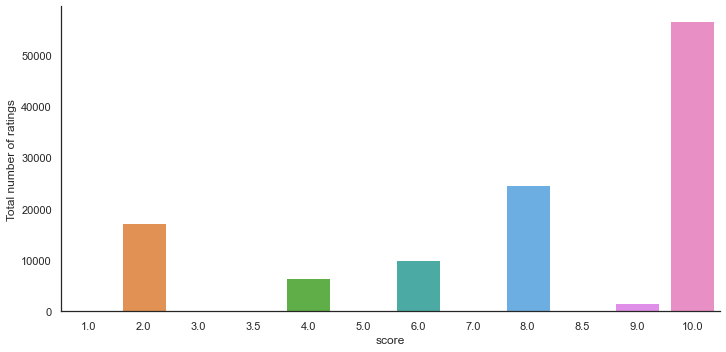

In [45]:
with sns.axes_style('white'):
    g = sns.factorplot("score", data=final_df, aspect=2.0, kind='count')
    g.set_ylabels("Total number of ratings")

### Building a popularity based model and recommending top 5 mobile phones

In [46]:
pd.DataFrame(final_df.groupby('product')['score'].mean().sort_values(ascending=False).head())

,score
product,
3220,10.0
Samsung SGH T401G,10.0
"HTC Desire 816G (Blue, 8GB)",10.0
HTC Desire 816,10.0
Samsung Galaxy S6 32GB G920F Gold,10.0


In [47]:
pd.DataFrame(final_df.groupby('product')['score'].count().sort_values(ascending=False).head())

,score
product,
"Lenovo Vibe K4 Note (White,16GB)",2897
"Lenovo Vibe K4 Note (Black, 16GB)",2415
"OnePlus 3 (Graphite, 64 GB)",1764
"OnePlus 3 (Soft Gold, 64 GB)",1687
"Lenovo Vibe K5 (Gold, VoLTE update)",1483


In [48]:
Review_AvgCount = pd.DataFrame(final_df.groupby('product')['score'].mean())

In [49]:
Review_AvgCount['Review_Counts'] = pd.DataFrame(final_df.groupby('product')['score'].count())

In [50]:
Review_AvgCount.score = Review_AvgCount.score.round(1)

In [51]:
Review_AvgCount.head()

,score,Review_Counts
product,,
3220,10.0,1
5.5-Inch Unlocked Lenovo A850 3G Smartphone-(960x540) Quad Core 4GB MT6582m 1331MHz Android 4.2 Dual Camera +Dual SIM -Black (Rooted + Google Play),5.6,5
"AICEK Coque ASUS ZenFone 2 ZE550ML/ZE551ML, AICEK Etui Silicone Gel ASUS ZenFone 2 Housse Antichoc ZenFone 2 Transparente Souple Coque de Protection pour ASUS ZenFone 2(5.5 Pouces)",9.6,28
"AICEK Coque ASUS ZenFone 3 Max ZC520TL, AICEK Etui Silicone Gel ASUS ZenFone 3 Max Housse Antichoc ZenFone 3 Max Transparente Souple Coque de Protection pour ASUS ZenFone 3 Max(5.2 Pouces)",9.6,27
"AICEK Coque ASUS ZenFone 3 ZE520KL, AICEK Etui Silicone Gel ASUS ZenFone 3 Housse Antichoc ZenFone 3 Transparente Souple Coque de Protection pour ASUS ZenFone 3(5.2 Pouces)",8.7,26


In [82]:
#Recommending top 5 mobile phones

Review_AvgCount[(Review_AvgCount['score'] >= 8.5) & (Review_AvgCount['Review_Counts'] >= 500)].head()

,score,Review_Counts
product,,
"Huawei P8 lite Smartphone, Display 5.0"" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco",8.7,555
Huawei P8lite zwart / 16 GB,8.5,500
"Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia]",9.1,735
"OnePlus 3 (Graphite, 64 GB)",8.5,1764
"Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G)",9.5,584


### Building a collaborative filtering model using SVD

In [53]:
#Reading the dataset

reader = Reader(rating_scale=(1,10))
data = Dataset.load_from_df(final_df, reader)

In [54]:
#Splitting the dataframe into test & train sets

trainset, testset = train_test_split(data, test_size=.30)

### Using SVD from Surprise library

In [55]:
algoSVD = SVD()

In [56]:
algoSVD.fit(trainset)                   #Fitting the model to the train set
predictions = algoSVD.test(testset)     #Predicting using the test test

In [57]:
predictions 

[Prediction(uid='Raffaele', iid='Huawei Ascend G510 Smartphone Touch, Fotocamera da 5 Megapixel, Wi-Fi, Nero', r_ui=10.0, est=8.20197180625602, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile)', r_ui=8.0, est=5.98409944272035, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Lenovo Zuk Z1 (White, Cyanogen OS)', r_ui=6.0, est=4.897968598753609, details={'was_impossible': False}),
 Prediction(uid='ebit', iid='Celular LG A275', r_ui=6.0, est=8.458952802246671, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero', r_ui=10.0, est=8.253948630302226, details={'was_impossible': False}),
 Prediction(uid='P', iid='Microsoft Nokia 3720 classic Handy (Outdoor, Bluetooth, E-Mail, Ovi, Kamera mit 2 MP) grey', r_ui=8.0, est=8.805655504633291, details={'was_impossible': False}),
 Prediction(uid='Amazon Custom

In [58]:
accuracy.rmse(predictions)              # Then computing RMSE

RMSE: 2.8149


2.814873456154504

### Building a collaborative filtering model using kNNWithMeans from Surprise and also, evaluating the collaborative model and RMSE value.

####  Item-based model

In [59]:
algo_item = KNNWithMeans(k=5, sim_options={'name': 'pearson_baseline', 'user_based': False})   
algo_item.fit(trainset)                              #Fitting the model

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [60]:
test_pred = algo_item.test(testset)               # run the trained model against the testset

In [61]:
test_pred                     #Predictions

[Prediction(uid='Raffaele', iid='Huawei Ascend G510 Smartphone Touch, Fotocamera da 5 Megapixel, Wi-Fi, Nero', r_ui=10.0, est=8.443783877253903, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile)', r_ui=8.0, est=8.0, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Lenovo Zuk Z1 (White, Cyanogen OS)', r_ui=6.0, est=5.2, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='ebit', iid='Celular LG A275', r_ui=6.0, est=7.6, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero', r_ui=10.0, est=9.792682898212519, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='P', iid='Microsoft Nokia 3720 classic Handy (Outdoor, Bluetooth, E-Mail, Ovi, Kamera mit 2 MP) grey', r_ui=8.0, est=7.17064488785053, details={'actual_k': 5, 'was_imp

In [62]:
print("Item-based Model : Test Set")
accuracy.rmse(test_pred, verbose=True)                      # getting RMSE

Item-based Model : Test Set
RMSE: 2.9719


2.9719360223056883

#### User based model

In [63]:
algo_user = KNNWithMeans(k=5, sim_options={'name': 'pearson_baseline', 'user_based': True})

In [64]:
algo_user.fit(trainset)                             #Fitting the model

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [65]:
# we can now query for specific predicions
uid = 'Eric'                                               #username
iid = 'Apple iPhone 7 Plus 5,5" 32 GB'                     #Product name

In [66]:
pred = algo_user.predict(uid, iid, verbose=True)

user: Eric       item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 7.90   {'actual_k': 0, 'was_impossible': False}


In [67]:
# running the trained model against the testset
test_pred = algo_user.test(testset)

In [68]:
test_pred                                 #Prediction

[Prediction(uid='Raffaele', iid='Huawei Ascend G510 Smartphone Touch, Fotocamera da 5 Megapixel, Wi-Fi, Nero', r_ui=10.0, est=9.827592036128495, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile)', r_ui=8.0, est=8.0, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Lenovo Zuk Z1 (White, Cyanogen OS)', r_ui=6.0, est=5.2, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='ebit', iid='Celular LG A275', r_ui=6.0, est=7.6, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero', r_ui=10.0, est=9.21832233706975, details={'actual_k': 5, 'was_impossible': False}),
 Prediction(uid='P', iid='Microsoft Nokia 3720 classic Handy (Outdoor, Bluetooth, E-Mail, Ovi, Kamera mit 2 MP) grey', r_ui=8.0, est=10, details={'actual_k': 3, 'was_impossible': False

In [69]:
print("User-based Model : Test Set")
accuracy.rmse(test_pred, verbose=True)                       # getting RMSE

User-based Model : Test Set
RMSE: 3.0060


3.0060120689044774

### Predicting the average rating for test users

In [70]:
for uid, iid, true_r, est, _ in test_pred:
    algo_user.predict(uid, iid, verbose=True)

user: Raffaele   item: Huawei Ascend G510 Smartphone Touch, Fotocamera da 5 Megapixel, Wi-Fi, Nero r_ui = None   est = 9.83   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular LG A275 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 9.22   {'actual_k': 5, 'was_impossible': False}
user: P          item: Microsoft Nokia 3720 classic Handy (Outdoor, Bluetooth, E-Mail, Ovi, Kamera mit 2 MP) grey r_ui = None   est = 10.00   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k'

user: Amazon Customer item: Sony Xperia SP C5302 Unlocked Phone--U.S. Warranty (Black) r_ui = None   est = 9.98   {'actual_k': 2, 'was_impossible': False}
user: ebit       item: Smartphone LG G4 H818P r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s 16 GB US Warranty Unlocked Cellphone - Retail Packaging (Rose Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cus

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500M/DS Factory Unlocked Dual Sim Smartphone - International Version (White) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 950 XL (Black, 32GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Knight 2 E471 (White-Champagne, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Th

user: einer Kundin item: Samsung Galaxy A3 (2017) Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Pedro      item: HTC ONE M8 5" 16GB 4G LTE ANDROID 4.4 EUROPA GRAY r_ui = None   est = 9.20   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Sony M4 Aqua Black UK Sim Free Smartphone r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4 H815 5.5-Inch Factory Unlocked Smartphone with Genuine Leather (Leather Red) - International Stock (No Warranty) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: SONY XPERIA Z3 COMPACT D5803 16GB (FACTORY UNLOCKED) INTERNATIONAL MODEL- WHITE No-Warranty r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon 

user: Rachel     item: Sony Ericsson XPERIA X10 Unlocked GSM Smartphone with 8 MP Camera, Android OS, Touch Screen, Wi-Fi and gps navigation--International Version with No Warranty (Black) r_ui = None   est = 7.80   {'actual_k': 0, 'was_impossible': False}
user: Melissa    item: Huawei P8 Lite wit / 16 GB r_ui = None   est = 7.99   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Bold 9780 Unlocked Cell Phone with Full QWERTY Keyboard, 5 MP Camera, Wi-Fi, 3G, Music/Video Playback, Bluetooth v2.1, and GPS (Black) r_ui = None   est = 6.00   {'actual_k': 4, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': 

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone Go 5" Smartphone, 8 GB, Dual SIM, Bianco [Italia] r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: vishal     item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 9.96   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500H/DS GSM Factory Unlocked Smartphone, International Version (Black) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Arun       item: Samsung Galaxy On7 r_ui = None   est = 7.70   {'actual_k': 1, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 J700M, 16GB, Dual SIM LTE, Factory Unlocked - Gold (International Version) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Kevin      item: Motorola Moto X 32GB Developer Editon - Verizon + GSM Unlocked, 4G LTE, Black/Woven White r_ui = None   est = 9.95   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 10 Lifestyle (Polar White, 32 GB) - with Hi-res earphones r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Apple iPhone 5C

user: Amazon Customer item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P (Aluminium Silver, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Newest Apple iPhone 4 MD200LL/A 8GB White For Verizon (No Contract) Sealed r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Doro PhoneEasy 612i GSM Sim Free Mobile Phone - Aubergine r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG X Power K220 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Moto G4 - Smartphone libre Android (5.5'', Full HD, 4G, 13 MP, 2 GB de RAM, 16 GB), color blanco 

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Sabrina    item: Samsung Galaxy Trend Plus Smartphone (10,1 cm (4 Zoll) TFT-Display, 1,2GHz Prozessor, 786MB RAM, 5 Megapixel Kamera, 4GB interne Speicher, Android 4.2.2) schwarz r_ui = None   est = 7.93   {'actual_k': 1, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG VX9700 Dare Verizon r_ui = None   est = 9.33   {'actual_k': 3, 'was_impossible': False}
user: Matt       item: ZTE ZMax2 No Contract Phone - Carrier Packaging (AT&T) r_ui = None   est

user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Huawei P9 lite Smartphone VNS-L31 (5,2 Zoll) Touch-Display, 16 GB interner Speicher, 3GB RAM, Android 6) schwarz r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: fabrizio   item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 8.53   {'actual_k': 5, 'was_impossible': False}
user: Andreas    item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) silber r_ui = None   est = 6.55   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Space Grey, 32GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Vivek      item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 4.64   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 SM-N910T 4G LTE - 32GB - Frost White (T-Mobile) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Donna      item: Unknown Straight Talk Samsung Galaxy Proclaim Prepaid Cell Phone Smartphone r_ui = None   est = 6.37   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: LG G4 H815 5.5-Inch Factory Unlocked Smartphone (Metallic Gold) - International Stock (No Warranty) r_ui = None   est

user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: Microsoft Lumia 640 - Smartphone libre Windows Phone (pantalla 5", 8 GB, Quad-Core 1.2 GHz, 1 GB RAM), blanco r_ui = None   est = 9.90   {'actual_k': 4, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3+ (Aqua Green, 32GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Klaus      item: Samsung Galaxy A3 Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) champagne-gold r_ui = None   est = 8.89   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S6 Edge SM-G925 32GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: marco      item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung SGH-U700 UMTS Handy silber (ohne Simlock) r_ui = None   est = 7.38   {'actual_k': 0, 'was_impossible': False}
user: Amazon Kunde item: Sony Xperia miro Smartphone (8,9 cm (3,5 Zoll) Touchscreen, 5 Megapixel Kamera, Android 4.0) schwarz r_ui = None   est = 7.38   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Huawei 771657 P8 Lite Smart Smartphone 16GB, Marchio Tim, Grigio Titanio r_ui = None   e

user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One (M8) Smartphone (12,7 cm (5 Zoll) LCD-Display, Quad-Core, 2,3GHz, 2GB RAM, 5 Megapixel Frontkamera, FM-Radio, Android 4.4.2) metallgrau - [T-Mobile-Branding] r_ui = None   est = 8.00   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520 UK Sim Free Smartphone - Red r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (White) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: LG enV2 VX-9100 Black QWERTY Cell Phone for Verizon Wireless r_ui = None   est = 7.07   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Nexus 6 Unloc

user: Amazon Customer item: Asus Zenfone 2 Laser ZE550KL ( White ,2GB Ram, 16GB ) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: tony       item: Sony Xperia L Smartphone (10,9 cm (4,3 Zoll) Touchcreen, 1GHz, Dual-Core, 1GB RAM, 8 Megapixel Kamera, NFC, Android 4.1) schwarz r_ui = None   est = 7.86   {'actual_k': 1, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S7 Smartphone (12,92 cm (5,1 Zoll) Touch-Display, 32GB interner Speicher, Android OS) pink r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Mahesh     item: Nokia New Nokia 10

user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Thomas     item: BLU Q170T Samba TV Unlocked Dual SIM Quad-Band GSM Phone (Black/Red) r_ui = None   est = 2.00   {'actual_k': 1, 'was_impossible': False}
user: Rafael     item: Samsung Galaxy Y r_ui = None   est = 4.06   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Sachin     item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 7.34   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Buyus Etui Housse Luxe Portefeuille Samsung Galaxy Grand Prime \ Grand Prime Value Edition SM-G530FZ + STYLET et 3 FILM OFFERT!! r_ui = None   est = 7.05   {'actual_k': 0, 'was_impossible': False}
user: Andy       item: EE Alcatel One Touch Pixi 3 3.5 inch r_ui = None   est = 8.22   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: AB         item: LG G4 H815 5.5-Inch Factory Unlocked Smartphone with Genuine Leather (Leather Red) - International Stock (No Warranty) r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = N

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Ian        item: Sony Xperia Z3 UK SIM-Free Smartphone - Copper r_ui = None   est = 6.69   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 626G+ (8GB,White Birch) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Displ

user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J710 Galaxy J7 Smartphone da 16 GB, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Susan      item: Sharp Aquos Crystal Silver (Boost Mobile) r_ui = None   est = 9.79   {'actual_k': 3, 'was_impossible': False}
user: ravi       item: HTC Desire 620G Dual SIM (Milkyway Grey, 8GB) r_ui = None   est = 7.65   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Oppo Neo 7 (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy Xcover 3 Handy (4,5 Zoll (11,4 cm) Touch-Display, 8 GB Speicher, Android 4.4) dunkelsilber r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Buyus Etui Housse Luxe Portefeuille Samsung Galaxy J3 (2016) SM-J320F avec Stylet et 3 Fi

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: david      item: Virgin Nokia 215 Mobile Phone - Black r_ui = None   est = 7.71   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 1520 SIM-Free Smartphone - White (Windows, 32 GB) r_ui = None   est = 9.95   {'actual_k': 3, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 6s 4,7" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Guest      item: Samsung Galaxy J3 (8GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display

user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo S850 (White, 16GB) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung S7 Unlocked GSM Smartphone, Gold, 32GB r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Bryan      item: LG G2 D800 GSM 4G LTE Unlocked Smartphone with 13MP Camera, 32GB, Black r_ui = None   est = 7.79   {'actual_k': 2, 'was_impossible': False}
user: Patrick    item: Sim Free Samsung Galaxy S7 Edge Mobile Phone - Black. r_ui = None   est = 9.24   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Tech Armor Galaxy S6 Screen Protector, Tec

user: Amazon Kunde item: Huawei Ascend G7 Smartphone (13,97 cm (5,5 Zoll) IPS-Display, 13 Megapixel Kamera, 16 GB Interner Speicher, Android 4.4) schwarz- grau r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Valentina  item: Samsung A300 Galaxy A3 Smartphone, 16 GB, Bianco [Italia] r_ui = None   est = 9.78   {'actual_k': 5, 'was_impossible': False}
user: Diego      item: DOOGEE X5 Pro -- 4G Smartphone 5.0" IPS Android 5.1 Lollipop MT6735 Quad Core 1.0GHz Cellulare Dual SIM 2GB RAM 16GB ROM DG Xender intelligente Wake Air Gesti GPS WIFI (Bianco) r_ui = None   est = 9.63   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Buyus Coque Gel 360 Protection INTEGRAL Transparent INVISIBLE Samsung Galaxy A3 (2016) SM-A310F + Stylet + 3 Films OFFERTS r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Samsung G530 Galaxy Grand Prime Smartphone, 8 GB, Marchio TIM, Grigio [Italia] r_ui = None   est = 9.11   {'actual

user: matteo     item: Samsung A300 Galaxy A3 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 8.62   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Tech Armor Galaxy S6 Screen Protector, Tech Armor High Definition HD-Clear Samsung Galaxy S6 Film Screen Protector [3-Pack] r_ui = None   est = 8.01   {'actual_k': 2, 'was_impossible': False}
user: Davide     item: Microsoft Lumia 535 Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 9.25   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Klaus      item: Samsung Wave II S8530 Smartphone (9,5 cm (3,7 Zoll) Display, Super Clear LCD Touchscreen, 5 Megapixel Kamera) ebony-gray r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Nokia 215 (Dual SIM, Green) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': Fa

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Luke       item: LG Nexus 5 Smartphone, memoria 16GB, Android 4.4, Nero [Italia] r_ui = None   est = 8.60   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 9.62   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Honor 6 Smartphone (5 pollici, Touchscreen, Octa-Core, 3GB RAM, 16GB ROM, fotocamera principale da 13MP, fotocamera frontale da 5MP, LTE CAT6, Android 4.4, EmotionUI 2.3, SIM singola) Bianco r_ui = None   est = 7.69   {'actual_k': 5, 'was_impossible': False}
user: Dennis     item: HP Palm Veer 4G P160 Unlocked GSM Phone with QWERTY Keyboard, WebOS, Touchscreen, Wi-Fi and GPS - Black r_ui = None   est = 8.26   {'actual_k': 0, 

user: John       item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Julian     item: Samsung Galaxy S5 Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 4.4) electric blue r_ui = None   est = 7.43   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'wa

user: Mario      item: Nokia 6510 r_ui = None   est = 8.63   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Oxford Steet 2015 Newest CUBOT X9 5.0'' Octa Core Android 4.4 Kitkat OS Unlocked 3G Smartphone -- IPS HD Touchscreen HotKnot MTK6592 Dual SIM Dual Standby Mobile Phone 2G RAM 16G ROM WIFI OTG GPS Finger Gesture Air Gesture Cellphone 3G Phablet (Black) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Samsung G935 Galaxy S7 Edge Smartphone da 32GB, Argento [Italia] r_ui = None   est = 9.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3+ (Aqua Green, 32GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO V5 (Crown gold, 32 GB) (4 GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: Apple iPhone SE (Gold, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC ONE M9 32GB Unlocked GSM 20MP Camera Smartphone, Gunmetal Grey r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: stefano    item: Asus ZenFone 2 Smartphone 5.5 pollici HD, RAM 2 GB, 16 GB, 4G/LTE, Nero r_ui = None   est = 8.88   {'actual_k': 5, 'was_impossible': False}
user: Thomas     item: Asus ZenFone Go 5" Smartphone, 8 GB, Dual SIM, Bianco [Italia] r_ui = None   est = 8.31   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Ama

user: Tim        item: Sony Ericsson Xperia mini pro Smartphone (7,6 cm (3 Zoll) Display, QWERTZ-Tastatur, Touchscreen, 5 MP Kamera, Android 2.3 OS) schwarz r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: APPLE iPhone 7 - Silver, 128 GB r_ui = None   est = 9.43   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Denis      item: Nokia Lumia 625 r_ui = None   est = 8.96   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Alcatel OneTouch 10.16G UK SIM-Free Mobile Phone - Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G360 Galaxy Core Prime Smartphone, 8 GB, Marchio TIM, Argento [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Smartphone 5 pollici, RAM 2 GB, 8 GB, 4G/LTE, Nero r_ui = No

user: Rahul      item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge G925F 32GB Unlocked GSM 4G LTE Octa-Core Smartphone - Gold Platinum r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X LG-H791 (16GB, Ice Blue) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy A3 (2016) 16GB White r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossib

user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO V5 (Crown gold, 32 GB) (4 GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung i9192 Galaxy S4 mini DuoS ohne Vertrag schwarz r_ui = None   est = 6.92   {'actual_k': 2, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Apple iPhone 6S 16GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sam

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: sergio     item: Apple iPhone 6s 64GB 4G Oro r_ui = None   est = 9.86   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Nero/Oro r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: giorgio    item: Honor 7 Smartphone 4G, Display Full HD 5.2 Pollici, Processore Kirin 935 Octa Core 2.2 GHz, 16 GB Memoria Interna, 3 GB RAM, Fotocamera 20 MP, Grigio r_ui = None   est = 6.30   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 550 Smartphone (4,7 Zoll (11,9 cm) Touch-Displ

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: HTC Sensation XE Smartphone mit Beats Audio (10.9 cm (4.3 Zoll) Touchscreen, Android 2.3 OS, 1.5 GHz Dual Core Prozessor, 8 MP Kamera) schwarz r_ui = None   est = 9.39   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Grey, 32GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 950 XL RM-1085 32GB White, Single Sim, 5.7", 20MP, 3GB Ram, Unlocked International Model, No Warranty r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: David      item: BlackBerry Pearl 8110 r_ui = None   est = 8.02   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 650 Dual-SIM Smart

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Massimo    item: Samsung Galaxy Note II, GT-N7100, Grigio Titanio [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Samsung S8000 Jet Smartphone (Touchscreen, 5MP Kamera, WLAN, HSDPA) metallic-black r_ui = None   est = 5.34   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 Mini G730A Unlocked Cellphone, Blue r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Christine  item: Sony M4 Aqua White UK Sim Free Smartphone r_ui = None   est = 7.42   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE Smartphone (4 Zoll (10,2 cm) Touch-Display, 16 GB Speicher, IOS) silber r_ui = None   est = 9.00   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Honor Huawei Honor 6X Dual Camera Unlocked Smartphone, 32

user: tony       item: EE Nokia 130 Mobile Phone - Black r_ui = None   est = 8.08   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Microsoft Lumia 640 Smartphone, Dual-SIM, Display HD-IPS 5 Pollici, Processore Quad-Core 1,2GHz, Fotocamera 8 MP, Memoria 8GB, Win 8.1, Bianco [Germania] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 4 Play XT1603 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: M          item: Tracone Motorola EX431G Prepaid Phone With Triple Minutes (Tracfone) r_ui = None   est = 3.81   {'actual_k': 1, 'was_impossibl

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy SIII UK SIM-Free Smartphone - Pebble Blue (16GB) - Discontinued by manufacturer r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Sarah      item: Huawei Ascend Mate 7 Smartphone (6 Zoll (15,2 cm) Touch-Display, 16 GB Speicher, Android 4.4) silber r_ui = None   est = 9.21   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: BLU Life Play Unlocked Dual Sim Phone with Quad-Core 1.2GHz Processor, Android 4.2 JB, 4.7-inch IPS HD Display, 4G HSPA+ up to 42Mbps and 8MP Camera (White) r_ui = None   est = 9.63   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est =

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Wiko Lenny 3 Smartphone, Dual-SIM, Memoria Interna da 16 GB, Oro r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S6 Edge SM-G925 32GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited 

user: Amazon Customer item: Microsoft Lumia 640XL LTE Smartphones(BLACK) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Valentina  item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 9.00   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Asus ZenFone 2 Laser 5.5" Smartphone, 16 GB, Dual SIM, Nero [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: AJ         item: Nokia 6300 SIM-Free Mobile Phone - Silver r_ui = None   est = 6.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_u

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ASUS ZenFone 2 Laser Unlocked Smartphone, 3GB RAM, 32GB Storage r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.2 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Nero [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 5-Inch (2nd Gen UK Stock) Dual Sim 8GB SIM-Free Smartphone White (discontinued by manufacturer) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossi

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo P70 A (Blue) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Kyocera DuraXV, Dark Grey 4GB (Verizon Wireless) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A076IN (Black, 3GB, 32GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: Huawei Ascend P8 Smartphone, Display 5.2" FHD, Memoria RAM da 3 GB, Processore HiSilicon Kirin 930 Octa-Core, Fotocamera Principale 13 MP, Champagne r_ui = None   est = 9.09   {

user: ebit       item: Smartphone Motorola Moto Maxx XT1225 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4 16GB (White) - Verizon CDMA No SIM Slot r_ui = None   est = 7.88   {'actual_k': 4, 'was_impossible': False}
user: Terry      item: Samsung Galaxy S4 i9500 Factory Unlocked Cellphone, International Version, 16GB, Black r_ui = None   est = 8.00   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Mario      item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 6.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One 32GB UK SIM Free Smartph

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Franco     item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 6.48   {'actual_k': 5, 'was_impossible': False}
user: Emily      item: HTC One M7 - 32GB UK SIM-Free Smartphone - Silver (discontinued by manufacturer) r_ui = None   est = 8.03   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Nokia 215 (Dual SIM, Green) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Core Prime, Charcoal Grey 8GB (Verizon Wireless) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One M7 - 32GB UK SIM-Free Smartphone - Silver (discontinued by manufacturer) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend Mate 7 Smartphone, Display IPS 6", Octa-Core da 

user: Peter      item: Samsung Galaxy S5 SM-G900A 16GB AT&T Branded Smartphone (Unlocked, Copper Gold) r_ui = None   est = 9.83   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG K7 4G K330 LTE, Android, 8GB, No-Contract T-Mobile Phone, Black r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G3 D850 32GB Unlocked Smartphone, GSM 4G LTE-Quad-HD, 5.5-Inch,(Metallic Black) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X Unlocked Smartphone with 5.2-Inch 32GB H790 4G LTE (Carbon Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
use

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 635 (AT&T Go Phone) No Annual Contract r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520 GSM Unlock 3G Phone, 4-Inch Touch Screen, 5MP 720P Camera, Windows Phone (Black) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Robert     item: Motorola VE240 r_ui = None   est = 7.95   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Sony Xperia M Smartphone, Nero [Italia] r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Andrea     item: Lenovo Motorola Moto E 2a Generazione Smartphone, LTE, 8 GB, RAM 1 GB, Nero [Italia] r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
us

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy A5 (Midnight Black, 16GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Jerry      item: ZeroLemon [180 days warranty] ZeroLemon Samsung Galaxy S III 7000mAh Extended Battery + Free Black Extended TPU Full Edge Protection Case / ***NFC for S Beam and Google Wallet***- WORLD'S HIGHEST S3 BATTERY CAPACITY - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Gabriele   item: LG D722 G3 S Smartphone, 8 GB, Oro [Italia] r_ui = None   est = 7.67   {'actual_k': 5, 'was_impossible': False}
user: Lorenzo    item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Foto

user: Valentina  item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia M4 Aqua 16GB GSM/LTE Unlocked Cell Phone - Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G2 D801 Unlocked Cellphone, 32GB, Black r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Lisa       item: APPLE iPhone 7 - Silver, 32 GB r_ui = None   est = 7.

user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cristian   item: Meizu M3S Smartphone, Dual-SIM, 16 GB, Grigio r_ui = None   est = 8.05   {'actual_k': 2, 'was_impossible': False}
user: Antonio    item: Huawei Ascend Mate 7 Smartphone, Memoria 32GB, 3GB RAM, DualSIM LTE, colore: Oro r_ui = None   est = 8.70   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Dual SIM, Cyan) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Huawei U8860 Smartphone (10,2 cm (4 Zoll) Display, 8 Megapixel Kamera, UMTS, Android 2.3) schwarz r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Thomas     item: Huawei P8 Champagne / 16 GB r_ui = None   est = 7.67   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer

user: Yvonne     item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo K6 Note Smartphone Dual SIM, Display 5.5 Pollici, LTE, Fotocamera 16 MP, Memoria 32 GB, 3 GB RAM, Argento [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Greg       item: Samsung Galaxy Centura Android Prepaid Phone (TracFone) r_ui = None   est = 3.86   {'actual_k': 4, 'was_impossible': False}
user: Jo         item: Samsung E2121 Handy (3,9 cm (1,5 Zoll) Display, Bluetooth, VGA Kamera) rot r_ui = None   est = 7.81   {'actual_k': 0, 'was_impossible': False}
user: MM         item: Samsung GT-B2710KRADBT B2710 Smartphone (5,1 cm (2 Zoll) TFT-Farbdisplay, V2.1 Bluetooth, 36MB interne Speicher) schwarz/rot r_ui = None   est = 9.26   {'actual_k': 5, 'was_impossible': False}
user: 

user: steve      item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 8.34   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Buyus Coque Gel 360 Protection INTEGRAL Transparent INVISIBLE Samsung Galaxy A3 (2016) SM-A310F + Stylet + 3 Films OFFERTS r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Bold 9900 GSM Factory Unlocked Phone - No Warranty (Black) r_ui = None   est = 6.99   {'actual_k': 5, 'was_impossible': False}
user: Johan      item: Sony Ericsson Elm Handy (UMTS, aGPS, Bluetooth, WiFi, 5MP) pearly rose r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: Mac        item: Nokia 301 Sim Free Mobile Phone - White r_ui = None   est = 8.59   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   es

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Leonardo   item: Samsung Galaxy Star Smartphone, Nero [Italia] r_ui = None   est = 9.48   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S7 SM-G930 32GB r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 No Contract Phone, 16GB ROM / 2GB RAM, 5.5 Inch - White - (Boost Mobile) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Stefania   item: BlackBerry Q10 Smartphone, schermo amoled da 3,1", Cortex-A9 Dual-Core, 1,5GHz, 2GB RAM, 16GB, fotocamera 8 Megapixel, tastiera Qwertz, BlackBerry 10 OS, Bianco [Germania] r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: AmazonKunde item:

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: J          item: Nokia Lumia 635 8GB Unlocked GSM 4G LTE Windows 8.1 Quad-Core Smartphone - Black r_ui = None   est = 5.79   {'actual_k': 1, 'was_impossible': False}
user: Wendy      item: LEAGOO EASYSMX Leagoo Lead 6 Smart Phone Android 4.4.2 MTK Dual-Core Processer 4.5 inch IPS Display 1600 mAh Lithium Battery Dual Camera 2G/3G Dual SIM Standby White r_ui = None   est = 7.15   {'actual_k': 2, 'was_impossible': False}
user: frank      item: Microsoft Nokia 3720 classic Handy (Outdoor, Bluetooth, E-Mail, Ovi, Kamera mit 2 MP) grey r_ui = None   est = 9.32   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics GM360 Viewty Plus Smartphone (7,6 cm (3 Zoll) Display, Touchscreen, 5 Megap

user: Amazon Customer item: HTC Sprint HTC Evo 4G Android Cell Phone (Black), Without Contract r_ui = None   est = 2.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Lukas      item: Samsung Galaxy S5 Mini G800H Unlocked Cellphone, International Version, 16GB, Black r_ui = None   est = 9.70   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X Unlocked Smartphone with 5.2-Inch 32GB H790 4G LTE (Carbon Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: robert     item: LG 840G Prepaid Phone (Net10

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: TP-Link AC1300 Wireless Dual Band PCI-Express Adapter (Archer T6E) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S III 16GB SPH-L710 Marble White - Sprint r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Aditya     item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 7.95   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Silver, 64GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Nico       item: Nokia 113 Handy (4,6 cm (1,8 Zoll), 0,3 Megapixel Kamera, Bluetooth) cyan r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Kunde      item: Huawei Ascend G750 Smartphone (13,9 cm (5,5 Zoll) HD-Display, 13 Megapixel Kamera, 8 GB Interner Speicher, Andro

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Jen        item: HTC Desire 816 Black (Virgin mobile) - 5.5 inch S-LCD Display r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Ascend Y550 UK SIM-Free Smartphone - Black (4G, 4.5-inch, 1.2 GHz quad core, 5MP and 2MP cameras, Android 4.4, 4 GB Storage + MicroSD) r_ui = None   est = 8.67   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: BLU LIFE 8 Unlocked (White) r_ui = None   est = 3.01   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 3 Deluxe 5.7-inch AMOLED FHD display, 6GB RAM 64GB storage Unlocked Dual SIM Cell Phone, US Warranty (ZS570KL-Glacier Silver) r_ui = None   est = 8.40   {'actual_k': 

user: Amazon Customer item: Samsung Galaxy E5 (White,16GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, Black) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: MaxMML     item: Nokia C7   r_ui = None   est = 9.99   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: sergio     item: iPhone 4 - 16GB (Nero) r_ui = None   est = 2.03   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Samsung GALAXY S7 EDGE G935FD DUAL SIM INTERNATIONAL VERSION NO WARRANTY (GOLD) r_ui = None   e

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Wolfgang   item: Samsung Star S5230 Smartphone (Touchscreen, 3MP Kamera, Video, MP3-Player, Bluetooth) black gold r_ui = None   est = 8.47   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, Black) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LT

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A536 (Black, 8GB) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Gold, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy C9 Pro (Gold, 6GB RAM) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Sam        item: Samsung Galaxy Note, i717 16GB Unlocked GSM 4G LTE 8MP Camera Smartphone with S Pen Stylus - White r_ui = None   est = 7.89   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Blackberry PRIV STV100-4 Smartphone (13,7 cm (5,4 Zoll) Display, 32GB Speicher, 18 Megapixel, Android 5.1) schwarz r_ui = None   

user: Pietro     item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry PRIV Factory Unlocked Smartphone, U.S. Warranty (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Claudio    item: BlackBerry Curve 8320 r_ui = None   est = 9.14   {'actual_k': 0, 'was_impossible': False}
user: Stefano    item: Nokia C2-01, Nero 

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Anna       item: Samsung Galaxy Ring (Virgin Mobile) r_ui = None   est = 4.79   {'actual_k': 4, 'was_impossible': False}
user: Naveen     item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.99   {'actual_k': 3, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM-J320M r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k':

user: ebit       item: Smartphone Nokia Lumia 530 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4 8GB for Straight Talk - BLACK r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Tom        item: Samsung Galaxy S5 White 16GB (Virgin Mobile) r_ui = None   est = 10.00   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy S7 32GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.30   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Knight 2 E471 (White-Champagne, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Pasquale   item: Honor 6X Smartphone 4

user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia E5 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Edge SM-G935UZSAXAA Unlocked smartphone, 32 GB, US Warranty - Silver r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Ray        item: Casio GzOne C731 Rock, Black (Verizon Wireless) CDMA. - No Contract Required. r_ui = None   est = 2.47   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Motorola Droid X2 No Contract Verizon Cell Phone r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon C

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 820 8GB GSM 4G LTE Windows 8 Smartphone - Black - AT&T - No Warranty r_ui = None   est = 8.04   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 816G Octa-core (White, 16GB) r_ui = None   est = 6.67   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular LG A275 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei W1 Stainless Steel Classic Smartwatch with Leather Strap [Energy Class A+++] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: DOOG

user: Matteo     item: Huawei P9 Plus Smartphone, LTE, Display 5.5'' FHD, 64 GB Memoria Interna, 4 GB RAM, Fotocamera 12 MP, Batteria 3400 mAh, Grigio r_ui = None   est = 9.10   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation LTE UK SIM-Free Smartphone - White r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 (Space Grey, 32GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core,

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: BlackBerry 8220 Flip Pearl Unlocked Phone , GPRS, EDGE, and 2 MP Camera--International Version with No Warranty r_ui = None   est = 7.01   {'actual_k': 0, 'was_impossible': False}
user: Giovanni   item: Huawei Nexus 6P Smartphone, Display 5.7 Pollici, Memoria interna 32 GB, 3 GB da RAM, Fotocamera 12.3 MP, Android 6.0, Grigio r_ui = None   est = 9.89   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Rafael     item: Samsung Ch@t 335 r_ui = None   est = 7.86   {'actual_k': 2, 'was_impossible': False}
user: James      item: LG Voyager r_ui = None   est = 6.96   {'actual_k': 4, 'was_impossible': False}
user: Josh       item: Samsung Galaxy Note, i717 16GB Unlocked GSM 4G LTE 8MP Camera Smartphone with

user: Amazon Customer item: Apple Smartphone iPhone 4s, Nero [Italia] r_ui = None   est = 7.72   {'actual_k': 4, 'was_impossible': False}
user: diego      item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Maria      item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 5.37   {'actual_k': 5, 'was_impossible': False}
user: christian  item: Nokia 500  r_ui = None   est = 5.78   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: frank      item: Apple iPhone 4 r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: einem Kunden item: Samsung Galaxy S7 Smartp

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Smartphone, Schermo da 5.5" Full HD, Processore Quad Core 2,3 GHz, RAM 4 GB, 32 GB, 4G/LTE, Argento r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Sony Xperia Z3 Compact - Smartphone (11,68 cm (4.6"), 1280 x 720 pixeles, 2,5 GHz, Qualcomm Snapdragon, 2048 MB, MicroSD (TransFlash)), Nano sim card, color negro r_ui = None   est = 8.14   {'actual_k': 5, 'was_impossible': False}
user: Martin     item: HTC One X White r_

user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520 GSM Unlock 3G Phone, 4-Inch Touch Screen, 5MP 720P Camera, Windows Phone (Black) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Carlo      item: Huawei Y6 Smartphone, Display 5.0" HD, IPS, 2 GB RAM, 8 GB Memoria Interna, Dual SIM, Fotocamera 8 MP, Android 5.1, Nero r_ui = None   est = 8.26   {'actual_k': 5, 'was_impossible': False}
user: Leo        item: LG G4 US991 32GB Smartphone (Unlocked, Black Leather) r_ui = None   est = 6.44   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kundenrezensionen item: BlackBerry Passport Smartphone (11,4 cm (4,5 Zoll) Display, Nano-SIM, QWERTZ, 32GB interner Speicher, 13 Megapixel... r_ui = None   est = 10.00   {'actual_

user: Amazon Customer item: Samsung Galaxy Note 4 SM-N910H Factory Unlocked, International Version, 32GB, Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Tommy      item: Cubot S308 5'' Android 4.2 Quad Core sbloccato Smartphone 3G - 5-Punti IPS HD Touchscreen MTK6582 1.3GHz 2GB di RAM + ROM 16G Cellulare Dual SIM 8.0MP + 5.0MP macchina fotografica 3G GPS del cellulare Bluetooth WAP WIFI phablet + Free Flip in pelle PU caso(Nero) r_ui = None   est = 7.71   {'actual_k': 0, 'was_impossible': False}
user: Giovanni   item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Nero/Oro r_ui = None   est = 8.46   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Disp

user: Cliente Amazon item: Samsung G800 Galaxy S5 Mini Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 2 Unlocked Cellphone, 16GB, Black r_ui = None   est = 2.00   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung I8160 Galaxy Ace 2 Sim Free Mobile Phone r_ui = None   est = 9.99   {'actual_k': 3, 'was_impossible': False}
user: Amazon Kunde item: Doogee X5 5.0 Zoll HD Smartphone Android 5.1 3G WCDMA MTK6580 Quad Core ROM 1G RAM 8G 5MP 8MP Doppelkameras r_ui = None   est = 8.00   {'actual_k': 5

user: Massimo    item: BlackBerry Bold 9000 r_ui = None   est = 7.78   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 2 Unlocked Cellphone 

user: Sandra     item: Samsung Galaxy Ace Plus S7500 Smartphone (9,3 cm (3,7 Zoll) Touchscreen, 5 Megapixel Kamera, Android 2.3) chic-white r_ui = None   est = 8.13   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) schwarz r_ui = None   est = 6.50   {'actual_k': 5, 'was_impossible': False}
user: CJ         item: Samsung Convoy 3 SCH-U680 Rugged 3G Cell Phone Verizon Wireless r_ui = None   est = 7.61   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kundenrezensionen item: Motorola Moto G 3. Generation Smartphone (12,7 cm (5 Zoll ) Touchscreen-Display, 16 GB Speicher, Android 5.1.1... r_ui = 

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: claudia    item: Acer Liquid E2 Duo Smartphone, Nero [Francia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG Google Nexus 5X H791 ( 32GB, Carbonio ) Versione Europea 5,2'' , Android 6.0 Marshmallow r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J2 6 4G DUOS SM-J210FZDDINS (Gold, 8GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G (1st Generation) - Black - 8 GB - Global GSM Unlocked Phone r_ui = None   est = 5.03   {'

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Matteo     item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Dual (Lime Gold) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Lukas      item: Samsung E2550 Handy (Social Networking Dienste, Kamera, MP3-Player) strong-black r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900A GSM Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: 

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: LG G4 H815 5.5-Inch Factory Unlocked Smartphone with Genuine Leather (Leather Black) - International Stock (No Warranty) r_ui = None   est = 5.49   {'actual_k': 2, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy J3 (2016) DUOS Smartphone (5,0 Zoll (12,63 cm Touch-Display, 8 GB Speicher, Android 5.1) gold r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: MS         item: Samsung Galaxy A5 Smartphone (5 Zoll (12,7 cm)Touch-Display, 16 GB Speicher, Android 4.4) champagne gold r_ui = None   est = 6.92   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG Leon H326TV r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 G930F 32GB Factory Unlocked GSM Smartphone International Version (Gold) r_ui = None   est = 6.80   {'

user: Paul       item: CUBOT S208 5.0 Inch IPS Screen MTK6582M 1.3GHz 1GB/16GB Android 4.2 Dual SIM Wifi Bluetooth Smartphone (Black+... r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: Dan        item: LG Electronics Nexus 5X 5.2-inch 16 GB SIM-Free Smartphone - Black r_ui = None   est = 1.83   {'actual_k': 1, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S3 mini (GT-I8200) Smartphone (4 Zoll (10,2 cm) Touch-Display, 8 GB Speicher, Android 4.2) blau r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: HTC One (M8) Smartphone (12,7 cm (5 Zoll) LCD-Display, Quad-Core, 2,3GHz, 2GB RAM, 5 Megapixel Kamera, FM-Radio, Android 4.4.2) silber - [T-Mobile-Brandi

user: Amazon Customer item: Samsung Galaxy J7 No Contract Phone, 16GB ROM / 2GB RAM, 5.5 Inch - White - (Boost Mobile) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Ulefone Paris 4G MTK6753 smartphone Android 5,1 64 bit Octa Core 5.0" 2,5 D arco HD IPS 2G + 16g 5MP 13MP Dual Fotocamere Smartphone r_ui = None   est = 8.43   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: HOMTOM HT7 3G WCDMA 5.5 "IPS smartphone Android 5.1 OS Quad Core MTK6580A r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Verizon WIRELESS CELL PHONE SAMSUNG U460 INTENSITY II METALLIC BLUE PHONE NO CONTRACT REQUIRED WORKS ON VERIZON WIRELESS OR PAGE PLUS NETWORK ONLY r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenov

user: Alessandro item: Samsung G3500 Galaxy Core Plus Smartphone, 4 GB, Bianco [Italia] r_ui = None   est = 8.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Moto G4 - Smartphone libre Android (5.5'', Full HD, 4G, 13 MP, 2 GB de RAM, 16 GB), color blanco r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Peter      item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: 

user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Stratosphere I405 4G LTE CDMA Android Slider Phone, Black (Verizon) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC DESIRE 628h 2PVG200 Dual Sim(4G),(Sunset Blue) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Smart Prime 6 Pay As You Go Handset Smartphone - Silver r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: mike       item: Samsung Galaxy S6 Edge G925i 32GB Unlocked GSM LTE Octa-Core Phone w/ 16MP Camera - Black Sapphire INTERNATIONAL VERSION NO WARRANTY r_ui = None   est = 7.85   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Pantech P704

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Patricia   item: Apple iPhone 4S 16GB Unlocked GSM World Smartphone w/ Siri and iCloud - White r_ui = None   est = 7.78   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OPPO Digital F1 Plus (Gold, 4GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Nico       item: Nokia C3   r_ui = None   est = 8.14   {'actual_k': 0, 'was_impossible': False}
user: Klaus      item: HTC Desire Smartphone (5 MP, HSPA, Android 2.1, HTC Sense) r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 5S 16GB Grigio [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Bl

user: Salvatore  item: Alcatel Pixi 4 Smartphone - 3G, 8 GB, 5", Nero r_ui = None   est = 9.45   {'actual_k': 5, 'was_impossible': False}
user: Pierre     item: Samsung Galaxy S7 r_ui = None   est = 8.68   {'actual_k': 0, 'was_impossible': False}
user: Roberto    item: Nokia Asha 210 Smartphone Dual SIM, Nero [Italia] r_ui = None   est = 4.25   {'actual_k': 5, 'was_impossible': False}
user: vesponethebest item: Samsung S3650 Corby r_ui = None   est = 8.55   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 3 Smartphone, Memoria Interna da 64 GB, Dual-SIM, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Samsung Wave 3 S8600 Smartphone (10.2 cm (4 Zoll) Super AMOLED-Touchscreen, 1.4 GHz Prozessor, 5 MP Kamera) metallic black r_ui = None   est = 7.50   {'actual

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone Max Smartphone, Schermo da 5.5" HD, 16 GB, RAM 2 GB, Dual SIM, Nero [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Karl       item: Microsoft Lumia 950 XL RM-1085 32GB White, Single Sim, 5.7", 20MP, 3GB Ram, Unlocked International Model, No Warranty r_ui = None   est = 7.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520 GSM Unlock 3G Phone, 4-Inch Touch Screen, 5MP 720P Camera, Windows Phone - Black (International Version) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}


user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: LG D855 G3 Smartphone, 32 GB, Nero Metallico [Italia] r_ui = None   est = 9.32   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S III, White 16GB (Sprint) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 635 8GB Unlocked GSM 4G LTE Windows 8.1 Quad-Core Phone - Black r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossi

user: Manuel     item: Microsoft Nokia Lumia 1020 Smartphone (11,8 cm (4.5 Zoll) PureMotion HD+ OLED Touchscreen mit ClearBlack Technologie, 41 Megapixel, 32 GB, Windows 8) gelb r_ui = None   est = 7.90   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 2 Unlocked Cellphone , 64GB, Silver (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: schreef    item: Samsung Galaxy J5 (2016) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Elena      item: Apple iPhone 6 

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 (New 2016 Edition) (White, 16 GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: martin     item: Microsoft Lumia 650 Smartphone da 16GB, Dual SIM, Bianco [Italia] r_ui = None   est = 7.75   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei 

user: carlos     item: LG Optimus L5 - Smartphone libre Android (pantalla t??ctil de 4") color negro [Importado de Alemania] r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: Sarah      item: Apple iPhone 5c AT&T Cellphone, 16GB, Blue r_ui = None   est = 7.43   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Samsung SM-N910F Galaxy Note 4 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 9.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 630 (Bright Green, Dual SIM) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Justin     item: Samsung Galaxy Note GT-N7000 Unlocked Phone--International Version (Blue) r_ui = None   est = 6.00   {'actual_k': 2, 'was_impossible': False}
user: Sara       item: Doogee Valencia DG800 - Smartphone libre de 4.5" (MTK6582, Cortex A7 Quad Core 1.3 GHz, 1 GB de RAM, 8 GB de memoria interna, Android 4.4) r_ui = None   est = 8.21   {'actual_k': 0, 'was_

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: James      item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 5.28   {'actual_k': 5, 'was_impossible': False}
user: Massimo    item: Asus ZenFone 2 Selfie Smartphone, 32 GB, Dual SIM, Aqua Blu [Italia] r_ui = None   est = 9.49   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Samsung Galaxy S5 Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 4.4) electric blue r_ui = None   est = 7.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: JC         item: BlackBerry Torch 9850 CDMA Verizon Cell Phone - Black r_ui = None   est = 7.94   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impo

user: Patricia   item: Motorola Milestone Droid Unlocked Touchscreen Phone with 5 MP Camera, Wi-Fi, GPS and QWERTY Keyboard - Unlocked Phone - No Warranty (Black) r_ui = None   est = 7.78   {'actual_k': 0, 'was_impossible': False}
user: fabio      item: Apple iPhone 5C 16GB - sbloccato - blu / ciano r_ui = None   est = 9.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Apple iPhone 6s 64GB 4G Oro r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 SGH-I337 USA GSM Unlocked Cellphone, 16GB, Frost White r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00  

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Studio 5.0 HD LTE with 5-Inch HD Display, 13MP Camera, Android KitKat v4.4 and 4G LTE HSPA+ Unlocked Cell Phone- Black r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Rafael     item: Samsung Ch@t 335 r_ui = None   est = 7.86   {'actual_k': 2, 'was_impossible': False}
user: antonio    item: Microsoft Lumia 640 - Smartphone libre Windows Phone (pantalla 5", 8 GB, Quad-Core 1.2 GHz), azul r_ui = None   est = 8.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: DOOGEE X5 MAX Pro Smartphone 4G FDD-LTE Android 6.0 MTK6737 64-bit 5.0" IPS HD 1280 * 720 Pixels 2G+16G 8MP+8MP Dual Cameras Fingerprint Unlock Smart Gesture OTG r_ui = None   est = 7.52   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k'

user: Victor     item: Sim Free iPhone 7 32GB Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: Markus     item: Honor 7 Smartphone (13,2 cm (5,2 Zoll) Touchscreen, 16GB interner Speicher, Android OS) grau r_ui = None   est = 9.27   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: Lenovo Motorola Moto G XT1541 3a Generazione Smartphone, 5-Inch, 4G/LTE, Fotocamera 13 MP, 16 GB, 2 GB RAM, Bianco r_ui = None   est = 9.65   {'actual_k': 5, 'was_impossible': False}
user: Marc       item: HTC Wildfire S Smartphone (8.1 cm (3.2 Zoll) Touchscreen, WiFi (b/g/n), Android OS 2.3.3) schwarz r_ui = None   est = 7.15   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Nokia Lumia 635 8GB Unlocked GSM 4G LTE Windows 8.1 Quad-Core Ph

user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: Samsung Galaxy 3 i5800 Smartphone (Touchscreen, 3 Megapixel Kamera, Android 2.1) deep-black r_ui = None   est = 8.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: alex       item: Sony Xperia Z5 Premium E6853 5.5-Inch 4K UHD Display Factory Unlocked (BLACK) - International Stock No Warranty r_ui = Non

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: pedro      item: Celular LG Messenger GT360 r_ui = None   est = 8.94   {'actual_k': 1, 'was_impossible': False}
user: Samantha   item: Nokia N97  r_ui = None   est = 9.49   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Alcatel One Touch Fierce T-Mobile 4G Android Smartphone - Black/Silver r_ui = None   est = 7.90   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5

user: Amazon Customer item: Samsung Galaxy S7 G930F 32GB Factory Unlocked GSM Smartphone International Version (Black) - NO WARRANTY r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 1020 32GB GSM Unlocked Windows Smartphone - International Version (Yellow) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: antonio    item: Samsung I9082 Galaxy Grand Smartphone, 8 GB, Dual SIM, Bianco [Europa] r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
user: Amazon Custo

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Jason      item: Sony Ericsson XPERIA X10 Mini Pro (U20i) Unlocked GSM Android Smartphone with 5 MP Camera, Bluetooth, Wi-Fi, Touchscreen, QWERTY Keyboard--International Version with No U.S. Warranty (Black) r_ui = None   est = 5.59   {'actual_k': 4, 'was_impossible': False}
user: Sandy      item: Lenovo S820 (Red, 8GB) r_ui = None   est = 9.52   {'actual_k': 1, 'was_impossible': False}
user: Ron        item: BLU Studio 5.0 C HD Quad Core - Unlocked Cell Phone - (Black) r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung N920C Factory Unlocked GSM Galaxy Note 5, 32GB - International Version (Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Am

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Joe        item: Asus ZenFone 3 Deluxe 5.7-inch AMOLED FHD display, 6GB RAM 64GB storage Unlocked Dual SIM Cell Phone, US Warranty (ZS570KL-Glacier Silver) r_ui = None   est = 9.76   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 Plus 128GB Factory Unlocked GSM 4G LTE Cell Phone - Space Gray r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Whit

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend Y520 Smartphone, Display da 4.5", Processore Dual Core da 1.3, 4 GB, Bianco r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Heather    item: Apple iPhone 5c 32GB (Green) - Verizon Wireless r_ui = None   est = 9.99   {'actual_k': 3, 'was_impossible': False}
user: Amazon Kunde item: Acer Liquid E700 Trio Smartphone (12,7 cm (5 Zoll) Zero-Air-Gap IPS HD-Display, Tri-SIM, 1,3GHz, Quad-Core-Prozessor, 2GB RAM, 16GB interner Speicher, 8 Megapixel Kamera, Android 4.4.2 KitKat) schwarz r_ui = None   est = 9.61   {'actual_k': 1, 'was_imposs

In [71]:
for uid, iid, true_r, est, _ in test_pred:
    algo_item.predict(uid, iid, verbose=True)

user: Raffaele   item: Huawei Ascend G510 Smartphone Touch, Fotocamera da 5 Megapixel, Wi-Fi, Nero r_ui = None   est = 8.44   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular LG A275 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 9.79   {'actual_k': 5, 'was_impossible': False}
user: P          item: Microsoft Nokia 3720 classic Handy (Outdoor, Bluetooth, E-Mail, Ovi, Kamera mit 2 MP) grey r_ui = None   est = 7.17   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k':

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Samsung GT-S6310ZWNITV Galaxy Young, Bianco [Italia] r_ui = None   est = 8.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 (Rose Gold, 128GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime SM-G531 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Express 3 AT&T Prepaid (U.S

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG P990 OPTIMUS Speed Dual-Core Smartphone (10,16cm (4 Zoll) Touchscreen, Android 2.2, 8 MP Full-HD Video, Nvidia... r_ui = None   est = 7.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Nexus 6 Unlocked Smartphone, 32 GB, U. S. Warranty - Midnight Blue r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Smartphone 5'' DOOGEE VOYAGER2 DG310 Dual Flashlights IPS Screen 3G Smartphone Android 4.4 MTK6582 1.3GHz Quad Core Telefono Cellulare Dual SIM 1G RAM 8G ROM OTG OTA GPS WIFI, BIANCO r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Xiaomi Redmi Note 4G (White, 8GB) r_ui = None  

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Heather    item: Nokia Microsoft Lumia 640 Windows 8.1 Phone, 4G LTE 5 Inch Display 1GB RAM 8GB ROM (AT&T Go Phone No Annual Contract) r_ui = None   est = 6.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S III, White 16GB (Sprint) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG D855 G3 Smartphone, 16 GB, Nero Metallico [Italia] r_ui = None   est = 9.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Cubot NOTE S 5.5''IPS Unlocked 3G Smartphone Android 6.0 MT6580 Quad Core 1.3GHz Cellphone 2GB/16GB Dual SIM HotKnot WIFI OTG SIM-Free Phablet (Gold) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
us

user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5C 8GB Factory Unlocked GSM Cell Phone - Blue r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 535 (White, Dual SIM, 8GB) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Nancy      item: Samsung Star S5230 Smartphone (Touchscreen, 3MP Kamera, Video, MP3-Player, Bluetooth) black gold r_ui = None   est = 9.11   {'actual_k': 3, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto X Play XT1563 16GB r_ui = None   est = 9.60   {'actual_k': 

user: Amazon Customer item: Samsung Galaxy A5 (Midnight Black, 16GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Simon      item: Sony Xperia Z5 Compact Smartphone (4,6 Zoll (11,7 cm) Touch-Display, 32 GB interner Speicher, Android 5.1) gelb r_ui = None   est = 8.16   {'actual_k': 5, 'was_impossible': False}
user: Ajay       item: Nokia Lumia 730 (Grey, 8GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE (Gold, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: C          item: Samsung Galaxy S3 mini (GT-I8200) Smartphone (4 Zoll (10,2 cm) Touch-Display, 8 GB Speicher, Android 4.2) blau r_ui = None   est = 7.33   {'actual_k': 5, 'was_impossible': False}
user: nick       item: Asus ZenFone 3 Max Smartphone, Memoria Interna da 32 GB, Dual-SIM

user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500M/DS Factory Unlocked Dual Sim Smartphone - International Version (White) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4S 16GB (Black) - Locked to Sprint r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: sisocosisoco item: Nokia E5   r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Plus Smartphone, LTE, Display 5.5'' FHD, 64 GB Memoria Interna, 4 GB RAM, Fotocamera 12 MP, Batteria 3400 mAh, Grigio r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Huawei P8 Lite Smartphone, Displa

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Richard    item: Sim Free Motorola Moto G 4th Generation Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Gianluca   item: Nokia 215 Telefono Cellulare, Dual SIM, Verde [Italia] r_ui = None   est = 9.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Mary       item: LG G3 D855 16GB (FACTORY UNLOCKED) - No 4G in USA - International Version No Warranty (Gold) r_ui = None   est = 5.78   {'actual_k': 5, 'was_im

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Linke Power Bank , Linke Smartcharger Portable Charger External Battery Power Bank for Mobile Device, Cell Phone, iPhone, iPad, Samsung Galaxy, Blackberry, iPod, MP3, PSP, PDA, GPS and Most USB Devices (20000 mAh) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Diva Flex 2.4 - Flip phone - unlocked Dual Sim - White r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: John       item: Motorola Moto G LTE- Factory Unlocked US Warranty (Black) r_ui = None   est = 7.49   {'actual_k': 5, 'was_impos

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Nico       item: Acer Liquid E700 Trio Smartphone (12,7 cm (5 Zoll) Zero-Air-Gap IPS HD-Display, Tri-SIM, 1,3GHz, Quad-Core-Prozessor, 2GB RAM, 16GB interner Speicher, 8 Megapixel Kamera, Android 4.4.2 KitKat) rot r_ui = None   est = 8.45   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S3 mini I8190 Smartphone (10,2 cm (4 Zoll) AMOLED Display, Dual-Core, 1GHz, 1GB RAM, 5 Megapixel Kamera, Android 4.1) sapphire-black r_ui = None   est = 9.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Gast       item: HTC Wildfire r_ui = None   est = 7.67   {'actual_k': 0, 'was_impo

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Sandeep    item: Nokia C5   r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 4 Play XT1603 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Albert     item: Samsung Galaxy S7 zwart / 32 GB r_ui = None   est = 8.17   {'act

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Jake       item: Samsung Galaxy Exhibit 4G (T-Mobile), t679 r_ui = None   est = 9.27   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: Sim Free Motorola Moto G 4th Generation Mobile Phone - Black r_ui = None   est = 8.73   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500F (White, 8GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 G900V 16GB Unlocked GSM 4G LTE Phone w/ 16MP Camera - Copper Gold r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S7 EDGE Smartphone (5,5 Zoll (13,9 cm) Touch-Display, 32GB interner Speicher, Android OS) pink r_u

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 Active, Dive Blue 16GB (AT&T) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Praveen    item: LG K10 4G Dual Sim Mobile Phone (16GB, Black-Blue) r_ui = None   est = 8.51   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Asus ZenFone 2 Selfie Smartphone, 32 GB, Dual SIM, Aqua Blu [Italia] r_ui = None   est = 8.03   {'actual_k': 5, 'was_impossible': False}
user: Gabriele   item: Sony Ericsson C905 Handy (8MP, GPS, WLAN) Night Black r_ui = None   est = 5.30   {'actual_k': 5, 'was_impossible': False}
user: Laura      item: Apple iPhone 5S 16GB Space Gray r_ui = None   est = 8.07   {'actual_k': 5, 'was_impossible': False}
user: Laura      item: Sprint LG Volt White (Sprint Prepaid) r_ui = None   est = 7.35   {'actual_k': 5, 'was_impossible': False}
user: Ama

user: Amazon Customer item: Samsung Galaxy SIII UK SIM-Free Smartphone - Pebble Blue (16GB) - Discontinued by manufacturer r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe Shot (Grey 32GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Adrian     item: BLU Advance 4.0 Unlocked Cellphone, Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Petra      item: Samsung Star S5230 Smartphone (Touchscreen, 3MP Kamera, Video, MP3-Player, Bluetooth) black gold r_ui = None   est = 7.95   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s T-Mobile Cellphone, 16GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Craig      item: Xperia Sony Xperia E SIM-free Android Smartphone - White r_ui = None   est = 7.26   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Google Nexus 5 D821 (32 GB, White) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy SIII UK SIM-Free Smartphone - Pebble Blue (16GB) - Discontinued by manufacturer r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Tony       item: Microsoft Lumia 650 Smartphone da 16GB, Nero [Italia] r_ui = None  

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: cristina   item: Huawei Ascend P8 Smartphone, Display 5.2" FHD, Memoria RAM da 3 GB, Processore HiSilicon Kirin 930 Octa-Core, Fotocamera Principale 13 MP, Grigio r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Abhishek   item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Mega 6.3 I9200 8GB Unlocked GSM Dual-Core Android Smartphone w/ 8 MP Camera - Black r_ui = None   est = 8.95   {'actual_k': 5, 'was_impossible': False}
user: Mary       item: Samsung 903 Galaxy S5 Neo Smartphone, 16 GB, Marchio TIM, Nero [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 Prime SM-G610F (Gold, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazo

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO V5 (Crown gold, 32 GB) (4 GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Raffaele   item: LG Nexus 5 Smartphone, Display Full HD IPS 4,9 pollici, Processore Snapdragon 800 2.26 GHz, memoria 16 GB, fotocamera 8 Megapixel, Android 4.4, Nero [Germania] r_ui = None   est = 9.61   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: Samsung GALAXY mini r_ui = None   est = 6.91   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 628 Dual SIM (4G, Sunset Blue) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   es

user: Amazon Customer item: Samsung Galaxy S Duos II GT-S7582 Factory Unlocked Cellphone, International Version, White r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU YUNIQUE YU4711 Smartphone (Black) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Maurizio   item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 8.38   {'actual_k': 5, 'was_impossible': False}
user: Robin      item: Asus Zenfone Max ZC550KL (16 GB) r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Daniele    item: Asus ZenFone 5 Smartphone, 8 GB, RAM 2 GB, Nero [Italia] r_ui = None   est = 9.59  

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: TUDIA ZenFone 3 ZE552KL Case, TUDIA Ultra Slim Full-Matte Lightweight [ARCH] TPU Bumper Shock Absorption Case for ASUS ZenFone 3 ZE552KL (5.5 inch) (Gray) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Blackberry PRIV STV100-4 Smartphone (13,7 cm (5,4 Zoll) Display, 32GB Speicher, 18 Megapixel, Android 5.1) schwarz r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Julian     item: Sony Xperia E Smartphone (8,9 cm (3,5 Zoll) Touchscreen, Qualcomm, 1GHz, 512MB RAM, 4GB HDD, 3,2 Megapixel Kamera, Android 4.1) wei?? r_ui = None   est = 7.94   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item:

user: Amazon Customer item: Apple iPhone 6 Plus Unlocked Cellphone, 16GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 4G SIM-Free Smartphone - Black (8GB) - Discontinued by manufacturer r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Filippo    item: Samsung Galaxy S7 Smartphone, 32 GB, Nero r_ui = None   est = 9.81   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J100 Galaxy J1 Smartphone, 4GB, Bianco [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Samsung Montage Black and Silver (Virgin Mobile) r_ui = None   est = 8.79   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'

user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Wiko Rainbow Smartphone Bluetooth Android 4 Go Turquoise r_ui = None   est = 3.87   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation XT1506 (3G, Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: HTC One X White r_ui = None   est = 9.91   {'actual_k': 5, 'was_impossible': False}
user: james      item: Sim Free Apple iPhone 5S 16GB Mobile Phone - Space Grey r_ui = None   est = 8.20   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Anita      item: V

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Plus Smartphone, LTE, Display 5.5'' FHD, 64 GB Memoria Interna, 4 GB RAM, Fotocamera 12 MP, Batteria 3400 mAh, Grigio r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Raffaele   item: Nokia C2-01, Nero [Italia] r_ui = None   est = 8.63   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy A3 (2016) 16GB Gold r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: rpv        item: Alcatel 510A Prepaid GoPhone (AT&T) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5c 16GB (White) - Sprint r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Vivek      item

user: Amazon Customer item: Sprint LG Volt White (Sprint Prepaid) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: MB         item: HTC ONE X Smartphone (11,9 cm (4,7 Zoll) LCD-Touchscreen, 8 Megapixel Kamera, Android OS) dunkelgrau r_ui = None   est = 8.82   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Sandra     item: Huawei P9 Lite Smartphone, 5.2" Full hd, 3 GB RAM, 16 GB, Nero, Garanzia Europa r_ui = None   est = 8.67   {'actual_k': 5, 'was_impossible': False}
user: Massimiliano item: Huawei P9 lite Vodafone, Nero [Italia] r_ui = None   est = 6.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G2 D800 GSM 4G LTE Unlocked Smartphone with 13MP Camera, 32GB, Black r_ui = Non

user: Amazon Customer item: Sharp Aquos Crystal Silver (Boost Mobile) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Lenovo Motorola Moto X 2a Generazione Smartphone, Memoria 16 GB, 2 GB RAM, 4G/LTE, Wi-Fi, Nero Resina [Italia] r_ui = None   est = 8.57   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Dual (Graphite Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 4G SIM-Free Smartphone - Black (8GB) - Discontinued by manufacturer r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Fire 4 A107 (Cosmic Grey, 8GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Sven       item: Samsung Galaxy Xcover 3 Handy (4,5 Zoll (11,4 cm) Touch-D

user: Amazon Customer item: Apple iPhone 5C Factory Unlocked Cellphone, 8GB, White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Sony Ericsson Mobile Communications Xperia J - Blanco r_ui = None   est = 4.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Grey, 32GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 5S 16GB Grigio [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: vijay      item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 7.94   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Bold 9780 Unlocked Cell Phone with Full QWERTY Keyboard, 5 MP Camera, Wi-Fi, 3G, Music/Video Playback, Bluetooth v2.1, and GPS (Black) r_ui = None   est = 5.99   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k

user: Amazon Customer item: Nokia 130 Dual SIM (Red) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Hans       item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 4 Play XT1603 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia M2 (Dual SIM, White) r_ui = None   est = 2.67   {'actual_k': 5, 'was_impossible': False}
user: luis       item: Motorola Moto G 16GB SIM-Free Smartphone - Black (discontinued by manufacturer) r_ui = None   est = 8.57   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Microsoft Lumia 950 Smartphone, 32 GB, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (White) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
u

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Anita      item: Huawei P8 Champagne / 16 GB - Overzicht r_ui = None   est = 8.17   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 SM-J120H r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Laser Smartphone da 32 GB, Dual SIM, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: andrea     item: Samsung GT-I9195ZWAITV Galaxy S4 Mini, Bianco r_ui = None   est = 8.30   {'actual_k': 5, 'was_impossible': False}
user: Carlos     item: BLU VIVO IV Full

user: Amazon Customer item: HTC DESIRE 628h 2PVG200 Dual Sim(4G),(Sunset Blue) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Massimo    item: Huawei Honor 7 Premium Smartphone 4G, Double-NanoSIM, Touch Display 5.2 pollici, 13.2cm, 1920x1080 pixels, Fotocamera 20 Megapixel, Memoria interna 32 GB, Android 5.0 Lollipop, Grigio r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Pablo      item: Motorola V3 r_ui = None   est = 4.67   {'actual_k': 1, 'was_impossible': False}
user: Amazon Kunde item: Lenovo Moto G4 Plus Smartphone (14 cm (5,5 Zoll), 16GB, Android) schwarz r_ui = None   est = 9.19   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Sprint HTC Evo 4G Android Cell Phone (Black), Without Contract r_ui = None   est = 2.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung I9000 Galaxy S Sim Free Mobile Phone r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
use

user: Amazon Customer item: HTC Desire X UK Sim Free Smartphone - Stealth Black r_ui = None   est = 8.28   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM-J320M r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: riccardo   item: Apple iPhone 5S 16GB Grigio [Italia] r_ui = None   est = 8.65   {'actual_k': 5, 'was_impossible': False}
user: Jeroen     item: Samsung Galaxy S7 goud, roze / 32 GB r_ui = None   est = 8.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Editi

user: Amazon Customer item: Samsung Galaxy Y Duos S6102 Smartphone (8 cm (3,14 Zoll) Touchscreen, 3,2 Megapixel Kamera, Android 2.3) strong-black r_ui = None   est = 8.99   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Samsung Galaxy S5 Smartphone, Display 5.1 Pollici, Processore Quad-Core 2,5 GHz, RAM 2GB, Memoria Fotocamera 16MP, Android 4.4, Nero [Germania] r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Samsung GT N7000 Batterie pour Samsung Galaxy Note r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6, Silver, 128 GB (Verizon) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Casio G'zOne Commando C771 Verizon MIL-SPEC Rugged Android 5MP Cam Cell Phone r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: luigi      item: LG K10 Smartphone da 16 GB, Schermo IPS HD da 5.3", 4G LTE, Fotocamera

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Nokia 5000 neon blue (Dualband, 1,3 MP, Radio, MP3-Player, Bluetooth) Handy r_ui = None   est = 8.86   {'actual_k': 5, 'was_impossible': False}
user: Giulio     item: Asus ZE551ML-2A760WW Smartphone ZenFone 2 Deluxe, 5.5", 4 GB RAM, 64 GB, Intel Quad-Core Z3580, Dual SIM, Illusion Purple r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZE551ML-2A760WW Smartphone ZenFone 2 Deluxe, 5.5", 4 GB RAM, 64 GB, Intel Quad-Core Z3580, Dual SIM, Illusion Purple r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       

user: Amazon Customer item: Nokia Microsoft Lumia 640 Windows 8.1 Phone, 4G LTE 5 Inch Display 1GB RAM 8GB ROM (AT&T Go Phone No Annual Contract) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s 16 GB US Warranty Unlocked Cellphone - Retail Packaging (Rose Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 GT-I9500 Factory Unlocked Cellphone, 16GB, White r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Martina    item: Lenovo Motorola Defy+ Smartphone (9,3 cm (3,7 Zoll) Display, Touchscreen, 5 Megapixel Kamera, Android 2.3) schwarz r_ui = None   est = 7.66   {'actual_k': 5, 'was_impossible': False}
user: JD         item: Lenovo Moto G4 - Smartphone libre Android (5.5'', Full HD, 4G, 13 MP, 2 GB de RAM,

user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: T          item: Sim Free Samsung Galaxy S7 Edge Mobile Phone - Gold r_ui = None   est = 8.82   {'actual_k': 5, 'was_impossible': False}
user: Bill       item: Cubot NOTE S 4150 mAh Big Battery 3G Unlocked Dual Sim Smartphone 5.5 Inch HD Quad Core 1.3 GHz Android 5.1 Lollipop OS Sim Free Smart Phone 2GB RAM 16GB ROM Dual Camera WIFI GPS Bluetooth(Gold) r_ui = None   est = 9.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Ganesh     item: BlackBerry Pearl 8100 r_ui = None   est = 5.67   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est =

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One X+ 4G 64GB Unlocked GSM 4.7-inch Smartphone w/ Beats Audio - Black r_ui = None   est = 7.33   {'actual_k': 5, 'was_impossible': False}
user: Patrick    item: Apple iPhone 5C 16GB LTE Smartphone Compact Blanc r_ui = None   est = 7.57   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 950 XL 5.7 inch 32 GB SIM Smartphone - White r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: patricia   item: Samsung Galaxy S7 zwart / 32 GB r_ui = None   est = 8.18   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Honor Huawei Honor 6X Dual Camera Unlocked Smartphone, 32GB Gray (US Warranty) r_ui = None   est = 9.20   {'actual

user: Amazon Customer item: Motorola Moto G 5-Inch (2nd Gen UK Stock) Dual Sim 8GB SIM-Free Smartphone Black - Discontinued by Manufacturer r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lumia Microsoft Nokia Lumia 640 RM-1073 Unlocked Phone (Black) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Terry      item: Samsung Galaxy Note GT-N7000 Unlocked Phone--International Version (Blue) r_ui = None   est = 6.83   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy SIII Mini UK SIM-Free Smartphone - B

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Nokia 1110 r_ui = None   est = 9.01   {'actual_k': 4, 'was_impossible': False}
user: Stefano    item: LG E400 L3 Smartphone, Nero r_ui = None   est = 9.09   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Alcatel OneTouch Idol 3 Global Unlocked 4G LTE Smartphone, 4.7 HD IPS Display, 16GB (GSM - US Warranty) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Domenico   item: Asus ZenFone 2 Smartphone, 64 GB, Blu Fusion [Italia] r_ui = None   est = 9.90   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: Lenovo K6 Note Smartphone Dual SIM, Display 5.5 Pollici, LTE, Fotocamera 16 MP, Memoria 32 GB, 3 GB RAM, Argento [Italia] r_ui = None   est = 9.67   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Huawei P9 lite Smartphone (13,2 cm (5,2 Zoll) Touch-Display, 16GB interner Sp

user: Amazon Customer item: LG G4 H815 32GB Unlocked GSM 4G LTE Hexa-Core Android Smartphone w/ 16MP Camera - White/Gold - International Version No Warranty r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: HTC EVO V 4G Prepaid Android Phone (Virgin Mobile) r_ui = None   est = 8.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Verizon Motorola Droid X WiFi 3G Camera Android Smartphone Cell Phone r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: vijay      item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 7.45   {'actual_k': 5, 'was_impossible': False}
user: lorenzo    item: Microsoft Lumia 640 Smartphone, 8 GB, Marchio TIM, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Sony Xpe

user: Amazon Customer item: Kazam Wileyfox Swift UK SIM-Free Smartphone with Swift Hard Case and Screen Protection Card - Sandstone Black r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Blackview BV5000 Lte 4G- Smartphone Libre Android Impermeable Ip67 (5.0" Hd, 5000mAh, 64 Bits quad Core, 16Gb, 2Gb Ram, 13Mp, Dual Sim, Antipolvo Antigolpes), Naranja r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Apple iPhone 4S Unlocked Cellphone, 16GB, Black r_ui = None   est = 8.13   {'actual_k': 5, 'was_impossible': False}
user: Henk       item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung A700 Galaxy A7 Smartphone, 16GB, Nero [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Laser Smartphone da 32 GB, Dual SIM, Nero [Italia] r_ui = None   est = 9.60   {'ac

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia E5 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Mark       item: Apple iPhone 6 16GB Space Gray (Verizon Wireless) r_ui = None   est = 4.77   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 950 XL Smartphone 14,5 cm(5,7 Zoll) (Touch-Display, 32 GB Speicher, Windows 10) schwarz r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Alcatel OT 991D Smartphone, Bianco [Italia] r_ui = None   est = 7.51   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G935 Galaxy S7 Edge Smartphone da 32GB, Argen

user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Dual (Lime Gold) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: ASUS ZenFone 2 Laser Unlocked Smartphone, 3GB RAM, 32GB Storage r_ui = None   est = 8.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S4 mini Smartphone (10,9 cm (4,3 Zoll) Touch-Display, 8 GB Speicher, Android 4.2) schwarz r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 640 XL Single-SIM Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Windows 8.1) orange r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Lorenzo    item: Samsung Galaxy S II Bianco - GT-I9100, gar

user: Amazon Customer item: Microsoft Lumia 950 XL (Black, 32GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: David      item: LG Google Nexus 4 E960 16GB (GSM Unlocked) Android Smartphone - Black r_ui = None   est = 6.67   {'actual_k': 0, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 Sim Free Unlocked Dual Sim Mobile Phone - Black r_ui = None   est = 3.21   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: 

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 Prime SM-G610M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900A GSM Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Marrone r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Paula      item: Samsung Galaxy Note I r_ui = None   est 

user: Amazon Customer item: Samsung Galaxy E5 (White,16GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG K10 K430TV r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Grey, 32GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Mario      item: Acer Liquid E2 Duo Smartphone, Bianco [Francia] r_ui = None   est = 9.21   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': Fa

user: Amazon Customer item: Lenovo A7000 (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Marrone r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500F (Gold, 8GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: Huawei Smartphone Huawei Ascend G 1, touchscreen 10,9 cm (4,3 pollici), fotocamera 8 megapixel, Android 4.0, colore: bianco r_ui = None   est = 9.76   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z1 (Black) r_ui = None   est = 6.40  

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Robert     item: Kazam Wileyfox Swift UK SIM-Free Smartphone with Swift Hard Case and Screen Protection Card - Sandstone Black r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s 4,7" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Nokia T-Mobile Nokia 1616 Prepaid Cell Phone r_ui = None   est = 7.36   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 3 ZE520KL r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: 

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Cat - S50 8GB Unlocked GSM 4G LTE Military Grade + IP67 Quad-Core - Black r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3, White 16GB (Verizon Wireless) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible':

user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Cubot Note S 4150mAh 720P 2GB 16GB 5,5 Zoll Handy Ohne Vertrag 4 Core Android 5,1 3G Smartphone 5 MP+8MP Kamera Dual Sim 1.3GHZ - Schwarz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung N920C Factory Unlocked GSM Galaxy Note 5, 32GB - International Version (Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit      

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: antonio    item: Apple iPhone 5S 16GB Grigio [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Danilo     item: Oukitel U7 Plus - 5,5 pollici HD Android 6.0 4G smartphone quad-core a 1,3 GHz 2 GB di RAM 16 GB ROM scanner di impronte digitali GPS Dual SIM 13 MP - Grigio r_ui = None   est = 9.69   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Ele [Official Store] Elephone P9000 Handy - 5.5-Zoll Helio P10 2.0GHz 4GB 32GB Wireless-Lade, Schnellladung, Type C, Fingerabdruck, Schwarz r_ui = None   est = 7.13   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5c GSM Unlocked Cellphone, 16GB, Pink r_ui = None   est = 6.80   {'actual_

user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Matteo     item: Samsung N9005 Galaxy Note 3 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Sabrina    item: Samsung Galaxy Trend Plus Smartphone (10,1 cm (4 Zoll) TFT-Display, 1,2GHz Prozessor, 786MB RAM, 5 Megapixel Kamera, 4GB interne Speicher, Android 4.2.2) schwarz r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k

user: Amazon Customer item: Nokia Lumia 635 8GB Unlocked GSM 4G LTE Windows 8.1 Quad-Core Smartphone - Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: marco      item: Microsoft Lumia 950 XL RM-1085 32GB White, Single Sim, 5.7", 20MP, 3GB Ram, Unlocked International Model, No Warranty r_ui = None   est = 8.67   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Annie      item: Huawei P10 zilver / 64 GB r_ui = None   est = 9.03   {'actual_k': 3, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J2 SM-J200M r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8

user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Carlos     item: Samsung S5830 Galaxy Ace - Unlocked Phone - Black r_ui = None   est = 2.56   {'actual_k': 5, 'was_impossible': False}
user: Alessio    item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Nero r_ui = None   est = 8.76   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossib

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Passport Factory Unlocked Cellphone, 32GB, Black r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Rhyme 3G Android Smartphone Plum Verizon r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Samsung Star S5230 Smartphone (Touchscreen, 3MP Kamera, Video, MP3-Player, Bluetooth) black gold r_ui = None   est = 5.52   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00 

user: Amazon Customer item: Sony Xperia Z3+ (Black, 32GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: andrea     item: Motorola A1000 r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Amazon Customer item: Apple Straight Talk Apple iPhone 4 16gb r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: Huawei P8 lite Smartphone, Display 5,0 pollici IPS, Dual sim, Processore Octa-Core, 16 GB, Fotocamera 13 MP, Bianco r_ui = None   est = 8.67   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: Samsung Smartphone Galaxy S Advance, Display 4 Pollici Wi - Fi, Nero [Italia] r_ui = None   est = 9.29   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, L

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: HTC 8X Blauw r_ui = None   est = 8.10   {'actual_k': 5, 'was_impossible': False}
user: Marc       item: HTC One X  r_ui = None   est = 9.20   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: LG G4 H811 4G LTE Smartphone, 16MP Camera, 32GB, Metallic Grey (T-Mobile) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: BlackBerry

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Patrick    item: HUAWEI ASCEND P9 LITE BLACK r_ui = None   est = 9.96   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: Ulefone Paris 4G MTK6753 smartphone Android 5,1 64 bit Octa Core 5.0" 2,5 D arco HD IPS 2G + 16g 5MP 13MP Dual Fotocamere Smartphone r_ui = None   est = 7.53   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One X Unlocked Gsm Phone, 16GB, Gray r_ui = None   est = 4.54   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 Prime SM-G610M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Christopher item: ZTE Axon 7 64GB Smartphone (Unlocked, Quartz Gray) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Apple iPhone 6, Space Gray, 16 GB (Sprint) r_ui = None   est = 7.13   {'actual_k': 5, '

user: Amazon Customer item: SPIGEN Neo Hybrid Galaxy S6 Edge Case with Flexible Inner TPU and Reinforced Hard Bumper Frame for Samsung Galaxy S6 Edge 2015 - Gunmetal r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.2 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Nero [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Y3 Smartphone, Display 4 Pollici IPS, Processore 1,3 GHz Quad-Core, Fotocamera 5 MP, Memoria 4 GB, Android 4.4, Nero r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Domenico   item: Apple iPhone 5C 16GB - sbloccato - blu / ciano r_ui = None   est = 9.89   {'actual_k': 5, 'was_impossible': False}
user: Mo         item: Alcatel Pixi 4 Smartphone - 3G, 8 GB, 5", Nero r_ui = None   est = 7.26   {'actual_k': 3, 'was_impossible': False}
user: Amazon 

user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Christian  item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 9.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note, i717 16GB Unlocked GSM 4G LTE 8MP Camera Smartphone with S Pen Stylus - White r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Motorola Moto G 3. Generation Smartphone (12,7 cm (5 Zoll ) Touchscreen-Display, 16 GB Speicher, Android 5.1.1... r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Antonio    item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 9.99   {

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A076IN (Black, 3GB, 32GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mot

user: Amazon Customer item: Motorola Moto E 2nd Generation XT1506 (3G, Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: BLU Studio 6.0 HD - Factory Unlocked ("Black") r_ui = None   est = 4.51   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actua

user: Amazon Customer item: Blu Win HD LTE (Grey) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL Single-SIM Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Windows 8.1) orange r_ui = None   est = 9.91   {'actual_k': 5, 'was_impossible': False}
user: Gaurav     item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend Y5 Smartphone, 8 GB, Marchio TIM, Nero r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Smartphone, LTE, Display 5.2" FHD, Memoria Interna 32 GB, 3 GB RAM, Processore Kirin 955, Fotocamera 12 MP, Argento [Versione EU Ovest] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Diego      item: Cubot X

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Vivek      item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 SM-N910T 4G LTE - 32GB - Frost White (T-Mobile) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Donna      item: Unknown Straight Talk Samsung Galaxy Proclaim Prepaid Cell Phone Smartphone r_ui = None   est = 6.88   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4 H815 5.5-Inch Factory Unlocked Smartphone (Metallic Gold) - International Stock (No Warranty) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9

user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: AK         item: Samsung Galaxy S7 SM-G930F 32GB Smartphone (Unlocked, Black) r_ui = None   est = 8.53   {'actual_k': 3, 'was_impossible': False}
user: roberto    item: Samsung GT-I8260MBAITV Galaxy Core Smartphone, Blu [Italia] r_ui = None   est = 7.58   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: iPhone 4 - 16GB (Nero) r_ui = None   est = 8.96   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yureka (Moondust Grey,16 GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Samsung Galaxy S4 GT-I9500 Factory Unlocked Cellphone, 16GB, White r_ui = None   est = 5.15   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, m

user: Cliente Amazon item: Asus ZenFone 2 Smartphone, Schermo da 5.5" Full HD, Processore Quad Core 2,3 GHz, RAM 4 GB, 32 GB, 4G/LTE, Argento r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: joe        item: Nokia Lumia 635 8GB Unlocked GSM 4G LTE Windows 8.1 Quad-Core Phone - Black r_ui = None   est = 8.04   {'actual_k': 5, 'was_impossible': False}
user: Matteo     item: Asus ZenFone 3 Smartphone, Memoria Interna da 64 GB, Dual-SIM, Bianco [Italia] r_ui = None   est = 9.97   {'actual_k': 5, 'was_impossible': False}
user: Sam        item: LG Spirit 4G LTE Prepaid Android CDMA Phone (MetroPCS) r_ui = None   est = 8.05   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Samsung Galaxy S7 Edge 32GB UK SIM-Free Smartphone - Gold r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 

user: Amazon Customer item: Apple iPhone 5S UNLOCKED SIM FREE 64GB, Space Grey r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Anna       item: Alcatel One Touch Idol 6030D Smartphone (11,9 cm (4,7 Zoll) Touchscreen, 1GHz, Dual-Core, 1GB RAM, 16GB interner Speicher, 8 Megapixel Kamera, Android 4.1) pink r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 3 Max ZC520TL-4G860IN (Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Sony Xperia Z1 Compact Smartphone (4,3 Zoll (10,9 cm) Touch-Display, 16 GB Speicher, Android 4.3) pink r_ui = None   est = 6.99   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Nubia Z9 Mini (Black, 16GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Pe

user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Blackberry Q10 - Smartphone, Schermo Amoled Da 7,9 Cm (3,1"), Cortex-A9 Dual-Core, 1,5Ghz, 2Gb Ram, 16Gb, Fotocamera... r_ui = None   est = 7.29   {'actual_k': 5, 'was_impossible': False}
user: Jay        item: Huawei P8 Champagne / 16 GB - Overzicht r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 535 (Dual SIM, Bright Orange, 1GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe P1 Turbo (Grey) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Stefan     item: Samsung Galaxy Xcover r_ui = None   est = 4.00   {'actual_k': 0, 'was_impossible': False}
u

user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Francesca  item: LG Nexus 5X Smartphone, Display Touch da 5,2" Full HD, 4G/LTE, 12.3 MP + 5 MP, 2 GB RAM, 32 GB Memoria Interna... r_ui = None   est = 9.55   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 5 XT1672 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Samsung T404G Prepaid Phone With Triple Minutes (Tracfone) r_ui = None   est = 6.70   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque ASUS ZenFone 3 ZE520KL, AICEK Etui Silicone Gel ASUS ZenFone 3 Housse Antichoc ZenFone 3 Transparente Souple Coque de Protection pour ASUS ZenFone 3(5.2 Pouces) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': Fals

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Matt       item: Samsung Galaxy S4 r_ui = None   est = 8.40   {'actual_k': 4, 'was_impossible': False}
user: Marco      item: Huawei P8 Lite Dual Sim zwart / 16 GB r_ui = None   est = 7.99   {'actual_k': 5, 'was_impossible': False}
user: Tommy      item: Sony Xperia Z1 r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Daniel     item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Daniela    item: Sony Ericsson T700 Black on Silver Handy r_ui = None   est = 2.00   {'actual_k': 0, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 6s 4,7" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: D

user: Amazon Customer item: TTfone Dual 2 (TT59) Basic Simple Senior Mobile Phone with Big Buttons, SOS Button, Large Display, Dual Sim r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, White) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Puneet Sharma item: Lenovo A680 (Black) r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Alessandro item: Microsoft Lumia 650 Smartphone da 16GB, Bianco [Italia] r_ui = None   est = 8.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X Unlocked Smartphone, 16GB Black (US Version) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: david      item: Sim Free Samsung Galaxy S7 Edge Mobile Phone - Black. r_ui = None   est = 10.00 

user: Amazon Customer item: LG Nexus 5X Unlocked Smartphone - White 32GB (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM-J320M r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL (White, 2GB, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Manu       item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 9.66   {'actual_k': 5, 'was_impossible': False}
user: david      item: Apple iPhone SE Unlocke

user: Amazon Customer item: LG Nexus 5X LG-H791 (16GB, Ice Blue) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Yvonne     item: HTC One X White r_ui = None   est = 9.09   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy Xcover 3 Smartphone (11,4cm (4,5 Zoll) Touch-Display, 8 GB Speicher, Android 6) dunkelgrau r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Matteo     item: Samsung A500 Galaxy A5 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 8.84   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Joe        item: Samsung Galaxy S7 G930F 32GB Factory Unlocked GSM Smartphone International Version (Gold) r_ui = None   est = 7.76   {'actual_k': 5, 'was_impossible': False}
user: Vanessa    item: HTC One S Grey r_ui = None   est = 9.04   {'actual_k': 5, 'was_impossible': False}
us

user: Amazon Customer item: Motorola Moto G 3rd Generation LTE UK SIM-Free Smartphone - White r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Jim        item: Motorola Moto X Developer GSM Edition Factory Unlocked Phone, 32GB, Black/Woven White r_ui = None   est = 7.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Z3 (Black, 8GB) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Danny      item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 8.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Note 4 Standard Li-ion Battery 3220mAh for Galaxy Note 4 - Non-Retail Packaging r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: LG G2 Smartphone (13,2 cm (5,2 pollici), Touchscreen, Quad-Core, 2,3 GHz, Fotocamera da 13 Megapixel, microUSB... r_u

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: Samsung Galaxy S II Nero GT-I9100 r_ui = None   est = 9.91   {'actual_k': 5, 'was_impossible': False}
user: Nicole     item: HTC Wildfire S Black r_ui = None   est = 8.74   {'actual_k': 3, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Christopher item: LG Rhythm  r_ui = None   est = 7.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: LG G2 D802 16GB Factory Unlocked International Version BLACK - No Warranty r_ui = None   est = 2.57   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Joshua     item: LG Venice (Boost Mobile) r_ui = None   est = 8.87   {'actual_k': 5, 'was_impossible':

user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 3 Laser 5.5-inch Glacier Silver [ZC551KL] Laser auto-focus, 13MP Rear / 8MP Front camera, IPS FHD display, 2GB RAM, 32GB storage r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Nicola     item: Nokia C2-05 Smartphone, grigio scuro [Germania] r_ui = None   est = 4.19   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 620 Sim-Free Windows Smartphone - White r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerr

user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: LG Optimus L5 II E460 Smartphone, Nero [Italia] r_ui = None   est = 7.48   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Silvia     item: Microsoft Nokia Lumia 630 Single-SIM Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 8 GB Speicher, Windows 8.1) cyan r_ui = None   est = 9.72   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Kris       item: Sony Xperia P Smartphone (10,2 cm (4 Zoll) Touchscreen, 8 Megapixel Kamera, Android 4.0 OS) rot r_ui = None   est = 8.67   {'actual_k': 4, 'was_impossible': False}
user: Amazon C

user: Amazon Customer item: Nokia Lumia 635 (Windows) White (Virgin Mobile) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z UK SIM-Free Smartphone - Black r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 610 8GB Unlocked GSM 4G LTE Quad-Core Android 4.4 Smartphone - Black (No Warranty) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: davide     item: Apple iPhone 6 16GB (Argento) r_ui = None   est = 8.11   {'actual_k': 5, 'was_impossible': False}

user: Cliente Amazon item: Blackview BV5000 IP67 impermeabile Smartphone 4G FDD-LTE 3G WCDMA Shockproof antipolvere Rugged Outdoor Drfy Android 5.1 OS Quad Core MTK6735P 5.0 "IPS 1.0GHz schermo 64bit r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Mattia     item: LG D855 G3 Smartphone, 16 GB, Nero Metallico [Italia] r_ui = None   est = 8.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: LG Electronics G Flex 2 Smartphone (13,97 cm (5,5 Zoll) Full-HD-POLED-Display, Qualcomm Snapdragon 810 2-GHz-Octa-Core-Prozessor, 13-Megapixelkamera, 16 GB interner Speicher, Android 5.0) Platinum Silver r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used 

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Jen        item: LUMIA Microsoft Nokia Lumia 640 Unlocked any Gsm 4G LTE 8MP Camera Smartphone - Black r_ui = None   est = 8.59   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Alpha G850a Unlocked Cellphone, 32GB, Dazzling White r_ui = None   est = 7.52   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Ultra Dual (Graphite Black) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (White) r_ui = None   est = 7.20   {'actual_k': 5, 'was_im

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 4S Smartphone, Nero [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Motorola Moto G Smartphone (11,4 cm (4,5 Zoll) HD-Display, 5 Megapixel Kamera, 1,2 GHz Quad-Core-Prozessor, 16 GB interner Speicher, Android 4.3 OS) schwarz r_ui = None   est = 8.09   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: peter      item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.12   {'actual_k': 5, 'was_impossible': False}
user: angelo     item: Oukitel K10000 Smartphone 10000mAh 4G 5.5pollici 2GB 16GB Power Bank Funzione r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Sam        item: Samsung Galaxy S3 White - No Contract Phone (U.S

user: Amazon Customer item: Micromax Canvas Juice 3 Q392 (Cosmic Grey) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: mauro      item: Nokia Lumia 635 Smartphone, 8 GB, Verde [Italia] r_ui = None   est = 7.63   {'actual_k': 5, 'was_impossible': False}
user: Nina       item: Samsung Galaxy A3 r_ui = None   est = 8.04   {'actual_k': 4, 'was_impossible': False}
user: alex       item: LG Dare    r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 (Shimmery White) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE 

user: Amazon Customer item: Microsoft Lumia 950 XL RM-1085 32GB White, Single Sim, 5.7", 20MP, 3GB Ram, Unlocked International Model, No Warranty r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Fabio      item: Honor 7 Smartphone 4G, Display Full HD 5.2 Pollici, Processore Kirin 935 Octa Core 2.2 GHz, 16 GB Memoria Interna, 3 GB RAM, Fotocamera 20 MP, Grigio r_ui = None   est = 9.56   {'actual_k': 5, 'was_impossible': False}
user: Kat        item: Sony Xperia E Smartphone (8,9 cm (3,5 Zoll) Touchscreen, Qualcomm, 1GHz, 512MB RAM, 4GB HDD, 3,2 Megapixel Kamera, Android 4.1) wei?? r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Rachel     item: SAMSUNG Galaxy A3 (2017) - 16 GB, Black r_ui =

user: Amazon Customer item: Nokia Lumia 520 UK Sim Free Smartphone - Red r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (White) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: LG enV2 VX-9100 Black QWERTY Cell Phone for Verizon Wireless r_ui = None   est = 5.51   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Nexus 6 Unlocked Smartphone, 32 GB, U. S. Warranty - Midnight Blue r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Dual (Graphite Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon

user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 16GB) - Android 7.0 Nougat Update Available Now r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J710 Galaxy J7 Smartphone da 16 GB, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3+ (Black, 32GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Microsoft Nokia Lumia 640 LTE RM-1072 8GB 5" Unlocked GSM Windows 8MP Camera Smartphone - Black - International Version No Warranty r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: 

user: Amazon Customer item: Samsung Galaxy Core 2 (Black, 4GB) r_ui = None   est = 9.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: BezlikiyDjo item: Nokia 6300 r_ui = None   est = 6.71   {'actual_k': 2, 'was_impossible': False}
user: Vincenzo   item: Samsung Galaxy Ace II Smartphone, Nero [Italia] r_ui = None   est = 8.51   {'actual_k': 5, 'was_impossible': False}
user: Nicola     item: Nokia 105 Telefono Cellulare, Azzurro r_ui = None   est = 9.25   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: Huawei Ascend Y530, 4GB, Factory Unlocked GSM Android Smartphone - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Richard    item: Microsoft Nokia N8 Smartphone (8,9 cm (3,5 Zoll) Touchscreen, 12 Megapixel Kamera, Pinch-Zoom, Ovi Karten) bronze r_ui = None   est = 8.66   {'actual_k': 5, 'was_impossible': False}
user: Mic

user: Cliente Amazon item: Samsung G935 Galaxy S7 Edge Smartphone da 32GB, Argento [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Daniele    item: Alcatel One Touch Pop 3 (5) Smartphone, Dual SIM, Display 5' Pollici, 8 GB Memoria interna, 1Gb RAM, Fotocamera da 5 Megapixel con autofocus e flash LED, Android 5.1 Lollipop, Nero/Pelle [Italia] r_ui = None   est = 8.76   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Nokia Lumia 530, UK SIM-Free Smartphone - Orange r_ui = None   est = 9.56   {'actual_k': 5, 'was_impossible': False}
user: Marie      item: Huawei Ascend G510 Smartphone (11,4 cm (4,5 Zoll) Touchscreen, 5 Megapixel Kamera, 4 GB Interner Speicher, Android 4.1) schwarz r_ui = None   est = 8.05   {'actual_k': 3, 'was_impossible': False}
user: domenico   item: Samsung GT-S6310ZWNITV Galaxy Young, Bianco [I

user: Cliente Amazon item: Ulefone Paris 4G MTK6753 smartphone Android 5,1 64 bit Octa Core 5.0" 2,5 D arco HD IPS 2G + 16g 5MP 13MP Dual Fotocamere Smartphone r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Anand      item: Microsoft Lumia 550 4G (Black) r_ui = None   est = 5.52   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Emma       item: Sim Free Sony E5 Mobile Phone r_ui = None   est = 9.63   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vib

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Federico   item: Nokia C2-01, Nero [Italia] r_ui = None   est = 7.81   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 16GB SIM-Free Smartphone - Black (discontinued by manufacturer) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Michele    item: Huawei Ascend Y300 Smartphone, 4 GB, Nero r_ui = None   est = 7.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1 (Gold, 3GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus G Pro E980 3

user: Amazon Customer item: Samsung Z1 SM-Z130H (Gold)(Tizen OS) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand Prime DUOS G531H/DS - Gray (International Version) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung S7580 Galaxy Trend Plus Smartphone, 4 GB, Bianco [Italia] r_ui = None   est = 3.09   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ASUS Computer ZenFone5 A501CG-1G358GER Smartphone (Intel Atom Multi-Core Z2520, 1,6GHz, 12,7 cm (5 Zoll) Touchscreen, 2GB RAM, 16GB eMMC, 8 Megapixel Kamera, Android 4.3) gold r_ui = None   est = 7.85   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: Honor 6 Smartphone (5 pollici, Touchscreen, Octa-Core, 3GB RAM, 16GB ROM, fotocamera principale da 13MP, fotocamera f

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Javier     item: Samsung Galaxy S5 SM-G900A 16GB AT&T Branded Smartphone (Unlocked, Copper Gold) r_ui = None   est = 9.20   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto X Play Smartphone, 5.5", Fotocamera 21 MP, 16 GB, RAM 2 GB, Android 5.1.1 Lollipop, BIANCO [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: luca       item: Samsung G935 Galaxy S7 Edge Smartphone da 32GB, Argento [Italia] r_ui = None   est = 9.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Advance 4.0 L2 - US GSM Unlocked - Green r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft 

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: WMicroIT Unlocked Doogee VOYAGER DG300 5,0 pollici QHD Android 4.2 3G Smartphone 4GB ROM Dual Core MTK6572W Dual SIM Dual Standby telefono mobile del cellulare di GPS WIFI WAP (nero) r_ui = None   est = 9.48   {'actual_k': 5, 'was_impossible': False}
user: M          item: Nokia Lumia 625 Smartphone, Bianco [Italia] r_ui = None   est = 8.08   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520, 8Gb, Sim Free Windows Smartphone - Cyan r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Flipkart Customer item: Asus Zenfone 2 Laser ZE550KL (Black, 16 GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: 

user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Marcel     item: Huawei P8 Champagne / 16 GB - Overzicht r_ui = None   est = 8.95   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Matthias   item: Microsoft Nokia Lumia 830 Smartphone (5 Zoll (12,7 cm) Touch-Display, 16 GB Speicher, Windows 8.1) schwarz r_ui = None   est = 9.18   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Lucas      item: Motorola V860 Barrage Verizon Wireless MIL-SPEC Rugged 2MP Cell Phone (No Contract) r_ui = None   est = 7.65   {'actual_k': 5, 'was_impossibl

user: Amazon Customer item: Apple iPhone 4s 8GB Unlocked GSM Smartphone w/ Siri, iCloud and 8MP Camera - Black r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Kyocera Rise (Virgin Mobile) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: George     item: Samsung Montage Black and Silver (Virgin Mobile) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy A3 (2016) 16GB White r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Cubot Note S 4150mAh 720P 2GB 16GB 5,5 Zoll Handy Ohne Vertrag 4 Core Android 5,1 3G Smartphone 5 MP+8MP Kamera Dual Sim 1.3GHZ - Schwarz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.0

user: Amazon Customer item: Sony Xperia Z1 (Purple, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: patrick    item: Samsung Galaxy S7 Edge zwart / 32 GB r_ui = None   est = 8.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One M7 Factory Unlocked Cellphone, 32GB, Silver r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amanda     item: Sim Free Apple iPhone 5S 16GB Mobile Phone - Silver r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque Samsung Galaxy J3 2016, AICEK Etui Silicone Gel Samsung Galaxy J3 2016 (J320F) Housse Antichoc Samsung J3 Transparente Souple Coque De Protection Pour Samsung Galaxy J3 2016 (5,0 Pouces) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False

user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Luigi      item: Samsung Galaxy Ace Smartphone, Nero r_ui = None   est = 5.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5S 16GB Verizon 4G LTE Smartphone - Gold r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Maria      item: Smartphone Samsung Galaxy S Duos 2 Preto com Dual Chip, Tela 4", C??mera 5MP, Android 4.2, 3G, Wi-Fi, GPS e Processador Dual Core de 1,2 Ghz r_ui = None   est = 9.50   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'a

user: Amazon Customer item: Samsung Galaxy J2 6 4G DUOS SM-J210FZDDINS (Gold, 8GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend G7 Smartphone, 16 GB, Grigio r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone 2 Laser 5.5 ZE550KL-1B122IN (White) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P unlocked smartphone, 32GB Gold (US Warranty) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Dan        item: LG Neon GT365 Prepaid GoPhone (AT&T) r_ui = None   est = 4.61   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 16GB) - Android 7.0 Nougat Update Available Now r_ui = None   est = 6.40   {'actual_k': 5, 'w

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Huawei Ascend Mate 7 Smartphone, Display IPS 6", Octa-Core da 1.8 GHz, 16 GB, RAM 2 GB, Fotocamera da 13 MP, Android 4.4 KitKat, Argento r_ui = None   est = 9.44   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 626G+ (8GB,White Birch) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Stefan     item: Sony Xperia Z5 goud / 32 GB r_ui = None   est = 9.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand Prime DUOS G531H/DS - Gray (International Version) r_ui = None   est = 6.40   {'actual_k': 5, '

user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Nicole     item: Samsung Galaxy S7 Edge wit / 32 GB r_ui = None   est = 9.00   {'actual_k': 5, 'was_impossible': False}
user: Erik       item: Huawei P8 grijs / 16 GB r_ui = None   est = 9.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A7000 Turbo (White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Alan       item: Huawei Mate 2 - Factory Unlocked (White) r_ui = None   est = 9.13   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Fabio      item: Apple iPhone 5S 16GB Smartphone, Argento [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Karl       item: Microsoft Nokia X7 Smartphone(10,2 cm (4 Zoll) Display, Touchscreen) dark steel r_ui = None   est = 6.05   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Micromax Sliver 5 Q450 (Black) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Nokia C2-01, Nero [Italia] r_ui = None   est = 8.67   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X Unlocked Smartphone - White 32GB (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Spr

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 4 XT1626 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Dual SIM, Cyan) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Nokia Lumia 610 Black r_ui = None   est = 6.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Passport - Factory Unlocked Smartphone - White (U.S. Warranty) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Tommaso    item: Motorola A1200 r_ui = None   est = 9.43   {'actual_k': 5, 'was_impossible': False}
user: lahr2006   item: Samsung Galaxy Express I8730 r_ui = None   est = 10.00   {'actual_k': 

user: Amazon Customer item: Google Nexus 5 D821 (32GB, Red) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Elena      item: Samsung I9301 Galaxy S III Neo Smartphone, 16 GB, Blu [Italia] r_ui = None   est = 8.86   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One M8 Unlocked Cellphone, International, 16GB, Gold r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 G900M 16GB Unlocked GSM Cell Phone w/ USA 4G LTE - White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Aditya     item: Samsung Galaxy J5 r_ui = None   est = 10.00   {'actual_k': 3, 'was_impossible': False}
user: Nick       item: Motorola Droid RAZR MAXX 4G LTE Android Smartphone Verizon Black r_ui = None   est = 7.03   {'actual_k': 5, 'was_impossible': False}

user: Amazon Customer item: Samsung Galaxy J7 (2016 Edition) SM-J710F (Gold, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Knight 2 E471 (White-Champagne, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: LG Optimus L9 P769, 4G (T-Mobile) r_ui = None   est = 5.68   {'actual_k': 5, 'was_impossible': False}
user: davide     item: Cubot Note S 3G Smartphone - 5.5" pollici IPS HD Screen Android 5.1 MT6580 Quad Core 1.3GHz 2GB RAM+16GB ROM Dual SIM HotKnot WiFi Cellulare (Nero) r_ui = None   est = 9.35   {'actual_k': 5, 'was_impossible': False}
user: Harry      item: Huawei P8 Champagne / 16 GB - Overzicht r_ui = None   est = 8.95   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular 

user: Amazon Customer item: Apple iPhone 5c (White, 8GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 Dual SIM-Free Smartphone r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Jenny      item: Sony Ericsson S500i r_ui = None   est = 6.75   {'actual_k': 0, 'was_impossible': False}
user: michele    item: Samsung Galaxy S4 SGH-i545 16GB, Bianco r_ui = None   est = 8.01   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Martin     item: LG Nexus 5 D820 16GB Unlocked GSM 4G LTE Quad-Core Android Smartphone - Red r_ui = None   est = 6.78   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Fact

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (White) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Nokia 808 PureView Smartphone 16GB (10,2 cm (4 Zoll) Touchscreen, 41 MP Kamera, Symbian Belle OS) schwarz r_ui = None   est = 8.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG K10 Smartphone da 16 GB, Schermo IPS HD da 5.3", 4G LTE, Fotocamera 13MP con Frontale 5MP, 1.5 GB RAM, Nero [Italia] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung 5-Feet Micro-USB 3.0 Charging Data Cable for Galaxy S5 and Note 3 N9000 - Non-Retail Packaging - White r_ui = None   est = 8.00   {'actual_k': 5, 'was_impos

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G XT1078 16 GB r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Lenovo Vibe K5 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Massimo    item: Huawei Ascend Y530 Smartphone, 4 GB, Bianco r_ui = None   est = 7.96   {'actual_k': 5, 'was_impossible': False}
user: User       item: Lenovo Motorola Milestone Smartphone (QWERTZ, Android, 5MP Kamera) black r_ui = None   est = 4.01   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Huawei W1 Stainless Steel Classic Smartwatch with Leather Strap [Energy Class A+++] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO V5 (Crown gold, 32 GB) (4 GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: to

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 826 (Dual SIM, Blue Lagoon) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Ian        item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 5.46   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 Mini GT-i8200 Factory Unlocked Cellphone, International Version, 8GB, White r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_im

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Rohit      item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 2.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 2720 S40 Unlocked Flip Phone with 1.3 MP Camera with Bluetooth--US Version with Full Warranty r_ui = None   est = 2.12   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Knight 2 E471 (White-Champagne, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S4 mini Smartphone (10,9 cm (4,3 Zoll) Touch-Display, 8 GB Speicher, Android 4.2) schwarz r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) 

user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Diana      item: Nokia 6500 Classic r_ui = None   est = 7.88   {'actual_k': 3, 'was_impossible': False}
user: AB         item: Mi 4i (Grey, 16GB) r_ui = None   est = 8.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 950 XL Smartphone 14,5 cm(5,7 Zoll) (Touch-Display, 32 GB Speicher, Windows 10) schwarz r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Qantas     item: Nokia 5228 r_ui = None   est = 6.10   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Laser Smartphone da 32 GB, Dual SIM, Bianco [Italia] r_ui = None   est = 9.60

user: Amazon Customer item: Samsung Galaxy J7 Prime (Black, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 256 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Peter      item: Huawei P8 grijs / 16 GB r_ui = None   est = 9.04   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Smartphone, LTE, Display 5.2" FHD, Memoria Interna 32 GB, 3 GB RAM, Processore Kirin 955, Fotocamera 12 MP, Argento [Versione EU Ovest] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k':

user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Pascal     item: Samsung Galaxy A3 Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) champagne-gold r_ui = None   est = 8.97   {'actual_k': 4, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 Plus 5,5" 128 GB r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Meizu M3S Smartphone, Dual-SIM, 16 GB, Grigio r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: Samsung Star S5230 Smartphone (Touchscreen, 3MP Kamera, Video, MP3-Player, Bluetooth) black gold r_ui = None   est = 7.93   {'actual_k': 5, 'was_impossible': False}
user: simone     item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.91   {'actual_k': 5, 'was_impossible': F

user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Nathan     item: Apple iPhone 4s r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Rob        item: Sony Xperia X Compact zwart / 32 GB r_ui = None   est = 8.11   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: David      item: Huawei Ascend P1 - Smartphone libre Android (pantalla 4.3", c??mara 8 Mp, 4 GB, 1 GB RAM, 1.5 GHz), rojo [importado] r_ui = None   est = 6.58   {'actual_k': 5, 'was_impossible': False}
user: Amanda     item: Sony Xperia Z5 Compact Smartphone (4,6 Zoll (11,7 cm) Touch-Display, 32 GB interner Speicher, Android 5.1) gelb r_ui = None   est =

user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Gold, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 3 Max Smartphone, Memoria Interna da 32 GB, Dual-SIM, Grigio [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics G3 Stylus D690 Dual SIM - Factory Unlocked Phone - Retail Packaging (Black Titanium) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy A3 SM-A300FU SIM-Free Smartphone - Champagne Gold r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   es

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Dan        item: Sony Xperia Z1 Compact D5503 Android Smartphone (Black) International Version No Warranty r_ui = None   est = 7.47   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Casio G'zOne Commando C771 Verizon MIL-SPEC Rugged Android 5MP Cam Cell Phone r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Huawei Ascend G750 Smartphone, 8 GB, Nero r_ui = None   est = 9.52   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S II i9100 16 GB Unlocked GSM Smartphone, Noble Black r_ui = None   est = 9.67   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: CAT B15 Smartphone (10,1 cm (4 Zoll) Touchscreen, 5 M

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: Samsung Galaxy S3 Mini GT-I8200 Unlocked Cellphone, White, 8GB r_ui = None   est = 9.00   {'actual_k': 0, 'was_impossible': False}
user: einer Kundin item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Henry      item: Samsung Galaxy S7 zwart / 32 GB r_ui = None   est = 9.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Moto G4 - Smartphone libre Android (5.5'', Full HD, 4G, 13 MP, 2 GB de RAM, 16 GB), color blanco r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Bob        item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 8.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Studio 5.0Ce Unlocked Cellphone, 4GB, Blue r_ui = None   est = 4.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 LTE (2016) J710M/DS 16GB - 5.5" Dual SIM Factory Unlocked Phone (Black) - International Version r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: Apple iPhone 5s 16GB (Space Gray) - Verizon Wireless r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Giorgio    item: Blackberry Q10 - Smartphone, Schermo Amoled Da 7,9 Cm (3,1"), Cortex-A9 Dual-Core, 1,5Ghz, 2Gb Ram, 16Gb, Fotocamera... r_ui = None   est = 5.40   {'actual_k': 5, 'was_impossible': False}
user: Aditya     item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.30   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL (White, 2GB, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S III / SGH-i747 16GB GSM Unlocked LTE Android Smartphone Blue r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui

user: Amazon Customer item: Vodafone Smart First 6 Pay As You Go Handset Smartphone - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Maurizio   item: Huawei P9 Smartphone, LTE, Display 5.2" FHD, Memoria Interna 32 GB, 3 GB RAM, Processore Kirin 955, Fotocamera 12 MP, Argento [Versione EU Ovest] r_ui = None   est = 7.88   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 New Edition SM-G903M r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 4G SIM-Free Smartphone - Black (8GB) - Discontinued by manufacturer r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Nicolas    item: LG G4      r_ui = None   est = 9.75   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: LEAGOO EASYSMX Leagoo L

user: Amazon Customer item: HTC Desire 826 (Dual SIM, Blue Lagoon) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 7.99   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy E7 (White, 16GB) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None  

user: Amazon Customer item: Tech Armor Galaxy S6 Screen Protector, Tech Armor High Definition HD-Clear Samsung Galaxy S6 Film Screen Protector [3-Pack] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Wolfgang   item: Samsung Galaxy S III i9300 Smartphone 16 GB (12,2 cm (4,8 Zoll) HD Super-AMOLED-Touchscreen, 8 Megapixel Kamera, Micro-SIM, Android 4.0) schwarz r_ui = None   est = 5.46   {'actual_k': 5, 'was_impossible': False}
user: Stephanie  item: Samsung Galaxy S5 SM-G900F 16GB Factory Unlocked Cellphone International Version, Retail Packaging, Black r_ui = None   est = 6.81   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5S UNLOCKED SIM FREE 64GB, Space Grey r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: michele    item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco

user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, White) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy S7 SM-G930F 32GB 4G - Smartphone (Android, NanoSIM, GSM, TD-SCDMA, UMTS, WCDMA, LTE), Argento r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Black, 8GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Marina     item: Microsoft Nokia C3-00 Smartphone (ohne Vertrag, 6,1 cm (2,4 Zoll) Display, Bluetooth, 2 Megapixel Kamera, QWERTZ-Tastatur) acacia r_ui = None   est = 9.73   {'actual_k': 5, 'was_impossible': False}
user: chris      item: ZTE Axon 7 Unlocked Smartphone,64GB Ion Gold (US Warranty) r_ui = None   est = 6.81   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer it

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Tina       item: HTC One Mini Smartphone (10,9 cm (4,3 Zoll) LCD-Display, 1,4GHz, Dual-Core, 1GB RAM, Ultrapixel Kamera, Android 4.2) hellblau r_ui = None   est = 7.29   {'actual_k': 5, 'was_impossible': False}
user: Qantas     item: Huawei Ascend W1 r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Patricia   item: Sony Xperia M r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Nokia 225 (Dual SIM, Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Advance 4.0 L2 - US G

user: Amazon Customer item: Samsung Galaxy Note II 16GB T889 T-Mobile Android Cell Phone - Gray r_ui = None   est = 8.03   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: Nokia 6300 r_ui = None   est = 8.87   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Sony Xperia M2 Aqua D2403 r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Lucid, Black 8GB (Verizon Wireless) r_ui = None   est = 8.33   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = No

user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 2.30   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500H/DS GSM Factory Unlocked Smartphone, International Version (White) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Dani       item: Samsung Galaxy Rugby | Red and Black r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   

user: Amazon Customer item: Samsung Galaxy S4 White - for Straight Talk with Fast 4g LTE Data Verizon Towers r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Samsung Instinct r_ui = None   est = 6.56   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Yvonne     item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.47   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_

user: Amazon Customer item: Apple iPhone 4S 16GB SIM-Free - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Joe        item: Apple iPhone 5 Unlocked Cellphone, 16GB, Black r_ui = None   est = 8.89   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Cubot Note S 3G Smartphone - 5.5" pollici IPS HD Screen Android 5.1 MT6580 Quad Core 1.3GHz 2GB RAM+16GB ROM Dual SIM HotKnot WiFi Cellulare (Nero) r_ui = None   est = 9.36   {'actual_k': 5, 'was_impossible': False}
user: Ronald     item: HTC One S Grey r_ui = None   est = 8.73   {'actual_k': 5, 'was_impossible': False}
user: sandra     item: Samsung Stratosphere I405 4G LTE CDMA Android Slider Phone, Black (Verizon) r_ui = None   est = 6.39   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S7 EDGE Smartphone (5,

user: Amazon Customer item: Samsung Knack U310 Flip Phone for Verizon Wireless r_ui = None   est = 5.48   {'actual_k': 5, 'was_impossible': False}
user: Alejandro  item: Samsung Galaxy Note r_ui = None   est = 8.50   {'actual_k': 0, 'was_impossible': False}
user: Alexander  item: Lenovo P780 Quad-Core Dual Sim 4000mAh battery Long standby smartphone Phone r_ui = None   est = 8.70   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Samsung Galaxy W I8150 Smartphone (9.4 cm (3.7 Zoll) Touchscreen, 1.4 GHz Prozessor, 5 MP Kamera, Android Betriebssystem) soft black r_ui = None   est = 7.13   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 16GB) - Android 7.0 Nougat Update Availab

user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Motorola Droid X Verizon Android Smart Phone r_ui = None   est = 3.28   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 SGH-i747 4G LTE GSM Unlocked 16GB No Warranty (White) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Eric       item: Sony Ericsson K850i blau Handy r_ui = None   est = 2.04   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics G3 Stylus D690 Dual SIM - Factory Unlocked Phone - Retail Packaging (Black Titanium) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossi

user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: pedro      item: BlackBerry 8520 Unlocked Phone with 2 MP Camera, Bluetooth, Wi-Fi--International Version with No Warranty (Black) r_ui = None   est = 3.24   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4 Unlocked Smartphone with 32GB Internal Memory, 16 MP Camera and 5.5-Inch IPS Quantum Display for GSM and CDMA, US Warranty (Black Leather) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: luca       item: Sony Xperia miro r_ui = None   est = 5.82   {'actual_k': 5, 'was_impossible': False}
user: Marion     item: Microsoft Nokia 7230 Handy (3.2 MP, Musikplayer, Bluetooth, Flugmodus, 2GB Speicherkarte, Slider) Graphite r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: JJ         item: Samsung E1190 Mobile Phone on T-Mobile / Pay As You Go / Pre-Pay / PAYG - Purple r_ui = None   est = 9.56   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actua

user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: HTC ONE M9 32GB Unlocked GSM 20MP Camera Smartphone, Gunmetal Grey r_ui = None   est = 3.89   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Michele    item: Apple iPhone 5 16GB bianco r_ui = None   est = 6.58   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4 CDMA Verizon Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: alex       item: LG G2 Verizon VS980 White r_ui = None   est = 10.00   {'actual_k': 3, 'was_impossible': False}
user: Christian  item: BLU VIVO IV Full H

user: Amazon Customer item: LG Nexus 5X LG-H791 (16GB, Ice Blue) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Gast       item: Sony Ericsson Xperia X1 r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: LG Electronics GM360 Viewty Plus Smartphone (7,6 cm (3 Zoll) Display, Touchscreen, 5 Megapixel Kamera) metallic silber r_ui = None   est = 9.38   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Rugby Pro 4G LTE I547 Unlocked Android Ruggedized Smart Phone r_ui = None   est = 6.80   {'actual_k

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Jack       item: Huawei Ascend P6 Unlocked smartphone 1.5GHz Quad core K3V2E 6.18mm Thickness r_ui = None   est = 5.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3 UK SIM-Free Smartphone - Copper r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 628 Dual SIM (4G, Sunset Blue) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphi

user: Amazon Customer item: Lenovo A7000 (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5C 8GB Factory Unlocked GSM Cell Phone - Blue r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Massimiliano item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 9.99   {'actual_k': 5, 'was_impossible': False}
user: Julia      item: Samsung Galaxy S II r_ui = None   est = 9.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Advance 4.0 L2 - US GSM Unlocked - Green r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = Non

user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Win Jr LTE - GSM Unlocked Windows Smartphone - Pink r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 6.62   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy S7 Smartphone, 32 GB, Nero r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: B          item: Samsung Nexus S i9023 Smartphone (10,16 cm (4 Zoll) Super Clear LCD Display, Touchscreen, Android 2.3, 5 Megapixel Kamera) schwarz/silber r_ui = None   est = 6.75   {'actual_k': 5, 'was_impossible': False}

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Centura Android Prepaid Phone (TracFone) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 N910a 32GB Unlocked GSM 4G LTE Smartphone White r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': Fa

user: Amazon Customer item: Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Fabio      item: Huawei P9 Smartphone, LTE, Display 5.2" FHD, Memoria Interna 32 GB, 3 GB RAM, Processore Kirin 955, Fotocamera 12 MP, Argento [Versione EU Ovest] r_ui = None   est = 7.95   {'actual_k': 5, 'was_impossible': False}
user: Dirk       item: Samsung Galaxy S6 Edge 32GB G925F Black r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Steven     item: Samsung Galaxy S7 goud, roze / 32 G

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4S Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Gold, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Aaron      item: Huawei Honor 8 Unlocked Smartphone 32 GB Dual Camera - US Warranty (Midnight Black) r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Jeff       item: Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile) r_ui = None   est = 8.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   

user: Amazon Customer item: Lenovo A7000 (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.94   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: HTC One Smartphone, Display 4.7 Pollici, Fotocamera Ultrapixel, 32 GB, Processore Quad Core da 1.7 GHz, 2 GB RAM... r_ui = None   est = 9.33   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One A9 (Carbon Grey) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Z222 Unlocked Flip Phone with Camera r_ui = None   est = 9.20   {'actual_k': 5, 'was_impos

user: Amazon Customer item: Samsung Galaxy S6 Factory Unlocked 32GB Smartphone (U.S. Warranty Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Thomas     item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) silber r_ui = None   est = 8.10   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Dual SIM, White) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: matteo     item: Samsung A300 Galaxy A3 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 9.37   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Tech Armor Galaxy S6 Screen Protector, Tech Armor High Definition HD-Clear Samsung Galaxy S6 Film Screen Protector [3-Pack] r_ui = None   est = 7.62   {'actual_k': 5, 'was_impossible': False}
user: Davide     i

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Oro [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Blu Win JR LTE (Grey, 4GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola RAZR V3 Unlocked Phone with Camera, and Video Player--U.S. Version with Warranty (Blue) r_ui = None   est = 6.99   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Marcel     item: LG Electronics Nexus 5X H791 32GB Carbon Black, Factory Unlocked EU GSM Smar

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Jay        item: Nokia T-Mobile Nokia Lumia 635 - No Contract Phone - White r_ui = None   est = 9.73   {'actual_k': 5, 'was_impossible': False}
user: Rene       item: Samsung Wave II S8530 Smartphone (9,5 cm (3,7 Zoll) Display, Super Clear LCD Touchscreen, 5 Megapixel Kamera) ebony-gray r_ui = None   est = 7.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: alessandro item: Samsung I9301 Galaxy S III Neo Smartphone, 16 GB, Bianco [Italia] r_ui = 

user: Amazon Customer item: Motorola Moto G 3rd Generation SIM-Free Smartphone 2 GB RAM/16 GB ROM r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Franco     item: Samsung Galaxy S III Smartphone, Bianco [Italia] r_ui = None   est = 9.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus AT&T Zenfone 2E (AT&T Go Phone) No Annual Contract r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Alcatel One Touch Pop C5 Smartphone, Dual SIM, 4 GB, Bianco [Italia] r_ui = None   est = 9.70   {'actual_k': 5, 'was_impossible': False}
user: domenico   item: Microsoft Lumia 535 Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 6.53   {'actual_k': 5, 'was_impossible': False}
user: Jack       item: Samsung Galaxy S7 Edge goud / 32 GB r_ui = None   est = 9.39   {'actual_k': 5, 'was

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Microsoft Lumia 650 Smartphone da 16GB, Bianco [Italia] r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 4 XT1626 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Wileyfox Swift 4G Dual SIM-Free Smartphone - White r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Benjamin   item: Sony Mobile Station d'accueil DK48 - s'adapte Xperia Z3, Xperia Z3 Compact r_ui = None   est = 7.90   {'actual_k': 5, 'was_impossible': False}
user: Massi

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) silber r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 - No Contract Phone - White - (Virgin Mobile) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Meizu M2 Note Smartphone, 5.5" Full HD, 4G, 13MPX, Dual SIM, 16GB, Bianco [EU] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Tank II T193 Unlocked GSM Dual-SIM Cell Phone wi

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Petra      item: Apple iPhone 5C 16GB - sbloccato - blu / ciano r_ui = None   est = 7.27   {'actual_k': 5, 'was_impossible': False}
user: A          item: Samsung E1190 SIM free mobile phone r_ui = None   est = 8.10   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO V5 (Crown gold, 32 GB) (4 GB RAM) r_ui = None   est 

user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 3 Max ZC520TL-4G860IN (Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge G925i 32GB Unlocked GSM LTE Octa-Core Phone w/ 16MP Camera - Black Sapphire INTERNATIONAL VERSION NO WARRANTY r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Oliver     item: Microsoft Nokia 3110 classic black (Bluetooth, UKW Radio, MP3, Kamera mit 1,3 MP) Handy r_ui = None   est = 8.35   {'actual_k': 5, 'was_impossible': False}
user: einem K

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry DTEK50 Unlocked Smartphone, Black r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Angelo     item: LG H410 Wine Smartphone, 4 GB, Marchio TIM, Rosso/Nero [Italia] r_ui = None   est = 8.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ravi       item: Asus Zenfone Max ZC550KL-6A076IN (Black, 3GB, 32GB) r_ui = None   est = 4.12   {'actual_k': 5, 'was_impossible': False}
user: Jack       item: LG Optimus Exceed 2 (Verizon Prepaid) (Discontinued by Manufacturer) r_ui = None   est = 5.97   {'actual_k': 5, 'was_impossible': False}
user: Ama

user: Amazon Customer item: Nokia 105 SIM-Free Mobile Phone, Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE (Gold, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Simon      item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 64 GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900H Factory Unlocked Cellphone, International Version, Black r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Cubot P11 Android 5,1 3G Smartphone Handy Ohne Vertrag 5 Zoll IPS HD Quad Core Dual SIM 8MP Kamera Air Control 

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Me         item: Pantech Laser P9050 Unlocked GSM Phone with AMOLED Touchscreen, Slide-out QWERTY Keyboard, 3.15MP Camera, Video... r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: LG G4 H815 32GB Unlocked GSM 4G LTE Hexa-Core Android Smartphone w/ 16MP Camera - White/Gold - International Version No Warranty r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Luis       item: BLU Studio 5.0Ce Unlocked Cellphone, 4GB, Blue r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Chiara     item: Lenovo Motorola Moto G Smartphone, Display HD 4,5", Processore Qualcomm, Memoria 8 GB, MicroSIM, Android 4.4 OS, Fotocamera da 5 MP, Nero [Germania] r_ui = None

user: Amazon Customer item: Apple iPhone 6 Plus Unlocked Cellphone, 16GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: matteo     item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Oro [Italia] r_ui = None   est = 7.38   {'actual_k': 5, 'was_impossible': False}
user: Raj        item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 9.94   {'actual_k': 5, 

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4, Black Mist 16GB (Verizon Wireless) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo K6 Note Smartphone Dual SIM, Display 5.5 Pollici, LTE, Fotocamera 16 MP, Memoria 32 GB, 3 GB RAM, Argento [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Mate 9 with Amazon Alexa and Leica Dual Camera - 64GB Unlocked Phone - Space Gray (US Warrant

user: Amazon Customer item: LG G4 Unlocked Smartphone with 32GB Internal Memory, 16 MP Camera and 5.5-Inch IPS Quantum Display for GSM and CDMA, US Warranty (Black Leather) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 64 GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: TUDIA ZenFone 3 ZE552KL Case, TUDIA Ultra Slim Full-Matte Lightweight [ARCH] TPU Bumper Shock Absorption Case for ASUS ZenFone 3 ZE552KL (5.5 inch) (Gray) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Microsoft Lumia 950 Smartphone, 32 GB, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8

user: Amazon Customer item: Samsung Galaxy S4 Active, Dive Blue 16GB (AT&T) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: frank      item: LG G2 Smartphone (13,2 cm (5,2 pollici), Touchscreen, Quad-Core, 2,3 GHz, Fotocamera da 13 Megapixel, microUSB... r_ui = None   est = 8.81   {'actual_k': 1, 'was_impossible': False}
user: Maria      item: HUAWEI P9 Lite - 16 GB, Black r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: anna       item: HTC Desire S r_ui = None   est = 8.20   {'actual_k': 0, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry DTEK50 Carbon Grey r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: silvia     item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est 

user: Amazon Customer item: Samsung Galaxy Mega 6.3 I527 16GB Unlocked GSM 4G LTE Smartphone w/ 8MP Camera - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Daniele    item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 8.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: DOOGEE X5 Max Pro Smartphone, 5 Pollici HD IPS Display, 4G Android 6.0 Telefono Cellulari Doppia SIM - 16 GB Memoria Interna 2GB RAM - Fotocamera 8.0MP - 4000mAh Impronta Digitale Cellulare - Nero r_ui = None   est = 8.88   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yureka (Moondust Grey,16 GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Ryan       item: LG

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Roman      item: Samsung Galaxy S6 Edge Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 64 GB Speicher, Android 5.0) schwarz r_ui = None   est = 6.36   {'actual_k': 5, 'was_impossible': False}
user: Danny      item: Huawei P8 grijs / 16 GB r_ui = None   est = 8.38   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 10

user: Amazon Customer item: BlackBerry 8530 Prepaid Phone (Virgin Mobile) r_ui = None   est = 3.95   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 2 ZE551ML 16GB Z3580 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z2 Unlocked Cellphone, Black r_ui = None   est = 8.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 G900H Factory Unlocked Cellphone, Android KitKat 4.4.2 International Version (White) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: thomas     item: Sony Ericsson C 510 radiation silver Handy r_ui = None   est = 6.80   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo A2010 4G (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Monica     item: HUAWEI P9 Lite - 16 GB, Black r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: Clie

user: Amazon Kunde item: Samsung Galaxy A5 (2017) Smartphone (5,2 Zoll (13,22 cm) Touch-Display, 32 GB Speicher, Android 6.0) blau r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Christian  item: Sony Xperia Z3 Compact Smartphone (11,7 cm (4,6 Zoll) HD-TRILUMINOS-Display, 2,5 GHz-Quad-Core-Prozessor, 20,7 Megapixel-Kamera, Android 4.4) mandarinrot r_ui = None   est = 6.43   {'actual_k': 5, 'was_impossible': False}
user: Un anonyme item: Nokia 3220 r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One M8 - Factory Unlocked 32GB - US Warranty (Glacial Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: sara       item: Sony C2105 Xperia L Smartphone, Fotocamera 8 Megapixel, Bianco [Italia] r_ui = None   est = 4.06   {'actual_k': 5, 'was_i

user: Amazon Customer item: Samsung Galaxy S6 Edge G925F 32GB Unlocked GSM LTE Octa-Core Phone - White r_ui = None   est = 9.21   {'actual_k': 5, 'was_impossible': False}
user: Sharon     item: LG Electronics G3 Stylus D690 Dual SIM - Factory Unlocked Phone - Retail Packaging (Black Titanium) r_ui = None   est = 8.29   {'actual_k': 5, 'was_impossible': False}
user: Cristina   item: Nokia 6310i Mobile Phone - Silver r_ui = None   est = 8.95   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Jonathan   item: Motorola Moto G (1st Generation) - Black - 8 GB - Global GSM Unlocked Phone r_ui = None   est = 7.76   {'actual_k': 

user: Amazon Customer item: Samsung J320 Galaxy J3 (2016) Dual SIM 5", Quad Core, 8GB LTE, Nero [Italia] r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 521 (Metro PCS) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 826 (Dual SIM, White Birch, 2GB RAM) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Alejandro  item: Sony Ericsson W910i r_ui = None   est = 9.00   {'actual_k': 0, 'was_impossible': False}
user: Jenny      item: Microsoft Nokia C2-05 Slider-Handy (5,1 cm (2 Zoll) Display, VGA-Kamera) blau r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Avant - No Contract - (T-Mobile) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user:

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Paola      item: Asus ZenFone 2 Smartphone 5 pollici, RAM 2 GB, 8 GB, 4G/LTE, Nero r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Binatone The Brick GSM Sim-Free Mobile Phone r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Microsoft Lumia 640 XL Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 9.23   {'actual_k': 5, 'was_impossible': False}
user: Denis      item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 8.54   {'actual_k': 5, 'was_impossible': False}
user: Javier     item: Lenovo Motorola Moto G XT1541 3a Generazione Smartphone, 5-Inch, 4G/LTE, Fotocamera 13 MP, 16 GB, 2 GB RAM, Bianco r_ui = None   est = 9.25   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G2 D802 16GB Factory Unlocked International Version BLACK - No Warranty r_ui = None   est = 2.57   {'actual_k': 5, 'was_impossible': False}
user: Joshua     item: LG Cosmos Touch VN270 Verizon Cell Phone / Touch Screen / QWERTY Keyboard / No Data Plan r_ui = None   est = 7.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sprint LG Vo

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: CUBOT NOTE S Unlocked 3G 5.5'' Smartphone Dual Sim Smartphone Android 5.1 MT6580 Quad Core 1.3GHz Mobile Phone 2GB RAM+16GB ROM Dual SIM HotKnot (Gold) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Anne       item: Samsung Galaxy A5 (2016) zwart / 16 GB r_ui = None   est = 9.78   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: Sprint LG Volt White (Sprint Prepaid) r_ui = None   est

user: Amazon Customer item: Samsung Galaxy Note 3 Neo N750 (White) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: MM         item: Samsung Dart Prepaid Android Phone (T-Mobile) r_ui = None   est = 6.74   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Rose Gold, 16GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend Y5 Smartphone, 8 GB, Marchio TIM, Nero r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
u

user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 64 GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Apple iPhone 4S 16 Go Noir r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Apple iPhone 5c 16GB (Yellow) - Unlocked r_ui = None   est = 7.82   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen

user: Amazon Customer item: Motorola Moto X 32GB Developer Editon - Verizon + GSM Unlocked, 4G LTE, Black/Woven White r_ui = None   est = 9.87   {'actual_k': 5, 'was_impossible': False}
user: Raj        item: Nokia Asha 501 (Dual SIM, Black) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Motorola Moto G 3. Generation Smartphone (12,7 cm (5 Zoll ) Touchscreen-Display, 16 GB Speicher, Android 5.1.1... r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 SM-J120H r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation LTE UK SIM-Free Smartphone - White r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: cristina   item: Samsung G900 Galaxy S5 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 9.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy G

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Dee        item: BlackBerry Curve 8520 Quad-Band Unlocked Cell Phone with 2 MP Camera, Bluetooth and Wi-fi - US Warranty-White r_ui = None   est = 9.33   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Huawei Ascend G750 Smartphone (13,9 cm (5,5 Zoll) HD-Display, 13 Megapixel Kamera, 8 GB Interner Speicher, Android... r_ui = None   est = 2.88   {'actual_k': 5, 'was_impossible': False}
user: alex       item: Samsung Galaxy A3 (2016) 16GB White r_ui = None   est = 7.27   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung GT E1150 - cellulare - GSM - rosso r_ui = None   est = 9.52   {'actual_k': 5, 'was_impossible': False}
user: Ronald     item: Samsung Galaxy S7 Edge goud / 32 GB r_ui = None   es

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Patrick    item: Nokia T-Mobile Nokia Lumia 635 - No Contract Phone - White r_ui = None   est = 8.53   {'actual_k': 5, 'was_impossible': False}
user: Jonathan   item: Pantech Burst P9070 Black Unlocked Cell Phone r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Entro Mobile Phone Black | Virgin Mobile r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: francesco  item: Huawei Ascend G525 Smartphone, Dual SIM, Nero r_ui = None   est = 9.64   {'actual_k': 5, 'was_impossible': False}
user: Pablo      item: Microsoft Nokia Lumia 630 Single-SIM Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 8 GB Speicher, Windows 8.1) gelb r_ui = None   est = 7.35   {'actual_k

user: Amazon Customer item: Samsung Galaxy J2 4G DUOS (Gold, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Maria      item: Samsung Galaxy S II r_ui = None   est = 6.28   {'actual_k': 5, 'was_impossible': False}
user: Kunde      item: Microsoft Nokia 6303i Handy (Kamera mit 3,2 MP, MP3, Bluetooth) classic steel r_ui = None   est = 9.96   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: PowerLead Wireless Floating Sound 4.0 Bluetooth Speaker HD Floating Sound X-1 Levitating Bluetooth SpeakerNFC iphone Samsung HTC Ipad Tablet PC r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: James      item: Apple iPhone 4S (White, 8GB) r_ui = None   est = 8.38   {'actual_k': 5, 'was_impossible': False}
user: alessandro item: Samsung E1200 Telefono Cellulare, Nero [Ital

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone Max Smartphone, Schermo da 5.5" HD, 16 GB, RAM 2 GB, Dual SIM, Nero [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Sabrina    item: Samsung Galaxy Young S6310N Smartphone (8,1 cm (3,2 Zoll) Touchscreen, Cortex A5, 1GHz, 768MB RAM, 4GB interner Speicher, 3,2 Megapixel Kamera, Android 4.1) tiefblau r_ui = None   est = 8.86   {'actual_k': 5, 'was_impossible': False}
user: Robert     item: Samsung Galaxy Xcover S5690 Orange Black r_ui = None   est = 5.42   {'actual_k': 4, 'was_impossible': False}
user: Ali        item: APPLE iPhone 7 - Silver, 1

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Studio 5.0 LTE, 8MP, ( 4GB+1GB RAM)- Factory Unlocked (White) - Unlocked Cell Phones - Retail Packaging - White r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Al         item: LG Dare    r_ui = None   est = 7.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 64GB (Black) - AT&T r_ui = None   est = 4.04   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Dario      item: Lenovo Motorola Moto E 2a Generazione Smartphone, LTE, 8 GB, RAM 1 GB, Bianco [Italia] r_ui = None   est = 9.81   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ASUS ZenFone 2 Unlocked Smartphone, 16GB, Silver (U.S. Warranty) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False

user: Amazon Customer item: Honor 6X (Gold, 32GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Binatone The Brick Mobile Phone r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Rose Gold, 16GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J5 SM-J510M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy A9 Pro (Gold) r_ui = None   est = 5.60   {'actual_k': 5, 'wa

user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM-J320M r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Gold, 32GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Nicole     item: Microsoft Nokia C2-05 Slider-Handy (5,1 cm (2 Zoll) Display, VGA-Kamera) blau r_ui = None   est = 5.32   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: EE Alcatel One Touch Pixi 3 3.5 inch r_ui = None   est = 8.77   {'actual_k': 5, 'was_impossible': False}
user: Annie      item: Huawei P8 Lite goud, wit / 16 GB r_ui = None   est = 9

user: Cliente Amazon item: Microsoft Lumia 950 Smartphone, 32 GB, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: JR         item: LG D855    r_ui = None   est = 9.23   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE Unlocked Phone - 64 GB Retail Packaging - Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo Neo 7 (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: BB         item: Samsung I8160 Galaxy Ace 2 Sim Free Mobile Phone r_ui = None   est = 6.88   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_imposs

user: Amazon Customer item: Huawei P8 Lite US Version- 5 Unlocked Android 4G LTE Smartphone - Octa Core 1.5GHz, Dual SIM, Gorilla Glass, 13MP Camera - White (U.S. Warranty) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Wendy      item: Sony Xperia M4 Aqua Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Android 5.0) silber r_ui = None   est = 9.13   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Samsung S5830 Galaxy Ace - Unlocked Phone - Black r_ui = None   est = 8.94   {'actual_k': 5, 'was_impossible': False}
user: Kunde      item: Sony Xperia Z1 Compact Smartphone (4,3 Zoll (10,9 cm) Touch-Display, 16 GB Speicher, Android 4.3) pink r_ui = None   est = 8.30   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry PRIV Factory Unlocked Smartphone, U.S. Warranty (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Jen        item: Lenovo Motorola Defy mini Smartphone (8,1 cm (3,

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: LG P710 L7II Smartphone, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 3 ZE520KL r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite 2017 Smartphone, 16 GB, Nero r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6, Space Gray, 16 GB (Sprint) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Matt       item: LG enV2 VX-9100 Black QWERTY Cell Phone for Verizon Wireless r_ui = None   est = 6.17   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG G5 Smartphone da 32 GB, 5.3" QHD, 4G LTE, Fotocamera da 16 MP e 8 MP, 4 GB RAM, Titanio r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: alessandro item: Huawei Ascend Y5 Smartphone, Memoria RAM da 1 GB, Processore Qualcomm Snapdragon S210, Fotocamera 5 MP, Nero/Bianco, Marchio TIM r_ui = None   est = 7.22   {'actual_k': 5, 'was_impossible': False}
user: Antonio    item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 9.13   {'actual_k': 5, 'was_impossible': False}
user: Enzo       item: LG D722 G3 S Smartphone, 8 GB, Oro [Italia] r_ui = None   est = 8.61   {'act

user: Amazon Customer item: Samsung Galaxy J2 4G DUOS (Gold, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Mate 9 with Amazon Alexa and Leica Dual Camera - 64GB Unlocked Phone - Space Gray (US Warranty) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 826 (Dual SIM, Blue Lagoon) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S II Smartphone Quadribande/HSDPA Bluetooth Android i9100G Noir [Import Allemagne] r_ui = None   est = 3.24   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocke

user: Amazon Customer item: Apple iPhone 4 8GB, White, for Straight Talk, No Contract r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A2010 4G (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Huawei Mate S r_ui = None   est = 9.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Gio (S5660) Smartphone (8,13 cm (3,2 Zoll) Touchscreen, 3 Megapixel Kamera, Android 2.3.3) silber r_ui = None   est = 8.19   {'actual_k': 5, 'was_impossible': False}
user: Anthony    item: LG G2 D801 Unlocked Cellphone, 32GB, Black r_ui = None   est = 7.39   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin ite

user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s 16GB (Space Gray) - Verizon Wireless r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Hannah     item: Sony Ericsson W580i Style White Handy ohne Branding r_ui = None   est = 7.91   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Space Grey, 16GB) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Martin     item: Sam

user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge Plus SM-G928c 32GB Factory Unlocked White r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Jan        item: Huawei P8lite zwart / 16 GB r_ui = None   est = 9.00   {'actual_k': 5, 'was_impossible': False}
user: Thomas     item: Samsung Galaxy S7 Smartphone (12,92 cm (5,1 Zoll) Touch-Display, 32GB interner Speicher, Android OS) pink r_ui = None   est = 6.09   {'actual_k': 5, 'was_impossible': False}
user: marco      item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Moto

user: Amazon Customer item: HTC Desire 620G Dual SIM (Milkyway Grey, 8GB) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 64 GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung I9100 Galaxy S II 16GB Sim Free Smartphone - White r_ui = None   est = 9.55   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Oro [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Alex     

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Marcel     item: Samsung Galaxy S3 mini (GT-I8200) Smartphone (4 Zoll (10,2 cm) Touch-Display, 8 GB Speicher, Android 4.2) blau r_ui = None   est = 5.41   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite 2017 Smartphone, 16 GB, Nero r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: John       item: LG Electronics Nexus 5X 32 GB SIM-Free Android Smartphone - Quartz White r_ui = None   est = 7.47   {'actual_k': 5, 'was_impossibl

user: Amazon Customer item: Nokia Lumia 1320 (Yellow) r_ui = None   est = 7.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Samsung Galaxy S5 Blanc 4G Garantie Europeenne SM-G900FZWAITV r_ui = None   est = 2.66   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung A5 2016 Smartphone LTE, 16 GB, Oro [Italia] 

user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: Huawei Ascend P7 Smartphone, 16 GB, Bianco r_ui = None   est = 9.25   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: marco      item: Nokia 3230 r_ui = None   est = 9.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung I9100 Galaxy S II 16GB Sim Free Smartphone - White r_ui = None   est = 9.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5,

user: Amazon Customer item: LG Electronics G3 Stylus D690 Dual SIM - Factory Unlocked Phone - Retail Packaging (Black Titanium) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Giulio     item: ZUK Z1 Smartphone 4G 5.5 pollici IPS Schermo Cyanogen OS 12.1 USB3.0 Connettore di Tipo-C Qualcomm Snapdragon 801 2.5GHz Doppia Fotocamera Identificazione dell'impronta Digitale r_ui = None   est = 9.88   {'actual_k': 5, 'was_impossible': False}
user: John       item: Sim Free Motorola Moto G 4th Generation Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 5S 16GB Grigio [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
us

user: Cliente Amazon item: LG H410 Wine Smartphone, 4 GB, Marchio TIM, Rosso/Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung J1 (Verizon LTE Prepaid) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: francesco  item: DOOGEE X5 MAX Pro Smartphone 4G FDD-LTE Android 6.0 MTK6737 64-bit 5.0" IPS HD 1280 * 720 Pixels 2G+16G 8MP+8MP Dual Cameras Fingerprint Unlock Smart Gesture OTG r_ui = None   est = 7.25   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = Non

user: Amazon Customer item: Motorola Moto G (2nd generation) Unlocked Cellphone, 8GB, White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Sandeep    item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 8.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Paula      item: Sony Xperia Z C6603 Black Factory Unlocked LTE BANDS 1/3/5/7/8/20 International Version No Warranty - Original Sony phone r_ui = None   est = 6.44   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 SM-J120H r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Smart Ultra 6 Pay As You Go Android Smartphone -Silver r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Nokia Microsoft Lumia 550 Smartphone LTE, Display 4.7' Pollici HD LCD (1280x720), 8 GB Memoria interna, Processore Quad Core Snapdragon 210, Nero [Italia] r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossi

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM- J700H/DS GSM Factory Unlocked Smartphone-Android 5.1- 5.5" AMOLED Display- International Version (White) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus F6 (MetroPCS) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 826 (Dual SIM, White Birch, 2GB RAM) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung GT-B2710KRADBT B2710 Smartphone (5,1 cm (2 Zoll) TFT-Farbdisplay, V2.1 Bluetooth, 36MB interne Speicher) schwarz/rot r_ui = None   est = 8.06   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde i

user: Amazon Customer item: Apple iPhone 6 16GB Space Gray (Verizon Wireless) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Oliver     item: Samsung Galaxy Note II N7100 16GB Gray-Unlocked International Phone r_ui = None   est = 8.84   {'actual_k': 5, 'was_impossible': False}
user: Jo         item: LG Electronics Nexus 5 UK Smartphone - Black (16GB) r_ui = None   est = 7.94   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (White) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900T -16GB Black (T-Mobile) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Richar

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 3 Smartphone, Memoria Interna da 64 GB, Dual-SIM, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Gianluca   item: Asus ZenFone 3 Smartphone, Display da 5.2", Memoria Interna da 64 GB, 4 GB RAM, Dual-SIM, Nero [Italia] r_ui = None   est = 9.93   {'a

user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A7000 (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Oro [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Jack       item: Huawei P8 Lite US Version- 5 Unlocked Android 4G LTE Smartphone - Octa Core 1.5GHz, Dual SIM, Gorilla Glass, 13MP Camera - White (U.S. Warranty) r_ui = None   est = 6.13   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k

user: Amazon Customer item: Sony Xperia M4 Aqua 16GB GSM/LTE Unlocked Cell Phone - Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 5 16GB bianco r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 Prime SM-G610M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe P1m (Black, 16GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user:

user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (16GB, Silk White) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J320 Galaxy J3 (2016) Dual SIM 5", Quad Core, 8GB LTE, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Michele    item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = Non

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J2 SM-J200G/DD (Black) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: mike       item: Huawei P8 grijs / 16 GB r_ui = None   est = 8.24   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 108 UK Sim Free Mobile Phone - Black r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S III / SGH-i747 16GB GSM Unlocked LTE Android Smartphone Blue r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone 2 Las

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: T-Mobile Sparq Prepaid Phone (T-Mobile) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sprint Prepaid HTC Desire 816 Android Prepaid Smartphone - Sprint Prepaid r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Rose Gold, 16GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Wiko Getaway Dual-SIM Smartphone (5 Zoll (12,7 cm) Touch-Display, 16 GB Speicher, Android 4.4) gold r_ui = None   est = 3.11   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00  

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Eric       item: Nokia Lumia 635 (AT&T Go Phone) No Annual Contract r_ui = None   est = 6.69   {'actual_k': 5, 'was_impossible': False}
user: Nicola     item: Huawei Ascend Y5 Smartphone, Memoria RAM da 1 GB, Processore Qualcomm Snapdragon S210, Fotocamera 5 MP, Nero/Bianco, Marchio TIM r_ui = None   est = 8.79   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Alexander  item: Motorola Nexus 6 Unlocked Cellphone, 32GB, Cloud White (U.S. Warranty) (Discontinued by Manufacturer) r_ui = None   est = 9.14   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: Cat - S50 8GB Unlocked GSM 4G LTE Military Grade + IP67 Quad-Core - Black r_ui = None   est = 4.05   {'actual_k': 5, 'was_impossible': False}

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One A0001 4G LTE 3GB-RAM 64GB-ROM 5.5 Inch International Version - No Warranty - Sandstone Black r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4, Metallic Gray 32GB (Sprint) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible'

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: paolo      item: Samsung Galaxy Ace Smartphone, Nero r_ui = None   est = 6.08   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: Alcatel One Touch Idol Mini Smartphone, Dual SIM, Blu [Italia] r_ui = None   est = 9.86   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG Leon H326TV r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Smart Ultra 6 Pay As You Go Android Smartphone -Silver r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon C

user: Amazon Customer item: Motorola Droid RAZR M XT907 Verizon Wireless, 8GB, White r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Cubot Note S 4150mAh 720P 2GB 16GB 5,5 Zoll Handy Ohne Vertrag 4 Core Android 5,1 3G Smartphone 5 MP+8MP Kamera Dual Sim 1.3GHZ - Schwarz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB

user: Amazon Customer item: HTC One Max 16GB LTE 4G Unlocked GSM Android Phone (Silver) r_ui = None   est = 6.01   {'actual_k': 5, 'was_impossible': False}
user: Hannah     item: Sim Free Apple iPhone 5S 16GB Mobile Phone - Silver r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Monica     item: Alcatel One Touch Pop C5 Smartphone, Dual SIM, 4 GB, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: KindleKunde item: Samsung Galaxy J5 Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Android 5.1) gold r_ui = None   est = 8.96   {'actual_k': 5, 'was_impossible': False}
user: Rob        item: Samsung Galaxy S5 SM-G900A GSM Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.11   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola M

user: Amazon Customer item: Nokia 105 Sim-Free Smartphone - Blue r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Eva        item: Huawei Ascend Y201 Pro Smartphone (8,9 cm (3,5 Zoll) Touchscreen, 3,2 Megapixel Kamera, 4 GB Interner Speicher, Android 4.0) schwarz r_ui = None   est = 3.28   {'actual_k': 4, 'was_impossible': False}
user: einer Kundin item: Sony Xperia E5 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Oro [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei 771657 P8 Lite Smart Smartphone 16GB, Marchio Tim, Grigio Titanio r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Peter      i

user: Amazon Customer item: Motorola Moto X - 16GB, Unlocked Phone - US Warranty - White r_ui = None   est = 3.31   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Studio 6.0 HD - Factory Unlocked ("Black") r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: Lenovo Motorola Moto E Smartpho

user: Cliente Amazon item: Cubot X15 5.5 Pollici Smartphone IPS FHD 4G FDD-LTE Android 5.1 2GB 16GB 64bit MTK6735 1.3GHz Quad Core 8MP 16.0MP 2750mAh Cellulare r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Samsung Galaxy Xcover 3 Smartphone (11,4cm (4,5 Zoll) Touch-Display, 8 GB Speicher, Android 6) dunkelgrau r_ui = None   est = 9.97   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: George     item: Nokia C1-01 Sim Free Mobile Phone - Dark Grey r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_

user: Amazon Customer item: Sony Xperia XA Dual (Lime Gold) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Bill       item: Samsung Galaxy Discover r_ui = None   est = 8.02   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: Lenovo Moto G4 - Smartphone libre Android (5.5'', Full HD, 4G, 13 MP, 2 GB de RAM, 16 GB), color blanco r_ui = None   est = 9.63   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Tour 9630 Unlocked GSM CDMA Cell Phone (Black) r_ui = None   est = 4.95   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 5-Inch (2nd Gen UK Stock) Dual Sim 8GB SIM-Free Smartphone White (discontinued by manufacturer) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO Y55L (Gold) r_ui = None  

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Note 4 Standard Li-ion Battery 3220mAh for Galaxy Note 4 - Non-Retail Packaging r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: John       item: Samsung SM-C101 Galaxy S4 Zoom SIM-Free Smartphone - White r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Gold, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Karin      it

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Alias      item: LG P700 L7 Smartphone, Nero [Italia] r_ui = None   est =

user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: Nokia Microsoft Lumia 550 Smartphone LTE, Display 4.7' Pollici HD LCD (1280x720), 8 GB Memoria interna, Processore Quad Core Snapdragon 210, Nero [Italia] r_ui = None   est = 6.74   {'actual_k': 5, 'was_impossible': False}
user: Pete       item: Nokia Lumia 520 GSM Unlock 3G Phone, 4-Inch Touch Screen, 5MP 720P Camera, Windows Phone (Black) r_ui = None   est = 7.48   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG K10 K430TV r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: HTC Magic  r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Sony Xperia Z3 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 

user: Amazon Customer item: Motorola Verizon Motorola Droid X Cell Phone Android Smartphone r_ui = None   est = 6.97   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Eduardo    item: BLU Dash 4.0 D270a Unlocked Dual SIM Phone with Dual-Core 1GHz Processor, Android 4.0 ICS, 3G HSPA, and High Res LCD Screen - U.S. Warranty (Black) r_ui = None   est = 4.57   {'actual_k': 5, 'was_impossible': False}
user: Gianluca   item: Samsung Galaxy Ace II Smartphone, Nero [Italia] r_ui = None   est = 8.58   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: HTC Desire Z Smartphone (9.4 cm (3.7 Zoll) Touchscreen, 5MP Kamera, Android 2.2 OS, QWERTZ-Tastatur, HSPA, ohne Branding ) Tungsten Grey r_ui = None   est = 6.49   {'actual_k': 5, '

user: Amazon Customer item: Apple iPhone SE (Gold, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Fred       item: Samsung Galaxy Note II N7100 Smartphone 16GB (14 cm (5,5 Zoll) AMOLED-Touchscreen, Quad-core, 1,6GHz, 8 Megapixel Kamera, Android 4.1) blue r_ui = None   est = 9.52   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Rachel     item: Sony Ericsson Xperia PLAY Android Phone (Verizon Wireless) r_ui = None   est = 7.31   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J320 Galaxy J3 (2016) Dual SIM 5", Quad Core, 8GB LTE, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque Samsung Galaxy J3 2016, AICEK Etui Silicone Gel Samsung Galaxy J3 2016 (J320F) Housse Antichoc Samsung J3 Transparente Souple Coque De Protection Pour Sam

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.54   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OPPO Digital F1 Plus (Gold, 4GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: lahr2006   item: Apple iPhone 4S 16GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Verizon LG Ally VS740 3G WiFi Camera Android Smartphone No Contract EXCELLENT r_ui = None   est = 7.01   {'actual_k

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OPPO Digital F1 Plus (Gold, 4GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P unlocked smartphone, 32GB Gold (US Warranty) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Sony Xperia go Smartpho

user: Amazon Customer item: LG Nexus 5 D820 Unlocked Cellphone, 16GB, Black r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: HTC One Smartphone (4,7 Zoll (11,9 cm) Touch-Display, 32 GB Speicher, Android OS) silber r_ui = None   est = 8.06   {'actual_k': 5, 'was_impossible': False}
user: A          item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 7.53   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Laura      

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Ericsson T700 Black on Silver Handy r_ui = None   est = 2.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Dual SIM, Cyan) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: John       item: LG Optimus V Prepaid Android Phone (Virgin Mobile) r_ui = None   est = 7.76   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE Unl

user: Amazon Customer item: LG K10 4G Dual Sim Mobile Phone (16GB, Black-Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Emma       item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 6.52   {'actual_k': 5, 'was_impossible': False}
user: Ram        item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 9.52   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Samsung Galaxy S5 16GB SM-G900H-BK Unlocked Smartphone Import-Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Dirk       item: Samsung Galaxy S Advance I9070 Smartphone (10,2 cm (4 Zoll) AMOLED-Touchscreen, 5 Megapixel Kamera, Android 2.3, NFC) ceramic-wei?? r_ui = None   est = 8.66   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iP

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: michael    item: Samsung Galaxy J5 Sim-Free Smartphone - White, 8GB (SM-J500F) r_ui = None   est = 9.69   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: manuel     item: Sony Xperia Z3 Compact - Smartphone (11,68 cm (4.6"), 1280 x 720 pixeles, 2,5 GHz, Qualcomm Snapdragon, 2048 MB, MicroSD (TransFlash)), Nano sim card, color negro r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Vanessa    item: Huawei P9 Lite Smartphone, LTE, Displa

user: Amazon Customer item: VIVO Y55L (Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 G930F 32GB Factory Unlocked GSM Smartphone International Version (Gold) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: claudio    item: Asus ZenFone 3 Smartphone, Display da 5.2", Memoria Interna da 64 GB, 4 GB RAM, Dual-SIM, Nero [Italia] r_ui = None   est = 9.58   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'ac

user: Amazon Customer item: ASUS ZenFone 2 Unlocked Cellphone, 64GB, Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Gaurav     item: Mi 4i (White, 16GB) r_ui = None   est = 5.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto X Play UK SIM-Free Smartphone - Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Mattia     item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco r_ui = None  

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Sliver 5 Q450 (Black) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax YU YU Yureka Plus,(Moondust Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Jonathan   item: Lenovo Motorola Defy+ Smartphone (9,3 cm (3,7 Zoll) Display, Touchscreen, 5 Megapixel Kamera, Android 2.3) schwarz r_ui = None   est = 7.01   {'actual_k': 5, 'was_impossible': False}
user: Vanessa    item: Microsoft Nokia N97 mini Smartphone (UMTS, WLAN, GPS, 5 MP, Ovi Karten, QWERTZ-Tastatur) cherry black r_ui = None   est = 3.74   {'actual_k': 5, 'was_impossible': False}
user: angelo     item: Nokia Asha 311 r_ui = None   est = 8.18   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 

user: Amazon Customer item: BlackBerry Bold 9790 GSM Unlocked Phone, Black r_ui = None   est = 6.87   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Blackberry Classic Smartphone (3,5 Zoll (8,9 cm) Touch-Display, 16 GB Speicher, Blackberry 10.3.1 OS) schwarz r_ui = None   est = 8.55   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy Core 2 r_ui = None   est = 6.83   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Andrea    

user: Amazon Customer item: Samsung Galaxy Core Prime Gray (Sprint Prepaid) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Sunny      item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 7.23   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memor

user: Amazon Customer item: Asus Zenfone 3 ZE552KL-1A031IN (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend Y520 Smartphone, Display da 4.5", Processore Dual Core da 1.3, 4 GB, Bianco r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Core 2 (Black, 4GB) r_ui = None   est = 9.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU DASH X2 - 5.0" Smartphone - US GSM Unlocked -Grey r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: Apple iPhone 5 Sprint Cellphone, 16GB, Black r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Nokia 105 Telefono Cellulare, Cyan [Italia] r_ui = None   est = 9.67   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 I535 16GB Verizon Wireless 4G LTE Smartphone - Blue r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Rene       item: Samsung Galaxy S3 mini I8190 Smartphone (4 Zoll (10,2 cm) Touch-Display, 8 GB Speicher, Android 4.1) pebble-blau r_ui = None   est = 9.94   {'actual_k': 5, 'was_impossible': False}
user: Fabio      item: Huawei Ascend Y300 Smartphone, 4 GB, Nero r_ui = None   est = 7.21   {'actual_k': 5, 'was_impossible': False}
user: nick       item: Sony Xperia XA Ultra unlocked smartphone,16GB Black (US Warranty) r_ui = None   est = 8.25   {'actual_k': 5, 'was_impossible': False}
user: Vijay      item: Sony Xperia XZ Dual (Platinum) r_ui = Non

user: Amazon Customer item: HTC ThunderBolt 4G Android Phone (Verizon Wireless) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: AICEK Coque Samsung Galaxy J3 2016, AICEK Etui Silicone Gel Samsung Galaxy J3 2016 (J320F) Housse Antichoc Samsung J3 Transparente Souple Coque De Protection Pour Samsung Galaxy J3 2016 (5,0 Pouces) r_ui = None   est = 9.12   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 4G 2nd Generation SIM-Free Smartphone - Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Anna   

user: Amazon Customer item: Lenovo S850 (White, 16GB) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Ed         item: Sim Free Samsung Galaxy S7 Mobile Phone - Black r_ui = None   est = 8.98   {'actual_k': 4, 'was_impossible': False}
user: Karthik    item: Lenovo Vibe K5 Plus (Dark Grey, 16 GB) r_ui = None   est = 9.95   {'actual_k': 5, 'was_impossible': False}
user: Pietro     item: Asus ZenFone 5 Smartphone, 8 GB, RAM 2 GB, Nero [Italia] r_ui = None   est = 9.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Vivek      item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 5.54   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd G

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Rob        item: Sim Free Motorola Moto G 4th Generation Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Maria      item: Nokia 6310i r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: einer Kundin item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Maria      item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.75   {'actual_k': 5, 

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: andrea     item: Asus ZenFone 2 Laser Smartphone da 32 GB, Dual SIM, Nero [Italia] r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: mike       item: BLU Studio 5.0 HD Unlocked Cellphone, White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 7.99   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5S UNLOCKED SIM FREE 64GB, Space Grey r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Manuela    item: Sony Xperia E Smartphone (8,9 cm (3,5 Zoll) Touchscreen, Qualcomm, 1GHz, 512MB RAM, 4GB HDD, 3,2 Megapixel Kamera, Android 4.1) wei?? r_ui

user: Amazon Customer item: BlackBerry Bold 9900 GSM Factory Unlocked Phone - No Warranty (Black) r_ui = None   est = 7.02   {'actual_k': 5, 'was_impossible': False}
user: Carol      item: Motorola Droid 2 A955 Verizon Phone 5MP Cam, WiFi, GPS, Bluetooth r_ui = None   est = 7.69   {'actual_k': 5, 'was_impossible': False}
user: Valeria    item: Alcatel One Touch 20-04G Telefono Cellulare, Nero r_ui = None   est = 8.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 J700M 16GB Dual Sim LTE Unlocked Phone - Retail Packaging - White (International Version) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Arun       item: BlackBerry Z30 r_ui = None   est = 6.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile)

user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Anne       item: Sony Mobile Station d'accueil DK48 - s'adapte Xperia Z3, Xperia Z3 Compact r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J2 SM-J200M r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Tina       item: Samsung Wave 533 S5330 Smartphone (8,1 cm (3,2 Zoll) Display, Touchscreen, 3,2 Megapixel Kamera) schwarz r_ui = None   est = 5.55   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: Samsung C3350 Handy (5,6 cm (2,2 Zoll) Display, 2 Megapixel Kamera) steel-gray r_ui = None   est = 7.18   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Flycool Coque Asus ZenFone 2 5.5 pouces (ZE551ML/ZE550ML) - Flycool(TM) Housse de Protection silicone TPU transparente pour Asus 

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 32GB interner Speicher, Android OS) silber r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Flipkart Customer item: SAMSUNG Galaxy J5 - 6 (New 2016 Edition) (White, 16 GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J2 SM-J200G/DD (Black) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU YUNIQUE YU4711 Smartphone (Black) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Danielle   item: Sony Xperia X zwart / 32 GB r_ui = None   est = 8.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
u

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: iPhone 5S APPLE IPHONE 5S 32GB SILVER UNLOCKED r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Sachin     item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 7.37   {'actual_k': 5, 'was_impossible': False}
use

user: Amazon Customer item: Apple iPhone 5s (Space Grey, 32GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A536 (White, 8GB) r_ui = None   est = 7.50   {'actual_k': 5, 'was_impossible': False}
user: Bob        item: Samsung Galaxy S7 Edge Duos SM-G935FD 32GB Dual SIM Factory Unlocked GSM Smartphone - International Version, No Warranty (Titanium Silver) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cristina   item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 8.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Stefan     item: Nokia 3330 r

user: Amazon Customer item: Lenovo A2010 4G (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, White) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4S 16GB SIM-Free - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge Plus SM-G928c 32GB Factory Unlocked White r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia E5 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC DESIRE 628h 2PVG200 Dual Sim(4G),(Sunset Blue) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: Microsoft Lumia 950 XL Smartphone 14,5 cm(5,7 Zoll) (Touch-Display, 32 GB Speicher, Windows 1

user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, White) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: luis       item: HTC Desire 626S No Contract Phone White (Virgin Mobile) r_ui = None   est = 5.44   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe P1 Turbo (Grey) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG H340 Leon Smartphone, 8 GB, Marchio TIM, Titanio [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was

user: Amazon Customer item: Motorola Moto E 2nd Generation XT1506 (3G, Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Justin     item: Samsung Galaxy Nexus 4G Android Phone (Verizon Wireless) r_ui = None   est = 6.84   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Luis       item: Samsung Galaxy S III mini r_ui = None   est = 8.07   {'actual_k': 5, 'was_impossible': False}
user: Leo        item: Nokia 6280 r_ui = None   est = 7.10   {'actual_k': 5, 'was_impossible': False}
user: Gast       item: HTC Desire r_ui = None   est = 9.41   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: MOTCB Moto G Black (Boost Mobile) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impo

user: Amazon Customer item: Kyocera DuraXV, Dark Grey 4GB (Verizon Wireless) r_ui = None   est = 3.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A076IN (Black, 3GB, 32GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: Huawei Ascend P8 Smartphone, Display 5.2" FHD, Memoria RAM da 3 GB, Processore HiSilicon Kirin 930 Octa-Core, Fotocamera Principale 13 MP, Champagne r_ui = None   est = 8.81   {'actual_k': 5, 'was_impossible': False}
user: Mary       item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 8.58   {'actual_k': 5, 'was_impossible': False}
user: Anne       item: Sony Xperia XZ zwart / 32 GB r_ui = None   est = 8.12   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900T 4G LT

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Thomas     item: Palm Pixi Plus Verizon Only Cell Phone with WebOS, Touch Screen, 2 MP Camera and Wi-Fi - Black r_ui = None   est = 8.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG ZTHY Google Nexus 5 LG D820 D821 2300mAh Battery BL-T9 3.8V 8.74Wh r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 2 Laser ZE550KL 16GB r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Lauren     item: Tracfone Motorola Moto E Android Prepaid Phone with Triple Minutes (Tracfone) r_ui = None   est = 7.71   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone Go 5" Smartphone, 8 GB, Dual SIM, Bianco [Italia] r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G,

user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 Mini i8200 UK SIM-Free Smartphone - White r_ui = None   est = 9.77   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Cubot P11 Android 5,1 3G Smartphone Handy Ohne Vertrag 5 Zoll IPS HD Quad Core Dual SIM 8MP Kamera Air Control 1GB 8GB - Gold r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia T-Mobile Nokia Lumia 635 - No Contract Phone - White r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s 4,7" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est =

user: Amazon Customer item: Nokia Microsoft Nokia Lumia 640 LTE RM-1072 8GB 5" Unlocked GSM Windows 8MP Camera Smartphone - Black - International Version No Warranty r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Nokia Lumia 638 (Black) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Valerio    item: Samsung I9060i Galaxy Grand Neo Plus Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 7.30   {'actual_k': 5, 'was_impossible': False}
user: mark       item: HUAWEI P9 Lite - 16 GB, Black r_ui = None   est = 9.17   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Tracfone Motorola Moto E Android Prepaid Phone

user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Ultra Dual (Graphite Black) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Riccardo   item: Nokia 105 telefono cellulare, Dual SIM, Nero [Italia] r_ui = None   est = 8.63   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Maurizio   item: LG E610 L5 Smartphone, Bianco [Italia] r_ui = None   est = 7.39   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: Apple iPhone 5s 16GB 4G Oro r_ui = None   est = 7.79   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei 771657 P8 Lite Smart Smartphone 16GB, Marchio Tim, Grigio Titanio r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J320 Galaxy J3 (2016) Dual SIM 5", Quad Core, 8GB LTE, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Buyus Coque Gel 360 Protection INTEGRAL Transparent INVISIBLE Samsung Galaxy J3 (2016) SM-J320F + Stylet + 3 Films OFFERTS r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G Flex 2 H950 32GB Unlocked GSM Curved P-OLED 4G LTE Octa-Core Android Phone w/ 13MP Camera - Black (Discontinued by Manufacturer) r_ui = None   est = 8.80   {'actual_k

user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Elena      item: Samsung A520 Smartphone, Memoria Interna da 32 GB, Nero [Italia] r_ui = None   est = 8.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 16GB) - Android 7.0 Nougat Update Available Now r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung GT-I9195 Galaxy S4 Mini Smartphone, LTE, Display 4.27" SAMOLED, Memoria Interna 8 GB, Processo

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Motorola EX117 r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: vijay      item: HTC Desire 826 (Dual SIM, White Birch, 2GB RAM) r_ui = None   est = 7.18   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40 

user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: J          item: Samsung Galaxy J3 (8GB) r_ui = None   est = 8.27   {'actual_k': 1, 'was_impossible': False}
user: Frank      item: Alcatel OT 991D Smartphone, Nero [Italia] r_ui = None   est = 9.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5

user: Amazon Customer item: Nokia 105 (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: David      item: Nokia N97  r_ui = None   est = 8.53   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia E71 Smartphone (UMTS, WLAN, A-GPS, Bluetooth, 3,2 MP, Ovi Karten, QWERTZ-Tastatur) white steel r_ui = None   est = 9.02   {'actual_k': 5, 'was_impossible': False}
user: Juan       item: BlackBerry 9100 Pearl 3G Unlocked Phone with 3 MP Camera, Wi-Fi, Bluetooth, Optical Trackpad and GPS No Warranty Black r_ui = None   est = 10.00   {'actual_k': 3, 'was_impossible': False}
user: Nicolas    item: Samsung Galaxy S II White r_ui = None   est = 7.90   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZE551ML-2A760WW Smartphone ZenFone 2 Deluxe, 5.5", 4 GB RAM, 64 GB, Intel Quad-Core Z3580, Dual SIM, Illusion Purple r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5

user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Blu Win JR LTE (Grey, 4GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Nokia Lumia 520 Smartphone, Black [Italia] r_ui = None   est = 9.98   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VERIZON LG OCTANE CELL PHONE! r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Andreas    item: Sony Xperia Z Smartphone (5 Zoll (12,7 cm) Touch-Display, 16 GB Speicher, Android 4.1) schwarz r_ui = None   est = 6.28   {'actual_k': 5, 'was_impossible': False}
user: Brad       item: LG 620G Prepaid Phone (Net10) r_ui = None 

user: Amazon Customer item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5C 8GB Factory Unlocked GSM Cell Phone - Blue r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S4 mini Smartphone (10,9 cm (4,3 Zoll) Touch-Display, 8 GB Speicher, Android 4.2) schwarz r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P unlocked smartphone, 32GB Gold (US Warranty) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: iceblu78   item: Samsung Galaxy A3 (2016) r_ui = None   est = 8.88   {'actual_k': 0, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_im

user: Amazon Customer item: Samsung G925F Factory Unlocked Galaxy S6 Edge Smartphone - International Version - Black r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X2-AP (Gold) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Mirko      item: LG Electronics KS 360 Handy pink r_ui = None   est = 7.60   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J320 Galaxy J3 (2016) Dual SIM 5", Quad Core, 8GB LTE, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Leonardo   item: LG D722 G3 S Smartpho

user: Amazon Customer item: Samsung Galaxy S4 SGH-I337 Unlocked GSM Smartphone with 13 MP Camera, Touchscreen and 16 GB Storage, Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: LG Google Nexus 5 Smartphone, Display Full HD IPS 4,9 pollici, Processore Snapdragon 800 2.26 GHz, memoria 16 GB, fotocamera 8 Megapixel, Android 4.4, Bianco [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: roberto    item: Nokia Lumia 635 Smartphone, 8 GB, Nero [Italia] r_ui = None   est = 8.74   {'actual_k': 5, 'was_impossible': False}
user: Sean       item: Samsung Galaxy S5 SM-G900F 16GB Factory Unlocked Cellphone International Version, Retail Packaging, Black r_ui =

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: LG D802 G2 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: Brian      item: Motorola Moto G LTE- Factory Unlocked US Warranty (Black) r_ui = None   est = 7.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple Straight Talk Apple iPhone 4 16gb r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Elena      item: HTC Desire C Smartphone (8,9 cm (3,5 Zoll) HVGA-Touchscreen, 5 Megapixel Kamera, 600MHz, 512MB RAM, 4GB Speicher, Android 4.0 OS) Stealth Black r_ui = None   est = 7.66   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia E3 (Dual SIM, White, 4GB) r_ui = None   est = 5.

user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: James      item: Nokia Lumia 620 Sim-Free Windows Smartphone - White r_ui = None   est = 4.09   {'actual_k': 5, 'was_impossible': False}
user: Rohit      item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 5.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular LG A275 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Mac        item: HTC ONE M9 32GB Unlocked GSM 20MP Camera Smartphone, Gunmetal Grey r_ui = None   est = 8.25   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Son

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 mini i9195 Sim Free Smartphone - White r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Smart First 6 Pay As You Go Handset Smartphone - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Riccardo   item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 9.99   {'actual_k': 5, 'was_impossible': False}
user: Anna       item: BlackBerry Torch 9800 Smartphone (8,1 cm (3,2 Zoll) Display, Touchscreen, 5 Megapixel Kamera, QWERTZ-Tastatur)... r_ui = None   est = 8.41   {'actual_k': 2, 'was_impossi

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 8.11   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': Fa

user: Amazon Customer item: Cubot X9 Unlocked Cell Phone 5.0 inch Octa Core MTK6592 2GB RAM 16GB ROM Android 4.4 (Gold) r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 525 (Black) r_ui = None   est = 8.48   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 610 8GB Unlocked GSM 4G LTE Quad-Core Android Smartphone r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Jane       item: Nokia Lumia 920 RM-821 32GB Black Windows 8 Smartphone 4G LTE (GSM Factory Unlocked) r_ui = None   est = 6.11   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Silver) r_ui = None   est = 8.00   {'actua

user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Carlo      item: Samsung Galaxy Star Smartphone, Nero [Italia] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto Z Play XT1635 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z1 Compact D5503 Android Smartphone (Black) International Version No Warranty r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: JJ         

user: Amazon Customer item: Samsung Exhilarate I577 4G LTE Unlocked GSM Dual-Core Android Smartphone - Black r_ui = None   est = 4.65   {'actual_k': 5, 'was_impossible': False}
user: Jason      item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 5.07   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Space Gray (Verizon Wireless) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: HTC Incredible S Smartphone (10.2cm (4 Zoll) Display, Touchscreen, 8 Megapixel Kamera, Android OS) muted black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3, Blue 16GB (AT&T) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: matteo     item: Asus ZenFone 2 Smartphone, Schermo da 5.5" Full HD, Processore Quad Core 2,3 GHz, RAM 4 GB, 32 GB, 4G/LTE, Argento r_ui = None   est = 8.25   {'actual_k': 5, 'wa

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: sara       item: Samsung Galaxy Star Pro GT-S7262 (Midnight Black) Unlocked International Version/Warranty r_ui = None   est = 1.00   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: LG G3, Silk White 32GB (AT&T) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E (2nd Generation) Locked Cellphone, Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Verizon Motorola A455 Rival - White (Verizon) Cellular Phone r_ui = None   est = 6.63   {'actual_k'

user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 105 (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Sony Xperia M2 Aqua D2403 r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC ONE M9 32GB Unlocked GSM 20MP Camera Smartphone, Gunmetal Grey r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: A          item: Samsung Galaxy S7 Edge goud / 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Nokia 1208 r_ui = None   est = 8.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sharp Aquos Crystal Silver (Boost Mobile) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'ac

user: Amazon Customer item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 530, UK SIM-Free Smartphone - Orange r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 lite Vodafone, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Manu       item: Nokia E71  r_ui = None   est = 5.93   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Apple iPhone 5c 32GB (Green) - Verizon Wireless r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: Honor 3C Smartphone, Dual SIM, Display 5 Pollici, Quad-Core, 2 GB di RAM, 8 GB di ROM, Bianco r_ui = None   est = 9.99   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 Prime SM-G610M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Bruno      item: Nokia 108 Telefono Cellulare, Dual SIM, Nero [Italia] r_ui = None   est = 8.52   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5,0 pollici IPS, Dual sim, Processore Octa-Core, 16 GB, Fotocamera 13 MP, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cu

user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, Black) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas A1 AQ4501 (White) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00 

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Denis      item: Microsoft Lumia 640 Smartphone, 8 GB, Singola SIM, Blu [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe Shot (Grey 32GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: LG Electronics G3 UK SIM-Free Smartphone - Gold (Android, 5.5-inch, 16GB) r_ui = None   est = 6.16   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3, Blue 16GB (Verizon Wireless) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 J500M 8GB Unlocked GSM 4G LTE Quad-Core Android Smartphone w/ 13MP Camera - White (International Version) r

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Vincenzo   item: LG Nexus 4 Smartphone, Nero [Italia] r_ui = None   est = 9.95   {'actual_k': 5, 'was_impossible': False}
user: Luciano    item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 7.32   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Z10 (Charcoal Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': 

user: Amazon Customer item: Nexus LG Nexus 5 UK Smartphone - White (16GB) r_ui = None   est = 8.79   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 10 Lifestyle (Polar White, 32 GB) - with Hi-res earphones r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 950 XL Smartphone 14,5 cm(5,7 Zoll) (Touch-Display, 32 GB Speicher, Windows 10) schwarz r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics E430 Optimus L3II 3.2-inch Sim Free Android Smartphone , UK version- Black r_ui = None   est = 8.79   {'actual_k': 5, 'was_impossible': False}
user: Christine  item: Samsung S380C Prepaid Phone (Net10) r_ui = None   est = 5.75   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia M4 Aqua 16GB 

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Luis       item: Samsung S4 Mini - Smartphone libre (pantalla 4.3", 8 GB, Dual-Core a 1700 MHz, 1.5 GB de RAM), negro (importado) r_ui = None   est = 6.27   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Sophie     item: Samsung Galaxy S3 mini I8190 Smartphone (10,2 cm (4 Zoll) AMOLED Display, Dual-Core, 1GHz, 1GB RAM, 5 Megapixel Kamera, Android 4.1) garnet-red r_ui = None   est = 8.65   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: BLU Studio 5.0 LTE, 8MP, ( 4GB+1GB RAM)- Factory Unlocked (Orange) - Unlocked Cell Phones - Retail Packaging - Orange r_ui = None   est = 7.00   {'actual_k':

user: Amazon Customer item: Samsung Galaxy J2 SM-J200GZDDINS (Gold, 8GB) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Alcatel OneTouch Idol 3 Global Unlocked 4G LTE Smartphone, 5.5 HD IPS Display, 16GB (GSM - US Warranty) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Javier     item: Nokia 6100 r_ui = None   est = 9.50   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Apple iPhone 5 16Go / GB noir d??bloqu?? r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Ann        item: Sony Ericsson Cedar Handy (UMTS, HSDPA, 2MP, 3.5mm Klinkenstecker, Micro-USB Anschluss) schwarz/silber

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Emanuele   item: Huawei Ascend G700 Smartphone Dual SIM, Nero r_ui = None   est = 6.36   {'actual_k': 5, 'was_impossible': False}
user: maurizio   item: Asus ZenFone 2 Smartphone 5.5 pollici HD, RAM 2 GB, 16 GB, 4G/LTE, Bianco r_ui = None   est = 9.59   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Nokia Lumia 520 Smartphone, Black [Italia] r_ui = None   est = 6.16   {'actual_k': 5, 'was_impossible': False}
user: Henry      item: Samsung Galaxy Note 4 r_ui = None   est = 5.75   {'actual_k': 0, 'was_impossible': False}
user: Christian  item: LG Nexus 4 Smartphone, Nero [Italia] r_ui = None   est = 8.95   {'actual_k': 5, 'was_impossible': False}
user: Richard    item: HTC Titan Smartphone (11,9 cm (4,7 Zoll) Touchscreen Display, 8 Megapixel Kamera, GSM, UMTS, HSDPA, WiFi, Windows Phone 7.5 OS) schwarz r_ui = None   est = 9.95   {'ac

user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Jose       item: Microsoft Lumia 640 - Smartphone libre Windows Phone (pantalla 5", 8 GB, Quad-Core 1.2 GHz), azul r_ui = None   est = 9.73   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: Alcatel One Touch 997D Dual SIM, Display 4.3 Pollici, Wi-Fi, Grigio r_ui = None   est = 7.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Sony Xperia miro Smartphone (8,9 cm (3,5 Zoll) Touchscreen, 5 Megapixel Kamera, Android 4.0) schwarz r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 N910V 32GB Unlocked GSM 4G LTE Smartphone - Charcoal Black r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.80   {'actu

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: MM         item: LG Electronics P710 Optimus L7 II Smartphone (10,9 cm (4,3 Zoll) Touchscreen, 1GHz, Dual-Core, 4GB, 768MB RAM, 8-Megapixel-Kamera, Android 4.1) metallisch-schwarz r_ui = None   est = 9.19   {'actual_k': 5, 'was_impossible': False}
user: Dee        item: Cubot X15 5.5 inch IPS FHD 4G FDD-LTE Android 5.1 Smartphone 2GB 16GB 64bit MTK6735 Quad Core 8MP 16.0MP 2750mAh Cellphone r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: francesco  item: LG Nexus 4 Smartphone, Nero [Italia] r_ui = None   est = 9.82   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG 800G Prepaid Phone (Net10) r_ui = None   est = 2.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Valentina  item: Huawei 

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (White) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 GT-I9500 (White Frost, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Leo        item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 7.18   {'actual_k': 5, 'was_impossible': False}
user: luca       item: Samsung Galaxy SII Plus, Smartphone, NFC, Blu [Italia] r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Rafael     item: ZTE Axon 7 Unlocked Smartphone,64GB Ion Gold (US W

user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Abhishek   item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 7.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S8 Plus Smartphone mit 64 GB interner Speicher r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40  

user: Amazon Customer item: LG Electronics G4 Smartphone 14 cm (5,5 Zoll) (Touch-Display, 32 GB Speicher, Android 6) braune Lederversion r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S7 Smartphone (12,92 cm (5,1 Zoll) Touch-Display, 32GB interner Speicher, Android OS) pink r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Raj        item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 8.17   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G3, Silk White 32GB (AT&T) r_ui = None   est =

user: Amazon Customer item: LG G4 H815 Factory Unlocked Cellphone, International Version No Warranty, 32GB, Brown Leather r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: enrico     item: Huawei Ascend G700 Smartphone Dual SIM, Nero r_ui = None   est = 8.58   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Ganesh     item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 7.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Luigi      item: Apple iPhone r_ui = None   est = 5.57   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Apple iPhone 3G 8GB SIM-Free - Black r_ui = None   est = 7.16   {'actual

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Samsung N9005 Galaxy Note 3 Smartphone, 32 GB, Bianco [Italia] r_ui = None   est = 8.92   {'actual_k': 5, 'was_impossible': False}
user: joe        item: Kazam Wileyfox Swift UK SIM-Free Smartphone with Swift Hard Case and Screen Protection Card - Sandstone Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Sony Ericsson C 510 radiation silver Handy r_ui = None   est = 8.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Matt       item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 626G+ (8GB,Blue Lagoon) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Z30, Black 16GB (Verizon Wireless) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Bart       item: Samsung Galaxy S II White r_ui = None   est = 8.72   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (White) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Sandro     item: Blackview BV5000 IP67 impermeabile Smartphone 4G FDD-LTE 3G WCDMA Shockpro

user: Amazon Customer item: Samsung Convoy 3, Gray (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Smartphone - 8GB - For Verizon Pre-Paid r_ui = None   est = 6.47   {'actual_k': 5, 'was_impossible': False}
user: Antonio    item: Samsung A300 Galaxy A3 Smartphone, 16 GB, Bianco [Italia] r_ui = None   est = 8.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Markus     item: LG Electronics Google Nexus 4 Smartphone (11,9 cm (4,7 Zoll) Gorilla Glass Display, 1,5GHz Prozessor, 16GB interner Speicher, 8 Megapixel Kamera, Android 4.2) schwarz r_ui = None   est = 7.81   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 (Dual SIM, Black) r

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 635 8GB Unlocked GSM 4G LTE Windows 8.1 Quad-Core Phone - Black r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Laura      item: Sony Xperia Z1 Compact Smartphone, Nero [Italia] r_ui = None   est = 6.31   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: patrick    item: LG E440 L4II Smartphone, Bianco [Italia] r_ui = None   est = 6.23   {'actual_k': 5,

user: Amazon Customer item: Apple iPhone 5s AT&T Cellphone, 16GB, Silver r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Win HD Unlocked Cellphone, 8GB, Pink r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 (2016 Edition) SM-J710F (Gold, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Google Nexus S Smartphone with US 3G, 5MP Camera, Android OS, Touch Screen - No Warranty - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Am

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 550 Smartphone (4,7 Zoll (11,9 cm) Touch-Display, 8 GB Speicher, Windows 10) schwarz r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: Samsung G3500 Galaxy Core Plus Smartphone, 4 GB, Nero [Italia] r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Ivan       item: Samsung Galaxy S7 r_ui = None   est = 9.10   {'actual_k': 0, 'was_impossible': False}
user: ebit       item: Smartphone Apple iPhone 6 16GB r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Simon      item: Samsung I9060 Galaxy Grand Neo Smartphone, 16 GB, Bianco [Italia] r_ui = None   est = 8.41   {'actual_k': 2, 'was_impossible': False}
user: Kris   

user: Amazon Customer item: Apple iPhone 5s T-Mobile Cellphone, 16GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 535 (Bright Green, 8GB) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Ricardo    item: Huawei P8 Champagne / 16 GB r_ui = None   est = 8.09   {'actual_k': 4, 'was_impossible': False}
user: Amazon customer item: Samsung Galaxy Centura Android Prepaid Phone (TracFone) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Lars       item: Microsoft Nokia 101 Dual-SIM Handy (4,6 cm (1,8 Zoll) TFT-Bildschirm, FM-Radio) rot r_ui = None   est = 8.43   {'actual_k': 5, 'was_impossible': False}
user: Walter     item: Oukitel U7 Plus - 5,5 pollici HD Android 6.0 4G smartphone quad-core a 1,3 GHz 2 GB di RAM 16 GB ROM scanner di impronte digitali GPS Dual SIM 13 MP - Grigio r_ui = None   est = 7.68   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden

user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Fabrizio   item: Nokia 130 Telefono Cellulare, Display da 1.8", Dual SIM, Radio FM, Bianco [Italia] r_ui = None   est = 6.43   {'actual_k': 5, 'was_impossible': False}
user: Felix      item: Samsung E2222 'Texto' Dual SIM Capable Sim Free Mobile Phone r_ui = None   est = 7.95   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actu

user: Amazon Customer item: Samsung Convoy 3, Gray (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Gabriele   item: HTC One Smartphone, Display 4.7 Pollici, Fotocamera Ultrapixel, 32 GB, Processore Quad Core da 1.7 GHz, 2 GB RAM... r_ui = None   est = 8.45   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics G4 5.5-Inch UK SIM-Free Smartphone - Gold r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Apple iPhone 4 16GB SIM-Free - Black r_ui = None   est = 6.75   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG K10 K430TV r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': Fals

user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Unlocked ZTE Z222 Flip Phone With Camera For ATT, T-Mobile and Other Supported GSM Networks. Internet, Bluetooth 2.0+EDR r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 950 XL 5.7 inch 32 GB SIM Smartphone - White r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sa

user: Amazon Customer item: Samsung Galaxy J7 Prime SM-G610F (Gold, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Claudia    item: Samsung E1150 Handy (extralange Akkulaufzeit) ruby-red r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.03   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: DOOGEE X5 Max Pro 5.0'' IPS 4G Smartphone Android 6.0 Marshmallow Quad Core 1

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Francesca  item: Samsung 903 Galaxy S5 Neo Smartphone, 16 GB, Marchio TIM, Nero [Italia] r_ui = None   est = 9.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 4G SIM-Free Smartphone - Black (8GB) - Discontinued by manufacturer r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 G900M 16GB Unlocked GSM Cell Phone w/ USA 4G LTE - White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Johan      item: Nokia 6280 r_ui = None   est = 8.03   {'actual_k': 1, 'was_impossible': False}
user: Nicole     item: Apple iPhone 4S Smartphone (8,9 cm (3,5 Zoll) Touchscreen Display, 8 Meg

user: Cliente Amazon item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Luigi      item: Doogee X5 3G Smartphone -- 5.0" IPS Android 5.1 Lollipop MT6580 Quad Core 1.3GHz Dual SIM 1GB RAM 8GB ROM DG Xender Smart Wake Air Gestures GPS Wifi (Bianco) r_ui = None   est = 8.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6, Silver, 128 GB (Verizon) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_imposs

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: steve      item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 10.00   {'actual_k': 3, 'was_impossible': False}
user: Client dAmazon item: Buyus Coque Gel 360 Protection INTEGRAL Transparent INVISIBLE Samsung Galaxy A3 (2016) SM-A310F + Stylet + 3 Films OFFERTS r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Bold 9900 GSM Factory Unlocked Phone - No Warranty (Black) r_ui = None   est = 7.02   {'actual_k': 5, 'was_impossible': False}
user: Johan      item: Sony Ericsson Elm Handy (UMTS, aGPS, Bluetooth, WiFi, 5MP) pearly rose r_ui = None   est = 1

user: Amazon Customer item: Motorola Moto E 2nd Generation (4G, White) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Elephone P9000 4G LTE Smartphone - Android 6.0 (5,5 Zoll 1.6mm Ultra Narrow OGS-Bildschirm, Fingerabdruck Unlock... r_ui = None   est = 8.65   {'actual_k': 5, 'was_impossible': False}
user: Alessandra item: Smartphone Samsung Galaxy S Duos 2 Preto com Dual Chip, Tela 4", C??mera 5MP, Android 4.2, 3G, Wi-Fi, GPS e Processador Dual Core de 1,2 Ghz r_ui = None   est = 2.93   {'actual_k': 1, 'was_impossible': False}
user: Jason      item: Sony Ericsson W810 r_ui = None   est = 9.50   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Scott      item: Samsung Galaxy Avant - No Contract - (T-Mobile) r_ui = None   est = 6.12   {'actual_k': 5, 'was_impossible': False}
user: Michael 

user: Amazon Customer item: blu Win 4.5 inch JR 4G LTE Dual SIM-Free Smartphone - Grey r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung E1200 Handy (3,9 cm (1,52 Zoll) Display, Dual-Band, Worterkennung) black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.27   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 G920F 32GB Factory Unlocked GSM 4G LTE Octa-Core Smartphone - Blue Topaz r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Nokia 6700 classic r_ui = None   est = 4.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actua

user: Amazon Customer item: Samsung Galaxy Grand Prime Dual Sim Factory Unlocked Phone - Retail Packaging - Gold(International Version) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Kevin      item: Samsung Galaxy Centura Android Prepaid Phone (TracFone) r_ui = None   est = 6.19   {'actual_k': 5, 'was_impossible': False}
user: JB         item: Motorola Moto G LTE- Factory Unlocked US Warranty (Black) r_ui = None   est = 8.30   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics G3 4G Smartphone 16 GB (UK SIM-Free, Android, 5.5 inch) - Black r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Nick       item: Microsoft Nokia Lumia 925 Smartphone (11,4 cm (4,5 Zoll) WXGA HD OLED-Touchscreen, 8,7 Megapixel kamera, 1,5 GHz Dual Core Prozessor) schwarz r_ui = None   est = 6.49   {'actual_k': 5, 'was_impossible': False}
user: Jordan     item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Nero/Oro r_ui = None   es

user: Amazon Customer item: Micromax Sliver 5 Q450 (Black) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 4G 5-Inch 2nd Generation UK SIM-Free Smartphone - Black r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 215 (Dual SIM, Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Ray        item: Sim Free Apple iPhone 5S 16GB Mobile Phone - Space Grey r_ui = None   est = 8.27   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: T          item: LG G4 H815 5.5-Inch Factory Unlocked Smartphone with Genuine Leather (Leather Black) - International Stock (No Warranty) r_ui = None   est = 5.38   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Dual (Lime Gold) r_ui = None   est = 10.00   {'ac

user: Amazon Customer item: BlackBerry Curve 8900 Javelin Unlocked Phone with 3.2 MP Camera, GPS Navigation, Stereo Bluetooth, and MicroSD Slot - no Warranty (Black) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: michael    item: BlackBerry Z10, Black 16GB (Verizon Wireless) r_ui = None   est = 8.05   {'actua

user: M          item: LG Electronics G4 5.5-Inch UK SIM-Free Smartphone - Gold r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (White, 32GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 2 16GB SIM-Free Smartphone - Titanium Grey r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user:

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia M4 Aqua 16GB GSM/LTE Unlocked Cell Phone - Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Giulio     item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 9.14   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Smartphone, Schermo da 5.5" Full HD, Processore Quad Core 2,3 GHz, RAM 4 GB, 32 GB, 4G/LTE, Argento r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Fabrizio   item: Microsoft Lumia 640 XL Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 9.74   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Mate 8 Smartphone Dual SIM, Display da 6" Full HD, Fotocamera da 16 Megapi

user: Amazon Customer item: HTC One Mini Smartphone (10,9 cm (4,3 Zoll) LCD-Display, 1,4GHz, Dual-Core, 1GB RAM, Ultrapixel Kamera, Android 4.2) silber r_ui = None   est = 7.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: anna       item: LG H340 Leon Smartphone, 8 GB, Marchio TIM, Nero [Italia] r_ui = None   est = 5.09   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Newest Apple iPhone 4 MD200LL/A 8GB White For Verizon (No Contract) Sealed r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user

user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Nokia Lumia 1320 Smartphone, 8 GB, Nero [Italia] r_ui = None   est = 7.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Nick       item: Samsung Galaxy S4 Zoom 16MP Camera Android Smartphone - White (International Version) r_ui = None   est = 8.32   {'actual_k': 5, 'was_impossible': False}
user: Henk       item: Huawei P8 Lite wit / 16 GB r_ui = None   est = 7.82   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto 

user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Huawei Honor 7 Premium Smartphone 4G, Double-NanoSIM, Touch Display 5.2 pollici, 13.2cm, 1920x1080 pixels, Fotocamera 20 Megapixel, Memoria interna 32 GB, Android 5.0 Lollipop, Grigio r_ui = None   est = 8.19   {'actual_k': 5, 'was_impossible': False}
user: Silvia     item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 9.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X Unlocked Smart Phone, 5.2" Ice Blue, 32GB Storage, US Warranty r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon C

user: Amazon Customer item: VIVO Y51L (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Rajesh     item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.75   {'actual_k': 5, 'was_impossible': False}
user: Laura      item: Motorola RAZR V3 Unlocked Phone with Camera, Video Player--International Version with No Warranty (Satin Pink) r_ui = None   est = 7.76   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola DROID 3 (Verizon Wireless) r_ui = None   est = 3.32   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 (Black, 8GB) r_ui = None   est = 7.60

user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 2 ZE551ML 16GB Z3580 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: john       item: Apple iPhone 4S 16GB (Black) - Verizon r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 3 Smartphone, Memoria Interna da 64 GB, Dual-SIM, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G - Verizon Prepaid Phone (Verizon Prepaid Only) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Mate 8 Smartphone Dual SIM, Display da 6" Full HD Super Amoled, Fotocamera da 16 Megapixel, Grigio r_ui 

user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime SM-G531 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Tracfone LG 306G with 600 Minutes and Triple Minutes for Life (Tracfone) r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E (1st Generation) - Black - 4 GB - Global GSM Unlocked Phone r_ui = None   est = 9.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: HTC Windows Phone 8S Smartphone (Qualcomm 1 GHz S4 Prozessor, 10,2 cm (4 Zoll) Touchscreen, 5 Megapixel Kamera, 512 MB RAM) Domino r_ui = None   est = 4.53 

user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Blackview BV5000 Lte 4G- Smartphone Libre Android Impermeable Ip67 (5.0" Hd, 5000mAh, 64 Bits quad Core, 16Gb, 2Gb Ram, 13Mp, Dual Sim, Antipolvo Antigolpes), Naranja r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Bernd      item: Honor 6 Smartphone (5 Zoll 

user: Amazon Customer item: BLU VIVO 5R Refresh Smartphone - 5.5-Inch Display 4G LTE GSM Unlocked, GOLD r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Susan      item: Sony Xperia Z UK SIM-Free Smartphone - Purple r_ui = None   est = 8.39   {'actual_k': 5, 'was_impossible': False}
user: Fred       item: LG CU920 QuadBand Unlocked Phone with Touch Screen, MP3 Player and 2MP Camera - US Warranty - Black r_ui = None   est = 5.79   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Robin      item: Sony Xperia XZ zwart / 32 GB r_ui = None   est = 8.28   {'actual_k': 5, 'was_impossible': False}
user: Rob        item: Huawei P9 gr

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque ASUS ZenFone 3 ZE520KL, AICEK Etui Silicone Gel ASUS ZenFone 3 Housse Antichoc ZenFone 3 Transparente Souple Coque de Protection pour ASUS ZenFone 3(5.2 Pouces) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.2 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Nero [Italia] r_ui = None   est = 8.82   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Verizon Samsung Alias 2 U750 No Contract 3G MP3 Cell Phone Black r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Vincenzo   item: Nokia N82  r_ui = None   e

user: Amazon Customer item: Samsung Galaxy S7 Edge Factory Unlocked Phone 32 GB International Version (Black Onyx) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto Maxx XT1225 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: DJ         item: Samsung Galaxy Note 3/S5 USB 3.0 5-Feet Data Cable, Non-Retail Packaging r_ui = None   est = 9.02   {'actual_k': 3, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero r_ui = None   est = 9.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cust

user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Anita      item: Samsung Galaxy S7 Edge goud / 32 GB r_ui = None   est = 8.96   {'actual_k': 5, 'was_impossible': False}
user: Hans       item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Gold, 32GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: giorgio    item: Samsung G800 Galaxy S5 Mini Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 8.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 (New 2016 Edition) (White, 16 GB) r_ui = None

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Anja       item: Microsoft Nokia 108 Dual-SIM Handy (4,5 cm (1,8 Zoll) Farbdisplay, 0,3 Megapixel Kamera, UKW-Radio, Bluetooth) rot r_ui = None   est = 8.34   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: CEDO for Asus Zenfone Max ZC550KL - anti shatter Tempered Glass Screen Protector r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Palm Pixi Plus Verizon Only Cell Phone with WebOS, Touch Screen, 2 MP Camera and Wi-Fi - Black r_ui = None   est = 2.63   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sa

user: Amazon Customer item: Sprint LG Volt White (Sprint Prepaid) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Florian    item: LG Electronics G3 Smartphone (5,5 Zoll (14 cm) Touch-Display, 32 GB Speicher, Android 4.4) gold r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Micr

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: Samsung SGH-D900i r_ui = None   est = 4.35   {'actual_k': 5, 'was_impossible': False}
user: Daniele    item: Asus ZenFone 2 Smartphone 5 pollici, RAM 2 GB, 16 GB, 4G/LTE, Nero r_ui = None   est = 7.68   {'actual_k': 5, 'was_impossible': False}
user: Miguel     item: Samsung Galaxy Mini 2 (S6500D) - Smartphone libre Android (pantalla 3.27", c??mara 3.15 Mp, 4 GB, 800 MHz, 512 MB RAM), negro y amarillo r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: John       item: Huawei P8 Lite wit / 16 GB r_ui = None   est = 8.34   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 Dual SIM (Red) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_im

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: James      item: Sim Free Motorola Moto G 4th Generation Mobile Phone - Black r_ui = None   est = 9.99   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: jose      

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: HTC ONE M8 5" 16GB 4G LTE ANDROID 4.4 EUROPA GRAY r_ui = None   est = 7.97   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Alcatel One Touch Pop 3 (5) Smartphone, Dual SIM, Display 5' Pollici, 8 GB Memoria interna, 1Gb RAM, Fotocamera da 5 Megapixel con autofocus e flash LED, Android 5.1 Lollipop, Nero/Pelle [Italia] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Axon 7 Unlocked Smartphone,64GB Ion Gold (US Warranty) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon C

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Black, 8GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Franco     item: LG H955 G Flex2 Smartphone, 16GB, Argento [EU] r_ui = None   est = 7.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A7000 Turbo (White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Gold, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Smart First 6 Pay As You Go Handset Smartphone - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G (1st Generation) - Black - 8 GB - Global GSM Unlocked Phone r_ui = None   est = 4.98   {'actual_k': 5, 'was_impossible': Fa

user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amit       item: SAMSUNG Galaxy On7 (Black, 8 GB) r_ui = None   est = 6.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Sarah      item: BlackBerry DTEK50 Unlocked Smartphone, Black r_ui = None   est = 6.22   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque Samsung Galaxy J3 2016, AICEK Etui Silicone Gel Samsung Galaxy J3 2016 (J320F) Housse Antichoc Samsung J3 Transparente Souple Coque De Protection Pour Samsung Galaxy J3 2016 (5,0

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Valeria    item: Huawei P9 lite Vodafone, Nero [Italia] r_ui = None   est = 9.29   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: BlackBerry Z10 Smartphone, Display da 4.2 Pollici, Touchscreen, Fotocamera 8 Megapixel, Memoria Ampliabile 16 GB, 4G LTE, Nero [Germania] r_ui = None   est = 9.12   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia XZ Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 Mini SIM-Free Smartphone - Black r_ui = None   est = 9.35   {'actual_k': 5, 'was_impossible': False}
us

user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G (3rd Generation) - Black - 16 GB - Global GSM Unlocked Phone r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Apple iPhone 5S 32GB r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: salvatore  item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Andro

user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Anna       item: LG P700 L7 Smartphone, Nero [Italia] r_ui = None   est = 7.74   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: DOOGEE 5.0''DOOGEE X5 MAX PRO IPS 4G Smartphone Android 6.0 Marshmallow MT6737 Quad Core 1.3GHz Cellulare 2GB di RAM 16GB ROM Aria Gestione Impronte Digitali 4000mAh Dual ID GPS WIFI Bianco r_ui = None   est = 6.49   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6, Silver, 128 GB (Verizon) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: John       item: MICROSOFT Lumia 650 - 16 GB, Black r_ui

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P (Aluminium Silver, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Nokia Lumia 530 Smartphone, 4 GB, Arancione [Italia] r_ui = None   est = 6.78   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Nero [Italia] r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Barbara    item: LG G2 AT&T D800 White r_ui = None   est = 7.85   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: HTC One M8 - Factory Unlocked 32GB - US War

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 16GB) - Android 7.0 Nougat Update Available Now r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1 (Gold, 3GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Buyus Etui Housse Luxe Portefeuille Samsung Galaxy J3 (2016) SM-J320F avec Stylet et 3 Films Inclus r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 950 Dual-SIM Smartphone (5,2 Zoll (13,2 cm) Touch-Display, 32 GB Speicher, Windows 10) schwarz r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 64

user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Silver) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Steven     item: LG G4 H811 4G LTE Smartphone, 16MP Camera, 32GB, Metallic Grey (T-Mobile) r_ui = None   est = 5.74   {'actual_k': 5, 'was_impossible': False}
user: Flo        item: LG P990 OPTIMUS Speed Dual-Core Smartphone (10,16cm (4 Zoll) Touchscreen, Android 2.2, 8 MP Full-HD Video, Nvidia... r_ui = None   est = 5.87   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sprint Samsung Galaxy S5 White 16GB (Sprint Prepaid) r_ui = No

user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: B          item: Oukitel K10000 Smartphone 10000mAh 4G 5.5pollici 2GB 16GB Power Bank Funzione r_ui = None   est = 9.37   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 3 Smartphone, Memoria Interna da 64 GB, Dual-SIM, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4 A1332 32GB White (GSM Unlocked) r_ui = None   est = 9.57   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900T 4G LTE 16GB Smartphone, Black (T-Mobile) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'act

user: Amazon Customer item: Apple iPhone 6 (Space Grey, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Sony Xperia XCompact Smartphone (11,7 cm (4,6 Zoll), 32 GB Speicher, Android 6.0) Mist Blue r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: Microsoft Nokia 1208 black (Farbdisplay, Organizer, Spiele) Handy r_ui = None   est = 5.32   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Samsung Illusion Prepaid Android Phone (Verizon Wireless) r_ui = None   est = 5.45   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: Huawei P8 Lite goud, wit / 16 GB r_ui = None   est = 8.09   {'actual_k': 5, 'was_impossible': False}
user: barbara    item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Bianco r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Tim        item: Vodafone Smart 4 Mini Pay as you go Handset - White r_ui = None   est = 8.08   {'actual_k':

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 3 ZE520KL r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: mario      item: Samsung Galaxy S4 Smartphone, LTE, Schermo Full HD Super AMOLED da 5 pollici, Memoria Interna 16GB, Fotocamera 13 Mpixel, Android 4.2.2, Non Brandizzato, Colore Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_

user: Amazon Kunde item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) silber r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Mirko      item: Samsung S7390 Galaxy Trend Lite Smartphone, 4 GB, Bianco [Italia] r_ui = None   est = 9.24   {'actual_k': 5, 'was_impossible': False}
user: D          item: Samsung Verizon Samsung Brightside SCH-U380 - 3MP Camera, QWERTY, Touch Screen - CDMA Verizon/Page Plus - Metallic Black r_ui = None   est = 4.93   {'actual_k': 5, 'was_impossible': False}
user: sara       item: Samsung Galaxy S3 Mini G730A Unlocked Cellphone, Blue r_ui = None   est = 3.82   {'actual_k': 4, 'was_impossible': False}
user: einem Kunden item:

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Ricardo    item: Nokia 8800 r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Gold, 64GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Adam       item: APPLE iPhone 7 - Silver, 128 GB r_ui = None   est = 9.07   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Huawei Ascend Mate 7 Smartphone, Display IPS 6", Octa-Core da 1.8 GHz, 16 GB, RAM 2 GB, Fotocamera da 13 MP, Android 4.4 KitKat, Argento r_ui = None   est = 9.44   {'actual_k': 5, 'was_impossible': False}

user: Amazon Customer item: BlackBerry Q10 Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Edge Factory Unlocked Phone 32 GB International Version (Black Onyx) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One Me dual sim (32GB, Meteor Grey) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: paolo      item: Samsung Star r_ui = None   est = 9.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Benjamin   item: APPLE iPhone 7 - Silver, 128 GB r_ui = None   est = 9.15   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Lenovo Motorola Moto E 

user: Amazon Customer item: ASUS ZenFone 2 Unlocked Cellphone, 64GB, Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S7 Smartphone (12,92 cm (5,1 Zoll) Touch-Display, 32GB interner Speicher, Android OS) pink r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Irene      item: Apple Iphone 4 - 8gb Sprint (CDMA) White, Smartphone, in box with all the accessories, clean esn!! r_ui = None   est = 5.12   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoL

user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 (Gold, 64GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Ryan       item: OnePlus X (Onyx, 16GB) r_ui = None   est = 7.01   {'actual_k

user: Amazon Customer item: Micromax Canvas A1 AQ4501 (White) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, 5.2" Full hd, 3 GB RAM, 16 GB, Nero, Garanzia Europa r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: simone     item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Dash JR W D141w Unlocked GSM Dual-SIM Android Cell Phone - White r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque ASUS ZenFone 2 ZE550ML/ZE551ML, AICEK Etui Silicone Gel ASUS ZenFone 2 Housse Antichoc ZenFone 2 Transparente Souple Coque de Protection pour ASUS ZenF

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy A5 SM-A510M r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Salvatore  item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.78   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Samsung GT-I9195ZKAITV Galaxy S4 Mini, Nero [Italia] r_ui = None   est = 6.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 White - for Straight Talk with Fast 4g LTE Data Verizon Towers r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui

user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Fernando   item: Apple iPhone 5S 16GB r_ui = None   est = 8.47   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Nokia 130 Dual SIM (Red) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Droid RAZR M XT907 4G LTE Android Smartphone Phone (Verizon) - Black, 8GB r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Solstice A887 Unlocked Phone with Touch Screen, 3G Support, 2MP Camera and GPS - No Warranty - Black r_ui = None   est = 4.62   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Maurizio   item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 8.38   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'w

user: Amazon Customer item: LG Nexus 5X LG-H791 (16GB, Carbon) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: Lenovo Motorola Moto G Smartphone, Display HD 4,5", Processore Qualcomm, Memoria 8 GB, MicroSIM, Android 4.4 OS, Fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Lisa       item: Apple iPhone 5S UNLOCKED SIM FREE 64GB, Space Grey r_ui = None   est = 8.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: Samsung Galaxy S6 64 GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.70   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Samsung Galaxy Nexus 4G Android Phone (Verizon Wireless) r_ui = None   est = 2.62   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = 

user: Amazon Customer item: Apple iPhone 4 16GB SIM-Free - Black r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Cubot P9 Unlocked 5.0 inch Android 4.2 3G Smartphone MTK6572 Dual Core Dual SIM Dual Standby 3G android mobile... r_ui = None   est = 9.96   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Droid Incredible 4G LTE 6410 8GB Verizon CDMA Dual-Core Smartphone w/ 8MP Camera - Black r_ui = None   est = 3.19   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Q170T Samba TV Unlocked Dual SIM Quad-Band GSM Phone (Black/Red) r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Ony

user: Amazon Customer item: Huawei Nexus 6P unlocked smartphone, 32GB Gold (US Warranty) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Boltun     item: Nokia 5228 r_ui = None   est = 8.71   {'actual_k': 1, 'was_impossible': False}
user: Maria      item: Samsung Galaxy J3 2016 Sim Free Mobile Phone - Black r_ui = None   est = 6.27   {'actual_k': 5, 'was_impossible': False}
user: Gianni     item: Samsung Galaxy S7 Smartphone, 32 GB, Nero r_ui = None   est = 8.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: William    item: Samsung Galaxy S3 White - No Contract Phone (U.S. Cellular) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Nokia 220 Smartp

user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Robin      item: Motorola ROKR EM30 r_ui = None   est = 9.50   {'actual_k': 0, 'was_impossible': False}
user: Alias      item: Nokia C2-00 Telefono Cellulare, Dual SIM, Dual Band, Radio FM, Grigio r_ui = None   est = 7.52   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Stefano    item: WIKO Rainbow Smartphone, Dual SIM, Giallo r_ui = None   est = 9.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sprint LG

user: ebit       item: Smartphone Lenovo Vibe K5 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s T-Mobile Cellphone, 16GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 32GB interner Speicher, Android OS) schwarz r_ui = None   est = 8.14   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Hero Sim Free Android Smartphone r_ui = None   est = 7.77   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Tracfone LG TracFone 306G No Contract, 2.0 megapixel Camera, 3.2-Inch screen, Black, Retail Packaging r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: David      item: HUAWEI P9 Lite - 16 GB, Black r_ui =

user: Amazon Customer item: Samsung Galaxy E5 (White,16GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Sony Xperia XA Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Jason      item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco r_ui = None   est = 5.28   {'actual_k': 5, 'was_impossible': False}
user: Marion     item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.93   {'actual_k': 5, 'was_impossible': False}
user: JM         item: Microsoft Lumia 640 Dual-SIM Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Windows 8.1) schwarz r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG 900G Prepaid Phone (Net10) r_ui = None   est = 9.11  

user: Amazon Customer item: elephone P9000 4G FDD-LTE TDD-LTE Smartphone Android 6.0 Octa Core MTK6755 5.5" 1.6mm Ultra Narrow OGS Screen 2.0GHz 4GB RAM 32GB ROM Dual Cameras 8MP 13MP (Black) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung A500 Galaxy A5 Smartphone, 16 GB, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM-J320M r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 4,7" 32 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Susan      item: BlackBerry Curve 8310 Unlocked Phone with GPS, 2MP Camera and Bluetooth r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Fabio      item: Honor 6 Smartphone (5 pollici, Touchscreen, Octa-Core, 3GB RAM, 16GB ROM, fotocamera principale da 13MP, fotocamera frontale 

user: Amazon Customer item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One Me dual sim (32GB, Meteor Grey) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe P1m (Black, 16GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Miguel     item: Tech Armor Samsung Galaxy S3 S III Premium Anti-Glare & Anti-Fingerprint (Matte) Screen Protectors with Lifetime Replacement Warranty [3-PACK] - Retail Packaging r_ui = None   est = 6.70   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy SII Plus, Smartphone, NFC, Bianco [Italia] r_ui = None   est = 8.95   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None  

user: Amazon Customer item: Samsung Galaxy Grand Prime Dual Sim Factory Unlocked Phone - Retail Packaging - Gold(International Version) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S3 mini (GT-I8200) Smartphone (4 Zoll (10,2 cm) Touch-Display, 8 GB Speicher, Android 4.2) blau r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung T989 Galaxy S II 4G Unlocked GSM Smartphone with 8 MP Camera, Android OS, 16 GB Internal Memory, Touchscreen, Wi-Fi, and GPS (Black) r_ui = None   est = 3.31   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Samsung

user: Amazon Customer item: Samsung Z1 SM-Z130H (Gold)(Tizen OS) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Francesca  item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 8.01   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Nitro 4G E455 (Black) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J2 SM-J200GZDDINS (Gold, 8GB) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: DOOGEE X5 Pro -- 4G Smartphone 5.0" IPS Android 5.1 Lollipop MT6735 Quad Core 1.0GHz Cellulare Dual SIM 2GB RAM 16GB ROM DG Xender intelligente Wake Air Gesti GPS WIFI (Bianco) r_ui = None   est = 9.16   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer 

user: Amazon Customer item: Samsung Galaxy Note 4, Charcoal Black 32GB (Verizon Wireless) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: John       item: Nokia 130 Dual SIM (Red) r_ui = None   est = 6.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Verizon LG VX8300 No Contract Camera Cell Phone r_ui = None   

user: Amazon Customer item: Sony Xperia Z1 (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: gabberino93 item: HTC Desire Z r_ui = None   est = 9.00   {'actual_k': 0, 'was_impossible': False}
user: andrea     item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.86   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S5 mini Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) gold r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Lenovo Motorola Moto

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Verizon LG enV3 VX9200 No Contract 3G QWERTY MP3 Camera Cell Phone Red r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Jimmy      item: Sony Xperia Z5 zwart / 32 GB - Overzicht r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Claudia    item: Nokia 500 Smartphone (8,1 cm (3,2 Zoll) Display, Touchscreen, 5 Megapixel Kamera, 2GB Speicher) schwarz r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Sprint Cellphone, 16GB, Black r_ui = None   est = 6.00   {'actual_k': 5, 'w

user: Amazon Customer item: Alcatel OneTouch Idol 3 Global Unlocked 4G LTE Smartphone, 5.5 HD IPS Display, 16GB (GSM - US Warranty) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: davide     item: Nokia Lumia 920 Smartphone, Nero [Italia] r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Verizon Motorola Droid X WiFi 3G Camera Android Smartphone Cell Phone r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: John       item: LG Nexus 5X Unlocked Smart Phone, 5.2" Ice Blue, 32GB Storage, US Warranty r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P unlocked smartphone, 32GB Gold (US Warranty) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Ho

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: Samsung Galaxy J5 Smartphone, Nero [Italia] r_ui = None   est = 8.17   {'actual_k': 5, 'was_impossible': False}
user: Kat        item: Nokia 5000 r_ui = None   est = 7.00   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 4S Smartphone, Nero [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Anne       item: Samsung Galaxy Ace Plus S7500 Smartphone (9,3 cm (3,7 Zoll) Touchscreen, 5 Megapixel Kamera, Android 2.3) chic-white r_ui = None   est = 7.43   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k'

user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Tommaso    item: Asus ZenFone 2 Laser Smartphone, Display da 5", 16 GB, Dual SIM, Nero [Italia] r_ui = None   est = 6.21   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 16GB (White) - Sprint (does not include sim card) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Priv STV100-1 Unlocked Android Smartphone-Retail Packaging r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossi

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Daniele    item: HTC One Smartphone, Display 4.7 Pollici, Fotocamera Ultrapixel, 32 GB, Processore Quad Core da 1.7 GHz, 2 GB RAM... r_ui = None   est = 9.78   {'actual_k': 5, 'was_impossible': False}
user: Valentina  item: LG Spirit H420 Smartphone, Bianco [Italia] r_ui = None   est = 8.91   {'actual_k': 5, 'was_impossible': False}
user: Jeroen     item: Nokia E71 Gray 3G Unlocked GSM Bar Phone with Full QWERTY Keyboard r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: AB         item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 8.38   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Julia      item: LG Electronics E610 Optimus L5 Smartphone (10,2 cm (4 Zoll) Touchscreen, 5 Megapixel Kamera, UMTS, WiFi, Android 4.0) wei?? 

user: Amazon Customer item: Sony M4 Aqua Black UK Sim Free Smartphone r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: anna       item: Nokia Lumia 720 Smartphone, Dual Core, Windows 8, Bianco [Italia] r_ui = None   est = 7.17   {'actual_k': 4, 'was_impossible': False}
user: Bart       item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: paolo      item: Samsung I9192 Galaxy S4 Mini Duos Smartphone, Nero [Europa] r_ui = None   est = 8.57   {'actual_k': 5, 'was_impossible': False}
user: Kevin      item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 6.43   {'actual_k': 5, 'was_impossible': False}
user: JP         item: Sim Free Motorola Moto G 4th Generat

user: Amazon Customer item: Samsung Galaxy S7 Edge Factory Unlocked Phone 32 GB International Version (Black Onyx) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Kyocera Hydro Vibe Black (Virgin Mobile) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 32GB UK SIM-Free Smartphone - Gold r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Sony Xperia XA Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Huawei Ascend Mate 7 Smartphone (6 Zoll (15,2 cm) Touch-Display, 16 GB Speicher, Android 4.4) silber r_ui = None   est = 8.73   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG H410 Wine Smartphone Flip, 4 GB, Android 5.1.1, Quad-Core,, Marchio TIM, Blu/Nero [Italia] r_ui = None   est = 10.00   {'actu

user: Amazon Customer item: Motorola Nexus 6 Unlocked Smartphone, 32 GB, U. S. Warranty - Midnight Blue r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ASUS ZenFone 2 Unlocked Cellphone, 64GB, Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE ZMax2 No Contract Phone - Carrier Packaging (AT&T) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge G925a 64GB Unlocked GSM 4G LTE Octa-Core Smartphone w/ 16MP Camera - Gold Platinum r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Sophie     item: Nokia E65  r_ui = None   est = 5.43   {'actual_k': 0, 'was_impossible': False}
user: Anthony    item: Samsung i997 Infuse 4G, 8MP,16GB, WIFI, GPS, Super AMOLED Plus, Gorilla Glass Capacitive Touchscreen AT&T Unlocked World Mobile Smartphone r_ui = None   est = 6.00   {'actual_k': 0, 'was_imp

user: Amazon Customer item: Samsung Galaxy S6 Edge G925F 32GB Unlocked GSM 4G LTE Octa-Core Smartphone - Gold Platinum r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Christine  item: Blackberry PRIV STV100-4 Smartphone (13,7 cm (5,4 Zoll) Display, 32GB Speicher, 18 Megapixel, Android 5.1) schwarz r_ui = None   est = 8.53   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3+ (Aqua Green, 32GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Emma       item: Nokia 105 SIM-Free Mobile Phone, Black r_ui = None   est = 7.07   {'actual_k': 5, 'was_impossible': False}
user: Jack       item: LG Nexus 5 D820 16GB Unlocked GSM 4G LTE Quad-Core Android Smartphone - Red r_ui = None   est = 4.33   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 1

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: DOOGEE X5 Max Pro Smartphone, 5 Pollici HD IPS Display, 4G Android 6.0 Telefono Cellulari Doppia SIM - 16 GB Memoria Interna 2GB RAM - Fotocamera 8.0MP - 4000mAh Impronta Digitale Cellulare - Nero r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Fabio      item: Samsung I9505 Galaxy S4 Smartphone, 16 GB [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Alcatel One Touch Fierce 4G Android Smartphone Unlocked - Use With Any SIM - Slate r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Amazon Customer item: elephone P9000 5.5 "Smartphone 2.0GHz 4G FDD-LTE TDD-LTE Android 6.0 Octa

user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung C3590 Telefono Cellulare, Nero [Italia] r_ui = None   est = 4.79   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Sony Mobile Station d'accueil DK48 - s'adapte Xperia Z3, Xperia Z3 Compact r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Cubot X12 5.0'' IPS Android 5.1 Unlocked LTE 4G Smartphone Quad Core 1GB/8GB Dual SIM Cellphone Phablet (Golden) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amaz

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3, Blue 16GB (Verizon Wireless) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Unlocked Microsoft Nokia Lumia 635 RM-975, Black r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Pietro     item: Nokia 215 Telefono Cellulare, Dual SIM, Verde [Italia] r_ui = None   est = 9.95   {'actual_k': 5, 'was_impossible': False}
user: Amazon Custome

user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5C Factory Unlocked Cellphone, 8GB, White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Flo        item: Sony Xperia T (LT30p) Smartphone (11,6 cm (4,6 Zoll) Touchscreen, Qualcomm Krait, Dual-Core, 1,5GHz, 1GB RAM, 13 Megapixel Kamera, Android 4.0) schwarz r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Jeff       item: Nokia Lumia 640 XL Windows 8.1 Smartphone with 13MP Camera, 4G LTE 8GB, 5.7-Inch, Black (AT&T) r_ui = None   est = 8.22   {'actual_k': 5, 'was_impossible': False}
user: roberto    item: Alcatel One Touch Pop C3 Smartphone, Dual SIM, 4 GB, Bianco [Italia] r_ui = None   est = 7.24   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 10 Lifestyle (Stone Black, 32 GB) - with Hi-res earphones r_

user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Ashley     item: HTC Sprint HTC Evo 4G Android Cell Phone (Black), Without Contract r_ui = None   est = 4.78   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2

user: Amazon Customer item: Motorola Moto E 4G 2nd Generation SIM-Free Smartphone - Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Apple iPhone 4 16GB (Black) - AT&T r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Ascend P8 Smartphone, Display 5.2" FHD, Memoria RAM da 3 GB, Processore HiSilicon Kirin 930 Octa-Core, Fotocamera Principale 13 MP, Grigio r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Samsung Galaxy Note r_ui = None   est = 7.73   {'actual_k': 5, 'was_impossible': False}
user: sergio     item: Samsung Galaxy S II r_ui = None   est = 7.12   {'actual_k': 5, 'was_impossible': Fa

user: Amazon Customer item: Honor 6X (Grey, 32GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Nokia Lumia 530 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Casio G'zOne Commando C771 Verizon MIL-SPEC Rugged Android 5MP Cam Cell Phone r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Christian  item: Sony Xperia Z5 zwart / 32 GB r_ui = None   est = 9.59   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: lahr2006   item: Samsung Galaxy Express I8730 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7

user: Amazon Customer item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Oro [Italia] r_ui = None   est = 8.82   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Alcatel One Touch 20-04G Telefono Cellulare, Nero r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Markus     item: Microsoft Nokia 5230 Smartphone (UMTS, Bluetooth, GPS, 2 MP, Ovi Karten) white dark silver r_ui = None   est = 7.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy J5 Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Android 5.1) gold r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 Mini G800F 16GB 4

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: AM         item: Samsung Galaxy Pocket Neo S5310 Smartphone (7,6 cm (3 Zoll) Touchscreen, 850MHz, 512MB RAM, 2 Megapixel Kamera, Android 4.1) blau/schwarz r_ui = None   est = 9.18   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Brian      item: LG Banter  r_ui = None   est = 9.53   {'actual_k': 4, 'was_impossible': False}
user: Barbara    item: Asus ZenFone Max Smartphone, Schermo da 5.5

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Caterpillar B15 Q Smartphone (10,1 cm (4 Zoll) Touchscreen, 5 Megapixel Kamera, LED Blitz, 1,3 GHz Quad-Core Prozessor, Android 4.4 KitKat) silber r_ui = None   est = 2.14   {'actual_k': 5, 'was_impossible': False}
user: Kim        item: Tech Armor Samsung Galaxy S3 S III Premium Anti-Glare & Anti-Fingerprint (Matte) Screen Protectors with Lifetime Replacement Warranty [3-PACK] - Retail Packaging r_ui = None   est = 9.82   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 3 ZE552KL r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: Nokia Lumia 1020, Yellow 32GB (AT&T) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry PRIV Factory Unlocked Smartphone, U.S. Warranty (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: AICEK Coque Samsung Galaxy J3 2016, AICEK Etui Silicone Gel Samsung Galaxy J3 2016 (J320F) Housse Antichoc Samsung J3 Transparente Souple Coque De Protection Pour Samsung Galaxy J3 2016 (5,0 Pouces) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Motorola Moto X Play UK SIM-Free Smartphone - Black r_ui = None   est = 8.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Rick       item: Samsung Galaxy S7 zwart / 32 GB r_ui = None   est = 8.62   {'actual_k': 5, 'was_impossible': False}
user: vishal     i

user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: jose       item: Samsung GT-i9250 Galaxy Nexus Unlocked Smartphone with Android OS 4.0, 16 GB Memory, Touchscreen, 5 MP Camera, Wi-Fi, and Dual-Core Processor--No Warranty (Titanium Silver) r_ui = None   est = 7.98   {'actual_k': 4, 'was_impossible': False}
user: JP         item: Samsung Galaxy Centura Android Prepaid Phone with 600 Minutes and Triple Minutes (Tracfone) r_ui = None   est = 7.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola - MOTO G 2nd Gen XT1068 Unlocked GSM Dual-SIM Quad-Core Phone-White r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Karthik    item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 9.97   {'actual_k': 5, 'was_impossible': False}
user: Vincenzo   item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Andr

user: ebit       item: Apple iPhone 6 16GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Fabrizio   item: Huawei P9 Lite Smartphone, 5.2" Full hd, 3 GB RAM, 16 GB, Nero, Garanzia Europa r_ui = None   est = 7.81   {'actual_k': 5, 'was_impossible': False}
user: Alberto    item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 8.30   {'actual_k': 5, 'was_impossible': False}
user: Christina  item: Samsung Galaxy S5 mini Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) gold r_ui = None   est = 7.99   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Paulo      item: Samsung Galaxy S5 SM-G900F 16GB Factory Unlocked Cellphone International Version, Retail Packaging, Black r_ui = None   est 

user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S8 Plus Smartphone mit 64 GB interner Speicher r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: martin     item: Sony Xperia Z Smartphone (12,7 cm (5 Zoll) Touchscreen, Quad-Core, 1,5GHz, 2GB RAM, 16GB HDD, 13 Megapixel Kamera, Android 4.1) violett r_ui = None   est = 7.41   {'actual_k': 4, 'was_impossible': False}
user: Gabriele   item: Lenovo Motorola Moto E 2a Generazione Smartphone, LTE, 8 GB, RAM 1 GB, Nero [Italia] r_ui = None   est = 8.53   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Qantas     item: LG Optimus 3D P920 r_ui = None   est = 8.04   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: LG Nexus 5 Smartph

user: Amazon Customer item: BLU Studio 5.0 II Unlocked Cellphone, White r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Guido      item: Samsung E2370 Handy (4,5 cm (1,77 Zoll) Display, Bluetooth, VGA Kamera) schwarz/silber r_ui = None   est = 9.98   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia XA Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible

user: Amazon Customer item: BlackBerry PRIV Factory Unlocked Smartphone, U.S. Warranty (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Anthony    item: Samsung Galaxy S7 G930F 32GB Factory Unlocked GSM Smartphone International Version (Gold) r_ui = None   est = 6.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry 8220 Flip Pearl Unlocked Phone with GPRS, EDGE and 2 MP Camera--U.S. Version with 60 Day Warranty (Black) r_ui = None   est = 4.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE upd

user: Amazon Customer item: Nokia Lumia 900 Black Factory Unlocked r_ui = None   est = 2.28   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy S3 mini I8190 Smartphone, Display AMOLED da 10.2 cm (4 Pollici), Dual Core, 1 GHz, 1 GB RAM, Fotocamera 5 Megapixel, Android 4.1, Bianco marmo [Germania] r_ui = None   est = 8.97   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 Prime SM-G610F (Gold, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Nokia C2-01 r_ui = None   est = 9.81   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 mini (GT-I8200) Smartphone (4 Zoll (10,2 cm) Touch-Display, 8 GB Speicher, Android 4.2) blau r_ui = None   est = 6.18   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: Sony Phones Xperia T James Bond UK Sim Free Smartphone - Black (discontinued by manufacturer) r_ui = None   est = 7.63   {'actual_

user: Amazon Customer item: Apple iPhone 5c 16GB (White) - Sprint r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Giorgio    item: Nokia Lumia 520 Smartphone, Black [Italia] r_ui = None   est = 7.31   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei W1 Stainless Steel Classic Smartwatch with Leather Strap [Energy Class A+++] r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Charles    item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 8.62   {'actual_k': 5, 'was_impossible': False}
user: Mario      item: Microsoft Nokia C7-00 Smartphone (8.89cm (3.5 Zoll) Touchscreen, 8MP Kamera, 8GB Interner Speicher, GPS, Ovi Karten) charcoal black r_ui = None   est = 9.26   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: Microsoft Nokia N8 Smartphone (8.9 cm (3.5 Zoll) Display, Touchscreen, WiFi, 12 Megapixel kamera) lime r_ui = None   est = 7.36   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime SM-G531 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Steven     item: BlackBerry PRIV Factory Unlocked Smartphone, U.S. Warranty (Black) r_ui = None   est = 8.44   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 3 ZE520KL r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: simone     item: Alcatel One Touch Idol Mini Smartphone, Dual SIM, Blu [Italia] r_ui = None   est = 9.67   {'actual_k': 5, 'was_impossible': False}
user: Cliente de Amazon item: BLU Tank II T193 Unlocked GSM Dual-SIM Cell Phone w/ Camera and

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Angel      item: BlackBerry Bold 9000 Unlocked Phone with 2 MP Camera, 3G, Wi-Fi, GPS Navigation, and MicroSD Slot--International Version with No Warranty (Black) r_ui = None   est = 7.73   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A7000 (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 105 (Cyan) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: R

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Gold, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Jimmy      item: LG Optimus G Pro E980 32GB Unlocked GSM 4G LTE Android Phone - Black r_ui = None   est = 8.99   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 Prime SM-G610M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Leonardo   item: Xiaomi MI-3 MI3 16GB Quad Core 2.3Ghz 5" 1080p 13MP 2G SmartPhone Cell Phone r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Ma

user: Amazon Customer item: Lenovo S850 (White, 16GB) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto X Play Smartphone, 5.5", Fotocamera 21 MP, 16 GB, RAM 2 GB, Android 5.1.1 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amy        item: Apple iPhone 6 Unlocked Cellphone, 16GB, Gold r_ui = None   est = 8.45   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 Prime SM-G610M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: maurizio   item: Samsung GT-I9195ZKAITV Galaxy S4 Mini, Nero [Italia] r_ui = None   est = 9.7

user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Brian      item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 7.97   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Gold, 32GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Samsung Star r_ui = None   est = 7.34   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Motorola RAZR V3 Unlocked Phone with Camera, Video Player--International Version with No Warranty (Satin Pink) r_ui = None   est = 8.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galax

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 Mini i8200 UK SIM-Free Smartphone - White r_ui = None   est = 9.77   {'actual_k': 5, 'was_impossible': False}
user: AS         item: Nokia 6220 classic black (UMTS, HSDPA, Quadband, 5 MP, MP3 Player, UKW Radio, GPS) Handy r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Nokia Lumia 530 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: carlos

user: Amazon Customer item: Samsung Galaxy S4, Black Mist 16GB (AT&T) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s 4,7" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: chris      item: LG Electronics P880 Optimus 4X HD Smartphone (11,9 cm (4,7 Zoll) Touchscreen, 8 Megapixel Kamera, 1,5GHz, NFC, WiFi, Android 4.0) wei?? r_ui = None   est = 6.56   {'actual_k': 5, 'was_impossible': False}
user: Deepak     item: Asus Zenfone Max ZC550KL (16 GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Alessandro item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 8.54   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 White Sprint Android Smart Phone r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible'

user: Amazon Customer item: BlackBerry Q10 Smartphone, schermo amoled da 3,1", Cortex-A9 Dual-Core, 1,5GHz, 2GB RAM, 16GB, fotocamera 8 Megapixel, tastiera Qwertz, BlackBerry 10 OS, Bianco [Germania] r_ui = None   est = 9.67   {'actual_k': 5, 'was_impossible': False}
user: tony       item: Samsung I9060i Galaxy Grand Neo Plus Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HUAWEI P8 Lite 4G FDD-LTE WCDMA GSM Hisilicon Kirin 620 Octa Core 1.2GHz Smartphone 5.0 "TFT EMUI 3.1 Compatible con Android 5.0 2GB RAM 16GB ROM 5MP 13MP r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus Zone 2 (Verizon Prepaid) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: martin     item: Sa

user: Amazon Customer item: Motorola DEVOUR A555 8GB GOOGLE ANDROID 3G SILVER CDMA VERIZON TOUCHSCREEN r_ui = None   est = 7.35   {'actual_k': 5, 'was_impossible': False}
user: Liz        item: Samsung Galaxy S6 32GB SM-G920i - Unlocked White (International Version) r_ui = None   est = 5.21   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG Nexus 5X Smartphone, Display Touch da 5,2" Full HD, 4G/LTE, 12.3 MP + 5 MP, 2 GB RAM, 32 GB Memoria Interna... r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ASUS ZenFone 2 Laser Unlocked Smartphone, 3GB RAM, 32GB Storage r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 640 XL Dual-SIM LTE Smartphone (14,5 cm (5,7 Zoll) HD-LCD-Display, 1,2-GHz-Quad-Core-Prozessor, 13 Megapixel-Kamera, 3000 mAh Akku, 3G & 4G LTE, Dual-SIM, Windows Phone 8.1) schwarz r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user:

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4 16GB SIM-Free - Black r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Lisa       item: Samsung Galaxy S III SPH-L710 - 16GB - Marble White (Sprint) Smartphone, CLEAN ESN! r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Leonardo   item: Lenovo Motorola Moto G Smartphone, Display HD 4,5", Processore Qualcomm, Memoria 8 GB, MicroSIM, Android 4.4 OS, Fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.68   {'actu

user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: pedro      item: Samsung A520 Smartphone, Memoria Interna da 32 GB, Nero [Italia] r_ui = None   est = 8.82   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: BLU Studio 5.0 Unlocked Dual Sim Phone--U.S. Warranty (Black) r_ui = None   est = 5.73   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Oukitel U7 Plus - 5,5 pollici HD Android 6.0 4G smartphone quad-core a 1,3 GHz 2 GB di RAM 16 GB ROM scanner di impronte digitali GPS Dual SIM 13 MP - Grigio r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Tim        item: HTC One M7 Un

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: HTC One Smartphone (4,7 Zoll (11,9 cm) Touch-Display, 32 GB Speicher, Android OS) silber r_ui = None   est = 8.10   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: LG GT550 Encore Unlocked Phone with 3MP Camera, GPS, 3G Support and Touch Screen - US Warranty - Black r_ui = None   est = 8.03   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4 Unlocked Smartphone with 32GB Internal Memory, 16 MP Camera and 5.5-Inch IPS Quantum Display for GSM and CDMA, US Warranty (Black Leather) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amaz

user: Amazon Customer item: Samsung Galaxy S3 i9300i Unlocked 16GB (Marble White) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Un anonyme item: Nokia 2610 r_ui = None   est = 7.87   {'actual_k': 5, 'was_impossible': False}
user: Matt       item: BLU Vivo Air LTE Smartphone - GSM Unlocked - Black r_ui = None   est = 6.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Jan        item: Asus Padfone X Mini (AT&T Go Phone) No Annual Contract r_ui = None   est = 9.18   {'actual_k': 5, 'was_impossible': False}
user: Andy       item: Samsung Galaxy S III I9300 Smartphone 32 GB (12,2 cm (4,8 Zoll

user: Amazon Customer item: Sony Xperia Z3+ (Aqua Green, 32GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Gast       item: O2 XDA Orbit r_ui = None   est = 1.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: DOOGEE VALENCIA2 Y100 Pro 5.0 Pollici HD Dello Schermo 4G LTE Smartphone Quad Core 13.0MP Fotocamera 2 GB RAM... r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A7000 Turbo (White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax YU YU Yureka Plus,(Moondust Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon

user: Amazon Customer item: Vodafone Smart First 6 Pay As You Go Handset Smartphone - Black r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4, Frosted White 32GB (Sprint) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: BenQ-Siemens S68 brushed aluminium Handy r_ui = None   est = 7.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520 GSM Unlock 3G Phone, 4-Inch Touch Screen, 5MP 720P Camera, Windows Phone (Black) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Dual SIM, Cyan) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: UK Guest   item: Sony Ericsson T610 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Light Smartphone SGH-T399 - Brown (T-Mobile) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Gold, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 Plus GSM Unlocked Cellphone, 64GB, Space Gray r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: HTC ChaCha Sim Free Mobile Phone r_ui = None   est = 6.14   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto

user: Amazon Customer item: Lumia Microsoft Nokia Lumia 640 RM-1073 Unlocked Phone (Black) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Cristian   item: Huawei P8 lite Smartphone, Display 5,0 pollici IPS, Dual sim, Processore Octa-Core, 16 GB, Fotocamera 13 MP, Bianco r_ui = None   est = 7.65   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 535 (Dual SIM, Bright Orange, 1GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Jack       item: APPLE iPhone 7 - Silver, 32 GB r_ui = None   est = 7.48   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone 2 Laser ZE550KL ( White ,2GB Ram, 16GB ) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Vicky      item: Samsung Galaxy J3 (8GB) r_ui = None   est = 8.79   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 SGH-I337 USA GSM Unlocked Cellphone, 16GB, Frost 

user: Amazon Customer item: Huawei Honor 8 Unlocked Smartphone 32 GB Dual Camera - US Warranty (Midnight Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Sandro     item: HTC Desire 310 Smartphone, Bianco [Italia] r_ui = None   est = 6.93   {'actual_k': 5, 'was_impossible': False}
user: Helen      item: Lenovo Motorola Gleam+ Klapphandy (6,1 cm (2,4 Zoll) TFT-Display, 2 Megapixel Kamera, USB 2.0) dunkel silber r_ui = None   est 

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Alcatel One Touch Pop C3 Smartphone, Dual SIM, 4 GB, Bianco [Italia] r_ui = None   est = 7.08   {'actual_k': 5, 'was_impossible': False}
user: Richard    item: Samsung Galaxy S7 Edge goud / 32 GB r_ui = None   est = 6.88   {'actual_k': 5, 'was_impossible': False}
user: Luke       item: Apple iPhone 3GS 8GB (Black) - AT&T r_ui = None   est = 8.11   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 32 GB - US Version (Gold) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: 

user: Amazon Customer item: Asus Zenfone 2 Laser ZE500KL (Black, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Lisa       item: Samsung SGH-J700 r_ui = None   est = 9.50   {'actual_k': 0, 'was_impossible': False}
user: ebit       item: Apple iPhone 6S 16GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: MB         item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) schwarz r_ui = None   est = 6.83   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 105 (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 230 Dual Sim (Dark Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P unlocked smartph

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Samsung Galaxy S7 Edge zwart / 32 GB r_ui = None   est = 9.30   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3 Plus E6533 32GB Aqua Green Dual Sim Unlocked International GSM model - No Warranty r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
use

user: Amazon Customer item: Samsung Galaxy S7 Edge Factory Unlocked Phone 32 GB International Version (Black Onyx) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4S 32GB (Black) Unlocked - Verizon r_ui = None   est = 8.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Danielle   item: Samsung Galaxy Note 3/S5 USB 3.0 5-Feet Data Cable, Non-Retail Packaging r_ui = None   est = 7.83   {'actual_k': 5, 'was_impossible': False}
user: Ankit      item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 6.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 

user: Amazon Customer item: Karbonn Titanium Octane (Black) r_ui = None   est = 8.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus L9 P769, 4G (T-Mobile) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: HTC One S Grey r_ui = None   est = 9.11   {'actual_k': 5, 'was_

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Sony Xperia Z3 Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amit       item: Asus Zenfone 2 Laser ZE550KL (Black, 16 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: E          item: Nokia 100 RH-130CV UK Festival Sim Free Mobile Phone - Black r_ui = None   est = 4.58   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Samsung Galaxy Note 4 N910a 32GB Unlocked GSM 4G LTE Smartphone White r_ui = None   est = 3.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: antonio    item: Apple Smartphone iPhone 4s, Nero [Italia] r_ui = None   est = 9.78   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Tech Armor Galaxy S6 Screen Protector, Tech Armor High Definition HD-Clear Samsung Galaxy S6 Film Screen Protector [3-Pack] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Angel      item: LG Sprint LG Optimus S LS670 No Contract 3G WiFi MP3 Android Smartphone Black r_ui = None   est = 9.59   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Fred       item: Apple iPhone 5s 16 Go Or r_ui = None   est = 8.00   {'actual_k': 

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Microsoft Lumia 640 Windows 8.1 Phone, 4G LTE 5 Inch Display 1GB RAM 8GB ROM (AT&T Go Phone No Annual Contract) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: DJ         item: Samsung Gusto 2 SCH-U365 Flip Phone (Verizon Wireless) - Gray r_ui = None   est = 8.95   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (White) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4, Metallic Gray 32GB (AT&T) r_ui = None   est = 5.20   {'actual_k': 

user: ebit       item: Smartphone Motorola Razr XT910 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Simon      item: Microsoft Nokia Lumia 630 Single-SIM Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 8 GB Speicher, Windows 8.1) gelb r_ui = None   est = 5.17   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G360 Galaxy Core Prime Smartphone, 8 GB, Marchio TIM, Argento [Italia] r_ui = None   est = 7.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Z Max 2 16GB Unlocked GSM 4G LTE Quad-Core Android Smartphone w/ 8MP

user: Amazon Customer item: Oppo F1 (Gold, 3GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 16GB Verizon Wireless CDMA 4G LTE Cell Phone - White r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Selfie Smartphone, 32 GB, Dual SIM, Aqua Blu [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Maria      item: Huawei P8lite zwart / 16 GB r_ui = None   est = 6.72   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 5 XT1672 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Fabrizio   item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Ital

user: Amazon Customer item: Asus ZenFone 3 Deluxe 5.7-inch AMOLED FHD display, 6GB RAM 64GB storage Unlocked Dual SIM Cell Phone, US Warranty (ZS570KL-Glacier Silver) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 5 XT1672 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Sandra     item: Doogee Valencia2 Y100 Pro - 4G LTE Smartphone Libre Android 5.1ro - 4G LTE Smartphone Libre Android 5.1 Gris r_ui = None   est = 8.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia E72 Unlocked Phone Featuring GPS with Voice Navigation - U.S. Version with Full Warranty (Zodium Black) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Nokia 108 Pay as you go Handset - Black r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Diego      item: HTC Desire 610 r_ui = None   est = 7.70   {'was_impossible': Tru

user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Chris      item: Sony Ericsson Vivaz r_ui = None   est = 8.57   {'actual_k': 1, 'was_impossible': False}
user: Anand      item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 9.96   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Axon 7 Unlocked Smartphone,64GB Ion Gold (US Warranty) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Doogee X5 5.0 Zoll HD Smartphone Android 5.1 3G WCDMA MTK6580 Quad Core ROM 1G RAM 8G 5MP 8MP Doppelkameras r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: Lenovo Motorola Moto G 2. Generation Dual-Sim Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Android 5.02) schw

user: Amazon Customer item: Motorola Moto E 2nd Generation XT1506 (3G, Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: christian  item: Microsoft Nokia Lumia 520 Smartphone (10,1 cm (4,0 Zoll) WVGA ClearBlack LCD Touchscreen, 5,0 Megapixel Auto Fokus Kamera, 1,0 GHz Dual-Core-Prozessor, Windows Phone 8) rot r_ui = None   est = 8.67   {'actual_k': 0, 'was_impossible': False}
user: antonio    item: Samsung Galaxy S7 Edge r_ui = None   est = 8.50   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 G930F 32GB Factory Unlocked GSM Smartphone International Version (Black) - NO WARRANTY r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto X Pure Edition Unlocked Smartphone, 64 GB Black XT1575, 5.7" Quad HD display, 21 MP Camera, Quad-core 1.8GHz r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE 

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: pedro      item: Lenovo P780 r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: Honor 4X Smartphone 4G, Display 5.5 Pollici, Processore 64-bit Octa-Core Kirin 620, Fotocamera 13 MP, Memoria 8 GB, Android 4.4, Nero r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Oks        item: Sony Ericsson W580i r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Kyocera Event Prepaid Android Phone (Virgin Mobile) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G800 Galaxy S5 Mini Smartphone, 16 GB, Nero [Italia] r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
use

user: Amazon Customer item: Asus Zenfone 3 ZE552KL-1A031IN (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Nokia Microsoft Lumia 550 Smartphone LTE, Display 4.7' Pollici HD LCD (1280x720), 8 GB Memoria interna, Processore Quad Core Snapdragon 210, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Factory Unlocked 32GB Smartphone (U.S. Warranty Version) r

user: Amazon Customer item: Apple iPhone 6 16GB Space Gray 4.7" 4G LTE Factory Unlocked GSM Smartphone r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy A3 (2016) 16GB White r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Anthony    item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   est = 7.01   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2

user: Amazon Customer item: Blu Win HD LTE (Grey) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Sony Xperia Z Smartphone con Display touchscreen da 12.7 cm (5 Pollici), Quadcore, 1.5GHz, 2GB RAM, 16GB HDD,... r_ui = None   est = 8.62   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Edge Factory Unlocked Phone 32 GB International Version (Black Onyx) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': Fals

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Wileyfox Swift 4G Dual SIM-Free Smartphone - White r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Jim        item: APPLE iPhone 7 Plus - Black, 128 GB r_ui = None   est = 5.70   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Lenovo Motorola Moto X 2. Generation Smartphone (13,2 cm (5,2 Zoll) Full HD-Display, Touchscreen, 13 Megapixel Kamera, WiFi, 16GB interner Speicher, Android KitKat 4.4.4) schwarz r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: APPLE iPhone 7 - Silver, 32 GB

user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G5 (3 GB, Lunar Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Paolo      item: Samsung G935 Galaxy S7 Edge Smartphone da 32GB, Argento [Italia] r_ui = None   est = 9.83   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Samsung Galaxy Note II N7100 Smartphone 16GB (14 cm (5,5 Zoll) AMOLED-Touchscreen, Quad-core, 1,6GHz, 8 Megapixel Kamera, Android 4.1) blue r_ui = None   est = 7.48   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallo

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Donna      item: Huawei P8 grijs / 16 GB r_ui = None   est = 8.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 GT-I9500 (White Frost, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Marie      item: Samsung Galaxy J5 Smartphone, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 2, 'was_impossible': False}
user: Cliente Amazon item: Huawei Y6 Smartphone, Display 5.0" HD, IPS, 2 GB RAM, 8 GB Memoria Interna, Dual SIM, Fotocamera 8 MP, Android 5.1, Nero r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700H/DS GSM Factory Unlocked Smartphone-Android 5.1, 5.5-Inch - Gold r_

user: Amazon Customer item: Apple iPhone 5s 64GB (Silver) - AT&T r_ui = None   est = 9.05   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Doogee X5 Max Pro - 4G Smartphone Libre Android 6.0 (Pantalla 5.0'' IPS, MT6737M Quad Core 1.3GHz, 2G Ram, 16G Rom, Dual Sim, Dual ID, Smart Wake, Huella Dactilar) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Henk       item: Huawei P10 Plus zwart, Grafiet / 128 GB r_ui = None   est = 7.97   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Meizu m2 note (White, 16GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: A

user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 2 Unlocked Cellphone , 64GB, Silver (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Carlos 

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Mauro      item: Samsung GT E1150 - cellulare - GSM - rosso r_ui = None   est = 7.75   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: Sony Xperia T (LT30p) Smartphone (11,6 cm (4,6 Zoll) Touchscreen, Qualcomm Krait, Dual-Core, 1,5GHz, 1GB RAM, 13 Megapixel Kamera, Android 4.0) schwarz r_ui = None   est = 5.52   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Luke       item: OnePlus One A0001 4G LTE 3GB-RAM 64GB-ROM 5.5 Inch International Version - No Warranty - Sandstone Black r_ui = None   est = 7.69   {'actual_k': 5, 'was_impossible': False}
user: Scott      it

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: stefano    item: LG G5 Smartphone da 32 GB, 5.3" QHD, 4G LTE, Fotocamera da 16 MP e 8 MP, 4 GB RAM, Oro [Italia] r_ui = None   est = 8.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Studio 5.0 LTE, 8MP, ( 4GB+1GB RAM)- Factory Unlocked (White) - Unlocked Cell Phones - Retail Packaging - White r_ui = None   est = 9.76   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei Nexus 6P Smartphone, Display 5.7 Pollici, Memoria interna 32

user: Amazon Customer item: Verizon LG VN150 Revere No Contract Grey CDMA Camera Cell Phone EXCELLENT r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Federico   item: Microsoft Lumia 535 Smartphone, 8 GB, Nero [Italia] r_ui = None   est = 8.30   {'actual_k': 5, 'was_impossible': False}
user: Giorgio    item: Samsung I9105P Galaxy S II Plus DualCore - Smartphone con Schermo Super AMOLED da 10.9 cm (4.3 Pollici), Fotocamera da 8 Mpixel, video Full-HD, Wi-Fi dual band, NFC, Android 4.1.2, Grigio/Blu [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Hans       item: Huawei P8lite zwart / 16 GB r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J2 SM-J200G/DD (Black) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 J700M 16GB Dual Sim LTE Unlocked Phone - Retail Packaging - White (International Version) r_u

user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Giorgio    item: Samsung I9301 Galaxy S III Neo Smartphone, 16 GB, Blu [Italia] r_ui = None   est = 8.14   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy S4 SGH-i545 16GB, Bianco r_ui = None   est = 4.44   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy G920F-S6 32GB Factory Unlocked 5.1" - International Sourced Version - Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Dani       item: Samsung G935 Galaxy S7 Edge Smartphone da 32GB, Argento [Italia] r_ui = None   est = 7.57   {'actu

user: Amazon Customer item: LG Electronics Nexus 5X H791 32GB Carbon Black, Factory Unlocked EU GSM Smartphone, International Model, No Warranty r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy S II i9100 16 GB Unlocked GSM Smartphone, Noble Black r_ui = None   est = 7.47   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Kate       item: Sony Ericsson W810 r_ui = None   est = 9.50   {'actual_k': 0, 'was_impossible': False}
user: mike       item: HTC Desire C Sim Free Smartphone - White r_ui = None   est = 8.31   {'actual_k': 5, 'was_impossible': False}
user: Stefano    item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP,

user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S4 Smartphone (5 Zoll (12,7 cm) Touch-Display, 16 GB Speicher, Android 5.0) schwarz r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Unite 3 Q372 (Blue, 8GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Luigi      item: Asus ZenFone 2 Smartphone, Schermo da 5.5" Full HD, Processore Quad Core 2,3 GHz, RAM 4 GB, 32 GB, 4G/LTE, Nero r_ui = None   est = 7.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 lite Smartphone, Display 5.0" IPS,

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Stefano    item: Lenovo Motorola Moto E Smartphone, Display 4.3 pollici qHD, Processore Qualcomm Dual-Core 1.2GHz, Memoria 4GB, 1GB RAM, Fotocamera 5MP, Android 4.4.2 KitKat, Bluetooth, WiFi, Bianco [Spagna] r_ui = None   est = 9.88   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Giulio     item: Huawei Ascend Y300 Smartphone, 4 GB, Nero r_ui = None   est = 8.32   {'actual_k': 5, 'was_impossible': False}
user: carlo      item: Sony Xperia J Smartphone, 4 Pollici, Nero [Italia] r_ui = None   est = 8.90   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: LG Stylus 2 Smartphone, 14,5 cm (5,

user: Amazon Customer item: BlackBerry Z30 r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Passport - Factory Unlocked Smartphone - White (U.S. Warranty) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Christian  item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 9.00   {'actual_k': 5, 'was_impossible': False}
user: Peter      item: Samsung Galaxy S7 Ed

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Franco     item: Nokia Lumia 820 Smartphone, Nero [Italia] r_ui = None   est = 8.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Gold, 64GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Rohit      item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.06   {'actual_k': 5, 'was_impossible': False}
user: Kevin      item: Sprint Prepaid HTC Desire 510 (A11) Blue (Sprint Prepaid) r_ui = None   est = 6.86   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Nubia Z9 Mini (Black, 16GB) r

user: Amazon Customer item: Apple iPhone 5C Factory Unlocked Cellphone, 8GB, White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Honor 7 Smartphone (13,2 cm (5,2 Zoll) Touchscreen, 16GB interner Speicher, Android OS) grau r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Bruno      item: Samsung Galaxy Xcover S5690 Orange Black r_ui = None   est = 7.97   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G XT1078 16 GB r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation (3G, White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}


user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Sue        item: Microsoft Lumia 535 5 inch UK SIM-Free Smartphone - Black (Qualcomm Snapdragon 200 1.2GHz, 1Gb RAM, 8Gb storage, Wi-Fi, BT, Camera, Windows 8.1) r_ui = None   est = 8.57   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: vishal     item: Honor 6X (Silver, 32GB) r_ui = None   est = 8.97   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A2010 4G (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Nokia 108 Single Sim Einsteigerhandy mit Bluetooth Kamera Radio MP3 SMS lange Standbyzeit Sprechzeit Lange Standb

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Simon      item: HTC EVO Shift 4G Android Smartphone Blue - Sprint r_ui = None   est = 7.17   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Mattia     item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 7.12   {'actual_k': 5, 'was_impossible': False}
user: John       item: Microsoft Nokia 1208 black (Farbdisplay, Organizer, Spiele) Handy r_ui = None   est = 7.66   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Patrick    item: Vodafone Smart Ultra 6 Pay As You Go Android 

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 G900T T-Mobile Cellphone, 16GB, Shimmery White r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 8 (Sunrise Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.2 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Nero [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Don        item: Nokia 105 Sim-Free Smartphone - Blue r_ui = None   est = 8.79   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Cubot Note S 3G Smartphone - 5.5" pollici IPS HD Screen Android 5.1 MT6580 Quad Core 1.3GHz 2GB RAM+16GB ROM Dual SIM HotKnot WiFi Cellulare (Nero) r_ui = None   est = 10

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J710 Galaxy J7 Smartphone da 16 GB, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO V3 Max (Gold) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 3 Laser 5.5-inch Glacier Silver [ZC551KL] Laser auto-focus, 13MP Rear / 8MP Front camera, IPS FHD display, 2GB RAM, 32GB storage r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Gold, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 (Rose Gold, 32GB) r_ui = None   est = 5.20   {'

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 SM-G900F 16GB Factory Unlocked Cellphone International Version, Retail Packaging, Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Marcus     item: Sony Ericsson Xperia mini pro Smartphone (7,6 cm (3 Zoll) Display, QWERTZ-Tastatur, Touchscreen, 5 MP Kamera, Android 2.3 OS) schwarz r_ui = None   est = 8.52   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG K10 K430TV r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Am

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X LG-H791 (16GB, Carbon) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Enrico     item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 7.56   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG K10 K430TV r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: paul       item: OnePlus 2 64 GB UK SIM-Free Smartphone - Sandstone Black r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Jonathan   item: APPLE iPhone 7 - Silver, 128 GB r_ui = None   est = 9.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cu

user: Amazon Customer item: ASUS ZenFone 2 Unlocked Smartphone, 16GB, Silver (U.S. Warranty) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Robert     item: Samsung Galaxy Mega 6.3 I9200 8GB Unlocked GSM Dual-Core Android Smartphone w/ 8 MP Camera - Black r_ui = None   est = 8.05   {'actual_k': 5, 'was_impossible': False}
user: Luca       item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G4 H818P r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo K6 Note Smartphone Dual SIM, Display 5.5 Pollici, LTE, Fotocamera 16 MP, Memoria 32 GB, 3 GB RAM, Argento [Italia] r_ui = None   est = 9.60   {'actu

user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Express GoPhone (AT&T) r_ui = None   est = 7.39   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Axon 7 Unlocked Smartphone,64GB Ion Gold (US Warranty) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Francesco  item: Asus ZE551ML-2A760WW Smartphone ZenFone 2 Deluxe, 5.5", 4 GB RAM, 64 GB, Intel Quad-Core Z3580, Dual SIM, Illusion Purple r_ui = None   est = 8.13   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Al         item: Sony Ericsson Xperia X10 Mini Pro r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Dave       item: BlackBerry Torch 9800 Sim Free Smartphone r_ui = None   est = 5.39   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Brandon    item: LG G4 Unlocked Smartphone with 32GB Internal Memory, 16 MP Camera and 5.5-Inch IPS Quantum Display for GSM and CDMA, US Warranty (Black Leather) r_ui = None   est = 6.70   {'actual_k': 5, 'was_impossible': False}
user: Gaurav     item: BLU Life Pure Unlocked Phone (Black) r_ui = None   est = 9.18   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 N910V 32GB Unlocked GSM 4G LTE Smartphone - Charcoal Black r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus L90 D415 8GB Unlocked GSM Quad-Core Android Smartphone - Graphite Gray r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Oukitel U7 Plus - 5.5" Fingerprint HD Schermo 4G Smartphone Android 6.0 1.3GHz MT6737 Quad Core 2G RAM 16G

user: Amazon Customer item: BlackBerry Tour 9630 Unlocked GSM CDMA Cell Phone (Black) r_ui = None   est = 4.95   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Microsoft Lumia 535 Smartphone, Display 5 Pollici, Processore Quad-Core Snapdragon 200 1,2GHz, Fotocamera 5 MP, Single-SIM, Win 8.1, Verde [Germania] r_ui = None   est = 9.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 626S No Contract Phone White (Virgin Mobile) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 (Dual SIM, Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics Google Nexus 5 Smartphone (4,95 Zoll (12,6 cm) Touch-Display, 16 GB Speicher, Android 4.4) schwarz r_ui = None   est = 9.74   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 

user: Amazon Customer item: Samsung a107 Prepaid GoPhone (AT&T) r_ui = None   est = 5.23   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia XA Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Samsung Galaxy A5 Smartphone (5 Zoll (12,7 cm)Touch-Display, 16 GB Speicher, Android 4.4) champagne gold r_ui = None   est = 7.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Thomas     item: Samsung Galaxy S7 Edge zwart / 32 GB r_ui = None   est = 8.16   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Alias      item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 7.97   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Daniele    item

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Bianco r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Tommaso    item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Nero r_ui = None   est = 9.89   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco r_ui = None   est = 9.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 8 (Sunrise Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 5C 16GB - sbloccato - blu / ciano r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossibl

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: UK Guest   item: Nokia 6600 r_ui = None   est = 9.97   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 2 ZE551ML 16GB Z3580 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Massimo    item: LG P880 4X Smartphone, Nero [Italia] r_ui = None   est = 8.69   {'actual_k': 5, 'was_impossible': False}
user: daniel     item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.31   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge G925F 32GB Unlocked GSM 4G LTE Octa-Core Smartphone - Gold Platinum r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo PH

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Samsung Galaxy S4 SGH-i545 16GB, Bianco r_ui = None   est = 8.07   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy C9 Pro (Gold, 6GB RAM) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 8GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Rose Gold, 16GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, '

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 No Contract Phone, 16GB ROM / 2GB RAM, 5.5 Inch - White - (Boost Mobile) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Marc       item: Samsung Galaxy Note 2 Smartphone Android Blanc r_ui = None   est = 6.43   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 I9300 Unlocked 16GB (Marble White) r_ui = None   est = 9.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone Max Smartphone, Schermo da 5.5" HD, 16 GB, RAM 2 GB, Dual SIM, Nero [Italia] 

user: Amazon Customer item: LG Cosmos 3 Prepaid Phone (Verizon Wireless) r_ui = None   est = 5.98   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Apple iPhone 4 8GB Unlocked- Black r_ui = None   est = 5.90   {'actual_k': 5, 'was_impossible': False}
user: Pietro     item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 8.88   {'actual_k': 5, 'was_impossible': False}
user: Stephanie  item: Sony Xperia Z C6603 Black Factory Unlocked LTE BANDS 1/3/5/7/8/20 International Version No Warranty - Original Sony phone r_ui = None   est = 7.15   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG L90 D410 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: roberto    item: Samsung G920 Galaxy S6 Smartphone, 32 GB, Bianco r_ui = None   est = 8.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item:

user: Amazon Customer item: LG Nexus 5 D820 16GB Unlocked GSM 4G LTE Quad-Core Android Smartphone w/ 5" True HD IPS+ Multi-Touchscreen -White r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Z10 (Charcoal Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: paul       item: Motorola DEFY Mini Sim Free Smartphone - Black Slate and Tangerine r_ui = None   est = 6.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus ZenFone 3 Max ZC520TL-4G860IN (Gold) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One M7 32GB Unlocked GSM 4G LTE Android Cell Phone - Silver r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: luis       item: Nokia N95 Sim Free Mobile Phone r_ui = None   est = 4.27   

user: ebit       item: Smartphone Samsung Galaxy A5 SM-A510M r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Alias      item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Francia] r_ui = None   est = 8.36   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Nokia E71 Smartphone (UMTS, WLAN, A-GPS, Bluetooth, 3,2 MP, Ovi Karten, QWERTZ-Tastatur) white steel r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est

user: Amazon Customer item: Samsung Galaxy Centura Android Prepaid Phone (TracFone) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Edge Factory Unlocked Phone 32 GB International Version (Black Onyx) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Bert       item: Motorola C139 r_ui = None   est = 9.38   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Sony Xperia E5 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Cristian   item: Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black r_ui = None   est = 4.96   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core

user: Amazon Customer item: Samsung Galaxy E7 (Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: BezlikiyDjo item: Nokia 6288 r_ui = None   est = 8.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation XT1506 (3G, Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Motorola EX115 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {

user: ebit       item: Smartphone Lenovo Vibe K5 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung I9060i Galaxy Grand Neo Plus Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Peter      item: HTC One (M8) Smartphone (12,7 cm (5 Zoll) LCD-Display, Quad-Core, 2,3GHz, 2GB RAM, 5 Megapixel Kamera, FM-Radio, Android 4.4.2) silber - [T-Mobile-Branding] r_ui = None   est = 6.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 826 (Dual SIM, White Birch, 2GB RAM) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Mike       item: Tech Armor Samsung Galaxy S3 S III Premium High Definition (HD) Clear Screen Protectors with Lifetime Replacement Warranty [3-PACK] - Retail Packaging r_ui = None   est = 2.41  

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Klaus      item: Samsung Galaxy S4 mini Smartphone (10,9 cm (4,3 Zoll) Touch-Display, 8 GB Speicher, Android 4.2) schwarz r_ui = None   est = 7.58   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: giuseppe   item: Samsung J710 Galaxy J7 Smartphone da 16 GB, Nero [Italia] r_ui = None   est = 9.56   {'actual_k': 5, 'was_impossible': False}
user: Francesca  item: DOOGEE X5 Pro -- 4G Smartphone 5.0" IPS Android 5.1 Lollipop MT6735 Quad Core 1.0GHz Cellulare Dual SIM 2GB RAM 16GB ROM DG Xender intelligente Wake Air Gesti GPS WIFI (Bianco) r_ui = None   est = 9.09   {'actual_k': 5, 'was_impossible': False}
user: Danny      item: Sim Free Apple iPhone 5S 16GB Mobile Phone - Silver r_ui = None   est = 8.04   {'actual_k': 5, 'was_imp

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 535 (Black, 8GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Microsoft Nokia C1-01 Handy (4,6 cm (1,8 Zoll) Display, Micro USB, VGA Kamera) dark grey r_ui = None   est = 5.37   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 Edge SM-G925 Unlocked Cellphone, International Version, 64GB, White r_ui = None   est = 7.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Casio G'zOne Commando C771 Verizon MIL-SPEC Rugged Android 5MP Cam Cell Phone r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None  

user: Amazon Customer item: Sony Ericsson K850i blau Handy r_ui = None   est = 2.93   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Gold, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Filippo    item: Samsung Transform Ultra (Boost Mobile) r_ui = None   est = 7.93   {'actual_k': 5, 'was_impossible': False}
user: Joseph     item: LG Nexus 5X Unlocked Smart Phone, 5.2" Ice Blue, 32GB Storage, US Warranty r_ui = None   est = 6.75   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Lucas      item: Samsung Galaxy Alpha G850a Unlocked Cellphone, 32GB, Dazzling White r_ui = None   est = 9.26   {'actual_k': 5, 'was_impossible': False}
user: Ron        item: Motorola Moto X (2nd generation) Unlocked Cellphone, 16GB, Black Soft Touch r_ui = None   est = 8.30   {'actual_k': 5, 'was_impossible': 

user: Amazon Customer item: Samsung Galaxy J7 J700M, 16GB, Dual SIM LTE, Factory Unlocked - Gold (International Version) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A2010 4G (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 64GB (AT&T) 4G LTE Dual-Core Smartphone w/ 8MP Camera - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5c (White, 8GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: Sony Xperia XZ zwart / 32 GB r_ui = None   est = 7.76   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: ant

user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Blackview BV6000 - IP68 Android 6.0 Smartphone Impermeable Antipolvo Antigolpes 3GB de RAM + 32GB con 2,0 GHz 4,7 pulgadas Gorilla Glass 3 negro r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Rob        item: Sim Free Apple iPhone 6s 64GB Mobile Phone - Space Grey r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Christian  item: Samsung I9060i Galaxy Grand Neo Plus Smartphone, 8 GB, Nero [Italia] r_ui = None   est = 8.17   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Samsung J320 Galaxy J3 (2016) Dual SIM 5", 

user: Amazon Customer item: Motorola Moto G LTE- Factory Unlocked US Warranty (Black) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia XA Ultra unlocked smartphone,16GB Black (US Warranty) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Nero r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Nokia 6700 classic matt steel (UMTS, GPRS, Bluetooth, Kamera mit 5 MP, Musik-Player) UMTS Handy r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Nick       item: Nokia Lumia 521 T-Mobile GSM Windows 8 4G Noncontract Smartphone - White r_ui = None   est = 5.13   {'

user: Amazon Customer item: Apple iPhone 6 Plus (Space Grey, 64GB) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Christian  item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 4.02   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG Optimus G E977 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G4 H815 32GB Unlocked GSM 4G LTE Hexa-Core Android Smartphone w/ 16MP Camera - White/Gold - International Version No Warranty r_ui = None   est = 8.40   {'actual_k': 5, 'was_impo

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 105 (Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sprint LG Volt White (Sprint Prepaid) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Valerio    item: Samsung I9105P Galaxy S II Plus DualCore - Smartphone con Schermo Super AMOLED da 10.9 

user: Amazon Customer item: Samsung S380C Prepaid Phone (Net10) r_ui = None   est = 9.27   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Flipkart Customer item: SAMSUNG Galaxy S5 (Copper Gold, 16 GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Julia      item: LG G4 H815 5.5-Inch Factory Unlocked

user: ebit       item: Smartphone Samsung Galaxy J1 Mini SM-J105 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S5 neo Smartphone (5,1 Zoll (12,9 cm) Touch-Display, 16 GB Speicher, Android 5.1) silber r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Doro PhoneEasy 612 GSM Sim Free Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Emily      item: LG Xenon GR500 RED Unlocked Phone with QWERTY Keyboard, 2MP Camera, GPS and Touch Screen r_ui = None   est = 2.23   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy A5 SM-A510M r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite 2017 Smartphone, 16 GB, Nero r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Huawei Ascend P6 Smartphone, 8 GB, Fotocamera 8 M

user: Amazon Customer item: Honor 6X (Grey, 32GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Paul       item: Apple iPhone 4 32GB (Black) - AT&T r_ui = None   est = 6.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG Spirit H420 Smartphone, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: William    item: Samsung Galaxy S5 G900F Unlocked Cellphone, International Version, Retail Packaging, White r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Apple iPhone 5C 16GB LTE Smartphone Compact Blanc r_ui = None   est = 6.00   {'actu

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Carmen     item: Microsoft Nokia 1616 Handy (UKW-Radio, Farbdisplay, Flashlight) ohne Vertrag, ohne Branding, kein Simlock schwarz r_ui = None   est = 5.87   {'actual_k': 5, 'was_impossible': False}
user: Olivier    item: HTC Radar  r_ui = None   est = 8.85   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Honor 6+ Smartphone, 4G LTE, Dual SIM, Display 5.5 pollici Full HD, Processore Octa-Core, 3GB RAM, Memoria interna 32GB, Doppia Fotocamera posteriore bionic dual parallel 8 MP, Fotocamera anteriore 8MP, Android 4.4, Emotion 3.0, Batteria 3600 mAh, Nero r_ui = None   est = 7.20   {'actual_k'

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: HTC Sprint HTC Evo 4g Smart Phone (White) r_ui = None   est = 7.08   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s AT&T Cellphone, 16GB, Silver r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: giuseppe   item: Apple iPhone 5C 16GB - sbloccato - blu / ciano r_ui = None   est = 9.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Fernando   item: BLU Tank II T193 Unlocked GSM Dual-SIM Cell Phone w/ Camera and 1900 mAh Big Battery - Unlocked Cell Phones - Retail Packaging - Black Yellow r_ui = None   est = 8.78   {'act

user: Amazon Customer item: Samsung Galaxy Note4 Edge SM-N915G N915 32GB 5.6" QHD / Factory Unlocked White - International Version No Warranty r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Denise     item: LG Electronics G Flex 2 Smartphone (13,97 cm (5,5 Zoll) Full-HD-POLED-Display, Qualcomm Snapdragon 810 2-GHz-Octa-Core-Prozessor, 13-Megapixelkamera, 16 GB interner Speicher, Android 5.0) Platinum Silver r_ui = None   est = 8.32   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S7 Edge SM-G935F Smart Phone 32 GB, Gold Platinum r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe S1 (4G, Dark Blue) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Asha 220 2.4 inch Sim Free Mobile Phone - Black

user: Amazon Customer item: Samsung Galaxy J7 No Contract Phone, 16GB ROM / 2GB RAM, 5.5 Inch - White - (Boost Mobile) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Jessica    item: Nokia N8   r_ui = None   est = 9.54   {'actual_k': 5, 'was_impossible': False}
user: Fabio      item: Asus ZenFone 2 Smartphone, Schermo da 5.5" Full HD, Processore Quad Core 2,3 GHz, RAM 4 GB, 32 GB, 4G/LTE, Argento r_ui = None   est = 9.08   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 5.35   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60 

user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 2 Laser Smartphone da 32 GB, Dual SIM, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 950 XL 5.7 inch 32 GB SIM Smartphone - White r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: ZTE Axon 7 64GB Smartphone (Unlocked, Quartz Gray) r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: joe        item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.59   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola RAZR V3

user: Cliente Amazon item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: sara       item: Samsung E1200 Telefono Cellulare, Nero [Italia] r_ui = None   est = 5.74   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G LTE- Factory Unlocked US Warranty (Black) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: andrea     item: Samsung Galaxy Mini 2 S6500, Nero [Germania] r_ui = None   est = 8.76   {'actual_k': 5, 'was_impossible': False}
user: Alessio    item: LG P710 L7II Smartphone, Bianco [Italia] r_ui = None   est = 9.84   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG Optimus G E977 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung J32

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: paolo      item: Nokia 101  r_ui = None   est = 8.74   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Samantha   item: Asus ZenFone 2 Selfie Smartphone, 32 GB, Dual SIM, Aqua Blu [Italia] r_ui = None   est = 9.42   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Stratosphere I405 4G LTE CDMA Android Slider Phone, Black (Verizon) r_ui = None   est = 4.00

user: Amazon Customer item: Apple iPhone 5 - 16GB Black - SIM Free r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Microsoft Lumia 640 LTE RM 1072 Smartphone, Marchio TIM, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, '

user: Amazon Customer item: Motorola RAZR V3 Unlocked Phone with Camera, and Video Player - U.S. Version with Warranty (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5S 16GB Verizon 4G LTE Smartphone - Gold r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Eric       item: Apple iPhone 6, Silver, 128 GB (Verizon) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM-J320M r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 9.20   {'actu

user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Meizu M2 Note Smartphone, 5.5" Full HD, 4G, 13MPX, Dual SIM, 16GB, Bianco [EU] r_ui = None   est = 9.12   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A536 (White, 8GB) r_ui = None   est = 7.50   {'actual_k': 5, 'was_impossible': False}
user: Martin     item: BLU Win Jr LTE - GSM Unlocked Windows Smartphone - Pink r_ui = None   est = 7.76   {'actual_k': 5, 'was_impossible': False}
user: Alejandro  item: Apple iPhone SE Unlocked Phone - 64 GB Retail Packaging - Rose Gold r_ui = None   est = 8.70   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Patricia   item: Apple iPhone 4S 16GB Unlocked GSM World Smartphone w/ Siri and iCloud - White r_ui = None   est = 9.39   {'actual_k': 5

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Acer Liquid E2 Duo Smartphone, Bianco [Francia] r_ui = None   est = 7.62   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Droid 2 A955 Verizon Phone 5MP Cam, WiFi, GPS, Bluetooth r_ui = None   est = 2.38   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo V

user: einem Kunden item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Passport - Factory Unlocked Smartphone - White (U.S. Warranty) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 i9300 16GB Factory Unlocked International Version (White) - NO WARRANTY r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Michael    item: LG Electronics E610 Optimus L5 Smartphone (10,2 cm (4 Zoll) Touchscreen, 5 Megapixel Kamera, UMTS, WiFi, Android 4.0) wei?? r_ui = None   est = 5.96   {'actual_k': 5, 'was_impossible': False}
user: Sara       item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Francia] r_ui = None   est = 9.49   {'actual_k': 5, 'was_impossible': False}
u

user: Amazon Customer item: Nokia 130 Dual SIM (Red) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo Neo 7 (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Elisa      item: LG Electronics WineSmart klappbares Smartphone (8,2 cm (3,2 Zoll) LCD Display, 1,1 GHz Quad-Core-Prozessor, 3 Megapixel Kamera, Android 5.1) rot r_ui = None   est = 8.09   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 SM-N910H Factory Unlocked, International Version, 32GB, Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 Plus GSM Unlocked Cellphone, 64GB, Space Gray r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) 

user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone 3 Smartphone, Memoria Interna da 64 GB, Dual-SIM, Bianco [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Alex       item: Samsung Wave 3 S8600 Smartphone (10.2 cm (4 Zoll) Super AMOLED-Touchscreen, 1.4 GHz Prozessor, 5 MP Kamera) metallic black r_ui = None   est = 7.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 (Dual SIM, White) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Panasonic P81 (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yureka (Moondust Grey,16 GB) r_ui = None   est = 8.40   

user: Amazon Customer item: Samsung Galaxy S4, Black Mist 16GB (Verizon Wireless) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung E1200 Sim Free Mobile Phone - Discontinued by manufacturer r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': Fals

user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 J700M 16GB Unlocked GSM 4G LTE Quad-Core Android Lollipop Smartphone w/ 13MP Camera - Black (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei P8 Lite 16GB, Black, Unlocked 4G LTE Smartphone, International Version, No Warranty r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J3 SM

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Ivan       item: BlackBerry Bold 9000 Unlocked Phone with 2 MP Camera, 3G, Wi-Fi, GPS Navigation, and MicroSD Slot--International Version with No Warranty (Black) r_ui = None   est = 7.71   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Vivo XL Smartphone-5.5-Inch 4G LTE-GSM Unlocked, Solid Gold (Canada Compatible) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Asus ZenFone Max Smartphone, Schermo da 5.5" HD, 16 GB, RAM 2 GB, Dual SIM, Nero [Italia] r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Kar

user: Amazon Customer item: Apple iPhone 6 Plus GSM Unlocked Cellphone, 64GB, Space Gray r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Lee        item: APPLE iPhone 7 - Silver, 128 GB r_ui = None   est = 7.02   {'actual_k': 5, 'was_impossible': False}
user: Juan       item: Samsung Galaxy J7 LTE (2016) J710M/DS 16GB - 5.5" Dual SIM Factory Unlocked Phone (Black) - International Version r_ui = None   est = 8.24   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Andreas    item: Sony Ericsson S500i r_ui = None   est = 6.75   {'actual_k': 0, 'was_impossible': False}
user: ebit       item: Celular Motorola EX115 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Carlos     i

user: Amazon Customer item: Samsung Galaxy Y GT-S5360t Unlocked GSM Quadband Phone - Grey(International Version No Warranty) r_ui = None   est = 6.48   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 4 SM-N910H Factory Unlocked, International Version, 32GB, Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung SM-N910F Galaxy Note 4 Smartphone, 32 GB, Bianco [Italia] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (Grey, 16GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 610 8GB Unlocked GSM 4G LTE Quad-Core Android Smartphone r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Kevin      item: Samsung Galaxy Note 2 Wit r_ui = None   est = 8.50   {'actual_k': 5, 'was_impossible': False}
user: maurizio   item: Sony Xperia Go Smartphone, 3.5 Pollici, Nero [I

user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Javier     item: Apple iPhone 5S 16GB Factory Unlocked GSM Cell Phone - Silver/White r_ui = None   est = 5.94   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Doogee Valencia DG800 - Smartphone libre de 4.5" (MTK6582, Cortex A7 Quad Core 1.3 GHz, 1 GB de RAM, 8 GB de memoria interna, Android 4.4) r_ui = None   est = 5.99   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Lenovo Motorola Moto G 2. Generation Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Android 5.0) schwarz r_ui = None   est = 7.34   {'actual_k': 5, '

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Gabriele   item: Acer Liquid E2 Duo Smartphone, Bianco [Francia] r_ui = None   est = 7.63   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Ascend W1 - Windows 8 Smartphone - Unlocked r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Charlie    item: Sprint LG Volt White (Sprint Prepaid) r_ui = None   est = 8.35   {'actual_k': 5, 'was_impossible': False}
user: Mac Reviews item: HTC One M9 Plus (Gold-Silver, 32GB) r_ui = None   est = 6.97   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Nokia C1-01 Sim Free Mobile Phone - Dark Grey r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
user: Ram        item: Nokia Lumia 1320 (Yellow) r_ui = None   est = 8.14   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2

user: Amazon Customer item: LG 620G Prepaid Phone (Net10) r_ui = None   est = 7.00   {'actual_k': 0, 'was_impossible': False}
user: Andy       item: Huawei Nexus 6P unlocked smartphone, 32GB Gold (US Warranty) r_ui = None   est = 8.73   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Electronics G3 Android, 5.5-inch, 16GB UK SIM-Free Smartphone - White r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 10 Lifestyle (Polar White, 32 GB) - with Hi-res earphones r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: 

user: Amazon Customer item: Samsung GT-E1182L E1182 DUOS Unlocked Quad-Band Dual SIM GSM Phone with Dual SIM Standby Support, FM Radio and Organizer - US Warranty - Silver r_ui = None   est = 4.86   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung SM-N910F Galaxy Note 4 Smartphone, 32 GB, Nero [Italia] r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Nokia C5-03 Smartphone (8.1cm (3.2 Zoll) Touchscreen, 3.5mm Klinkenbuchse, Ovi Karten, GPS) aluminium grey r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Lisa       item: Motorola Tundra VA76r Rugged GSM Cell Phone AT&T r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Chiara     item: Apple iPhone 6 16GB (Argento) r_ui = None   est = 8.23   {'actual_k': 5, 'was_impossible': False}
user: ebi

user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (White) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: BlackBerry Curve 9320 Display 2.44 Pollici, Colore Nero r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Dash JR D141W Dual Sim Factory Unlocked Android Smartphone r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: LG Stylus 2 Smartphone, 14,5 cm (5,7 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Vincenzo   item: Microsoft Lumia 535 Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 7.11   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Tracfone Motorola Moto E Android

user: Amazon Customer item: Micromax Canvas Fire 4 A107 (Cosmic Grey, 8GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Ganesh     item: YU Yuphoria (Champagne Gold)- By Registration Only r_ui = None   est = 6.36   {'actual_k': 5, 'was_impossible': False}
user: Claudia    item: Samsung Star S5230 Smartphone (Touchscreen, 3MP Kamera, Video, MP3-Player, Bluetooth) black gold r_ui = None   est = 7.57   {'actual_k': 5, 'was_impossible': False}
user: Sandy      item: Apple iPhone 5s GSM Unlocked Cellphone, 16 GB, Space Gray r_ui = None   est = 8.58   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Sony Xperia E Smartphone (8,9 cm (3,5 Zoll) Touchscreen, Qualcomm, 1GHz, 512MB RAM, 4GB HDD,

user: Amazon Customer item: ASUS ZenFone 2 Laser Unlocked Smartphone, 3GB RAM, 32GB Storage r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G3 D855 r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s Plus Unlocked GSM 4G LTE Smartphone with 12MP Camera, 64 GB, Rose Gold r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi 4 (White, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Martin     item: Motorola C261 r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Amazon Customer item: Samsung S5830i Galaxy Ace Onyx Black r_ui = None   est = 7.93   {'actual_k': 5, 'was_impossible': False}
user: Amazo

user: Amazon Customer item: Cubot X15 5.5 inch IPS FHD 4G FDD-LTE Android 5.1 Smartphone 2GB 16GB 64bit MTK6735 Quad Core 8MP 16.0MP 2750mAh Cellphone r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One M8 Factory Unlocked Smartphone with 32 GB Memory, Nano-SIM support and 5.0-Inch Display US Warranty (Gunmetal Grey) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 (Rose Gold, 32GB) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Alejandro  item: Samsung Galaxy Note 5 N920G 32GB Factory Unlocked Phone - Retail Packaging - Black Sapphire (International Version) r_ui = None   est = 8.15   {'actual_k': 5, 'was_imposs

user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Vodafone Smart Ultra 6 Pay As You Go Android Smartphone - Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Samsung GT N7000 Batterie pour Samsung Galaxy Note r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus V Prepaid Android Phone (Virgin Mobile) r_ui = None   est = 8.61   {'actual_k': 5, 'was_impossible': False}
user: Andre      item: HTC D

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC One Me dual sim (32GB, Meteor Grey) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Pseudonym  item: Huawei Ascend P7 Smartphone (5 Zoll (12,7 cm) Touch-Display, 16 GB Speicher, Android 4.4.2) schwarz r_ui = None   est = 8.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Stefan     

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Verizon LG VN150 Revere No Contract Grey CDMA Camera Cell Phone EXCELLENT r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Rob        item: BlackBerry Z10 Smartphone, Display da 4.2 Pollici, Touchscreen, Fotocamera 8 Megapixel, Memoria Ampliabile 16 GB, 4G LTE, Nero [Germania] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Angel      item: SONY XPERIA Z3 D6603 LTE 16GB 5.2" GSM Unlocked (Black) - International Version No Warranty r_ui = None   est = 7.58   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item

user: Amazon Customer item: Sony Ericsson K800i Sim Free Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Alcatel One Touch 20-04G Telefono Cellulare, Nero r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit 

user: Amazon Customer item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Space Grey, 32GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5C Factory Unlocked Cellphone, 8GB, White r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: laura      item: WMicroIT Cubot P9 5,0 pollici QHD sbloccato 3G Smartphone Google Android 4.2 phablet MTK6572 Dual Core Dual SIM Dual Standby SIM-Free 3G telefono 

user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Giovanni   item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Bianco r_ui = None   est = 9.22   {'actual_k': 5, 'was_impossible': False}
user: Simon      item: LG Electronics E975 Optimus G Smartphone (11,9 cm (4,7 Zoll) Touchscreen, Quad-Core, 1,5GHz, 13 Megapixel Kamera, microUSB, Android 4.1) schwarz r_ui = None   est = 6.38   {'actual_k': 5, 'was_impossible': False}
user: Mario      item: Lenovo Motorola Defy+ Smartphone (9,3 cm (3,7 Zoll) Display, Touchscreen, 5 Megapixel Kamera, Android 2.3) schwarz r_ui = None   est = 6.21   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia N97 Unlocked Phone, Touchscreen, 3G, 5 MP Camera, A-GPS, 32 GB, MicroSD Slot, and Integrated Ovi Applications--U.S. Version with Warranty (Black) r_ui = None   est = 7.53   {'actual_k': 5, 'was_impossible': False}
user: Jan        item

user: Amazon Customer item: Samsung Note 4 Standard Li-ion Battery 3220mAh for Galaxy Note 4 - Non-Retail Packaging r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s 16GB (Space Gray) - Verizon Wireless r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC ONE M9 32GB Unlocked GSM 20MP Camera Smartphone, Gunmetal Grey r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 640 XL (Dual SIM, Orange 8GB) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola DEFY Mini Sim Free Smartphone - Black Slate and Tangerine r_ui = None   est = 2.61   {'actual_k': 5, 'was_impossible': False}
user: Bob        item: Doro PhoneEasy 612 GSM Sim Free Mobile Phone - Black

user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung i997 Infuse 4G, 8MP,16GB, WIFI, GPS, Super AMOLED Plus, Gorilla Glass Capacitive Touchscreen AT&T Unlocked World Mobile Smartphone r_ui = None   est = 6.45   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand 2 Charcoal Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 Plus Unlocked Cellphone, 16GB, Space Gray r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Micromax Canvas Fire 4 A107 (Cosmic Grey, 8GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 Prime SM-G610F (Gold, 16GB) r_ui = None  

user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: anna       item: Nokia 5230 Navigation Edition r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Rick       item: BLU PURE XR Smartphone - 4G LTE GSM Unlocked - 64GB +4GB RAM - Gold r_ui = None   est = 7.75   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 822 GSM Unlocked GSM Windows Phone - White r_ui = None   est = 6.65   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Core Prime SM-G360/G361 (Charcoal Grey, 8GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry 8220 Flip Pearl Unlocked Phone , GPRS, EDGE, and 2 MP Camera--International Version with No Warranty r_ui = None   est = 5.11   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: martin     item: Microsoft Lumia 650 Smartphone da 16GB, Dual SIM, Bianco [Italia] r_ui = None   est = 8.30   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 105 UK Sim-Free Mobile Phone - Black r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Gianlu

user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Erkek      item: LG G2 D802 32GB r_ui = None   est = 8.01   {'actual_k': 5, 'was_impossible': False}
user: marco      item: Nokia Lumia 530 Smartphone, 4 GB, Arancione [Italia] r_ui = None   est = 8.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Rugby Pro 4G LTE I547 Unlocked Android Ruggedized Smart Phone r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: cristina   item: Celular Motorola EX115 r_ui = None   est = 8.77   {'actual_k': 2, 'was_impossible': False}
user: Stefania   item: Nokia A

user: Amazon Customer item: Samsung Galaxy SIII UK SIM-Free Smartphone - Pebble Blue (16GB) - Discontinued by manufacturer r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Sergio     item: Microsoft Lumia 950 Smartphone, 32 GB, Bianco [Italia] r_ui = None   est = 7.90   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Buyus Coque Gel 360 Protection INTEGRAL Transparent INVISIBLE Samsung Galaxy J3 (2016) SM-J320F + Stylet + 3 Films OFFERTS r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Z3 (Black, 8GB) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Samsung Galaxy S III (S3) (Virgin Mobile) r_ui = None   est = 9.29   {'actual_k': 5, 'was_impossible': False}
user: Daniele    item: Samsung C115 Galaxy K Zoom Smartphone, 8 GB, Bianco [Italia] r_ui = None   est = 7.63   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3

user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Midnight Blue r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Roberta    item: Nokia 215 Telefono Cellulare, Dual SIM, Verde [Italia] r_ui = None   est = 9.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone 3 ZE552KL-1A031IN (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Pen Name   item: Apple iPhone 4S Unlocked Cellphone, 16GB, White r_ui = None   est = 7.04   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X LG-H791 (16GB, Carbon) r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 8 Unlocked Smartphone 32 GB Dual Camera - US Warranty (Sapphire Blue) r_ui = None   est = 10.00   {'actual_k': 5, 'was_

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: francesco  item: WIKO Fever 4G Smartphone, 16 GB, Dual SIM, Nero/Oro r_ui = None   est = 7.95   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: elephone P9000 5.5 "Smartphone 2.0GHz 4G FDD-LTE TDD-LTE Android 6.0 Octa Nucleo MTK6755 1,6 millimetri Ultra Narrow schermo OGS con KKmoon basamento del telefono r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Jessica    item: Nokia Lumia 1020 32GB GSM Unlocked Windows Smartphone - International Version (Yellow) r_ui = None   est = 5.69   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Gionee M2 (White, 8GB) r_ui = None   est = 8.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire Eye E1 16GB White/Red. GSM Unlocked. US Version (13MP Front & Rear Camera) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': Fal

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4 CDMA Verizon Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Sue        item: Vodafone Nokia 108 Mobile Phone - Black r_ui = None   est = 9.40   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5 D820 Unlocked Cellphone, 16GB, Black r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: LG Stylus 2 Smartphone, 14,5 cm (5,7 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Tommaso    item: Nokia Asha 302 r_ui = None   est = 6.00   {'actual_k': 0, 'was_impossible': False}
user: Pseudonym  item: Samsung E1080w Handy (Ohne Branding, 3,6 cm (1,4 Zoll) Display) black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}


user: Amazon Customer item: Samsung Galaxy Grand Neo Plus GT-I9060I (White) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 128GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Kate       item: Apple iPhone 5c 32GB (Green) - Verizon Wireless r_ui = None   est = 3.76   {'actual_k': 3, 'was_impossible': False}
user: Un anonyme item: Nokia 6310i r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Amazon Customer item: Nokia 225 (Dual SIM, White) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Lenovo Vibe K5 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: MICROSOFT Lumia 650 - 16 GB, Black r_ui = None   

user: Amazon Customer item: Sony Xperia M (Single SIM, White) r_ui = None   est = 7.33   {'actual_k': 5, 'was_impossible': False}
user: Mo         item: Apple iPhone 6s 128GB Rose Gold SIM FREE r_ui = None   est = 7.50   {'actual_k': 4, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Joe        item: Kazam Wileyfox Swift UK SIM-Free Smartphone with Swift Hard Case and Screen Protection Card - Sandstone Black r_ui = None   est = 9.05   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: VIVO Y51L (Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: MK         item: Sony Xperia S r_ui = None   est = 6.50   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE 

user: Amazon Customer item: Motorola Moto G 3rd Generation (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy J3 2016 Sim Free Mobile Phone - Black r_ui = None   est = 9.98   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 16GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Dan        item: Huawei Ascend P6 Smartphone (11,9 cm (4,7 Zoll) Touchscreen, 8 Megapixel, 8GB Speicher, Android 4.2) schwarz r_ui = None   est = 7.43   {'actual_k': 5, 'was_impossible': False}
user: Deepak     item: Samsung J7 Prime SM-G610F (Gold, 16GB) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 7.

user: Amazon Customer item: Samsung Galaxy S3, White 16GB (Verizon Wireless) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 7 Unlocked Phone 128 GB - US Version (Black) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Karin      item: Huawei P8lite zwart / 16 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: elephone P8000 4G Smartphone MTK6753 64bit Octa Core Touch ID 5,5 Pollici FHD 3GB RAM 16GB ROM 13MP Fotocamera 4165mAh Battery Oro r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S3 Mini G730A Unlocked Cellphone, Blue r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Microsoft Lumia 640 Windows 8.1 Phone, 4G LTE 5 Inch Display 1GB RAM 8GB ROM (AT&T Go Phone No Annual Contract) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: George     item: Sony Xperia Z5 zwart / 32 GB - Overzicht r_ui = None   est = 8.21   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Honor 6X (Silver, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Davide     item: Alcatel One Touch Pop C5 Smartphone, Dual SIM, 4 GB, Bianco [Italia] r_ui = None   est = 9.70   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G (3rd Generation) - Black - 16 GB - Global GSM Unlocked Phone 

user: Amazon Customer item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony M4 Aqua White UK Sim Free Smartphone r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Alessandra item: LG Nexus 4 Smartphone, Nero [Italia] r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE Unlocked Phone - 64 GB Retail Packaging - Rose Gold r_ui = None   est = 7.60   {'actual_k': 5, 'was_impos

user: Amazon Customer item: Lenovo PHAB Plus Tablet (6.8 inch, 32GB, Wi-Fi+ LTE+ Voice Calling), Gunmetal Platinum r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Kindle Customer item: Tracfone LG TracFone 306G No Contract, 2.0 megapixel Camera, 3.2-Inch screen, Black, Retail Packaging r_ui = None   est = 7.73   {'actual_k': 5, 'was_impossible': False}
user: Ricardo    item: Apple iPhone 6 Plus GSM Unlocked Cellphone, 64GB, Space Gray r_ui = None   est = 5.39   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Reviewifycouk item: Samsung Galaxy S6 G920F 32GB Factory Unlocked GSM 4G LTE Octa-Core Smartphone - Blue Topaz r_ui = None   est = 9.53   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: L

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Jennifer   item: AT&T Fusion 2 ANDROID go Phone r_ui = None   est = 7.25   {'actual_k': 5, 'was_impossible': False}
user: Harry      item: Apple iPhone 5, White, 16GB r_ui = None   est = 7.55   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Jessica    item: Sprint Prepaid HTC Desire 510 (A11) Blue (Sprint Prepaid) r_ui = None   est = 7.06   {'actual_k': 5, 'was_impossible': False}
user: Andrew     item: Samsung B2100 Solid Extreme Sim Free Mobile Phone r_ui = None   est = 9.01   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo K6 Note Smartphone Dual SIM, Display 5.5 Pollici, LTE, Fotocamera 16 MP, Memoria 32 GB, 3 GB RAM, Argento [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ann

user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Oppo F1S (Grey, 32GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Lumia 535 (Dual SIM, Bright Orange, 1GB RAM) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Kelly      item: PowerLead Wireless Floating Sound 4.0 Bluetooth Speaker HD Floating Sound X-1 Levitating Bluetooth SpeakerNFC iphone Samsung HTC Ipad Tablet PC r_ui = None   est = 8.94   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 Dual SIM (Red) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: LG X Power Smartphone, 13,5 cm (5,3 Zoll) Display, LTE (4G

user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: AJ         item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 5.43   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Nokia Lumia 530 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 4S Unlocked Cellphone, 16GB, White r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: 91mobiles Customer item: ZTE Blade  r_ui = None   est = 7.33   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Nokia 215 (Dual SIM, Green) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Nokia C2-01 r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note4 Edge SM-N915G N915 32GB 5.6" QHD / Factory Unlocked White - International Version No Warranty r_

user: Amazon Customer item: Nokia 105 Dual SIM (Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Champagne, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation SIM-Free Smartphone 2 GB RAM/16 GB ROM r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Joe        item: LG G4 H815 Factory Unlocked Cellphone, International Version No Warranty, 32GB, Brown Leather r_ui = None   est = 7.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy A5 (Midnight Black, 16GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'

user: Amazon Customer item: Samsung Convoy 3 SCH-U680 Rugged 3G Cell Phone Verizon Wireless r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: M          item: Huawei Ascend P1 - Smartphone libre Android (pantalla 4.3", c??mara 8 Mp, 4 GB, 1 GB RAM, 1.5 GHz), rojo [importado] r_ui = None   est = 9.28   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Apple iPhone 6 Plus 16GB r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Arun       item: Apple iPhone 5c (Blue, 8GB) r_ui = None   est = 7.56   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone SE (Gold, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Note 3/S5 USB 3.0 5-Feet Data Cable, Non-Retail Packaging r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Michele    item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Francia] r_ui = None   est = 9.25   {'actual_k': 5, 'was_impossible': False}
user: Martina    item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pol

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Qantas     item: Apple iPhone 4 32GB r_ui = None   est = 7.70   {'was_impossible': True, 'reason': 'User and/or item is unknown.'}
user: Bernd      item: Samsung E1190 Handy (3,6 cm (1,43 Zoll) Display, Dual-Band) titan gray r_ui = None   est = 5.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 Dual SIM (Red) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J5 SM-J500F (Gold, 8GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4

user: Amazon Customer item: Nokia Lumia 900 AT&T GSM Unlocked 4G LTE Windows 7.5 Smartphone - Cyan Blue r_ui = None   est = 1.27   {'actual_k': 5, 'was_impossible': False}
user: luigi      item: Samsung Galaxy S4 SGH-i545 16GB, Bianco r_ui = None   est = 8.94   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6, Black Sapphire 32GB (Verizon Wireless) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Peter      item: HTC Desire 500 Smartphone (8 Megapixelkamera, 10,9 cm (4,3 Zoll) Display, 1,2GHz, Quad-Core Prozessor, Android) glossy black r_ui = None   est = 8.07   {'actual_k': 5, 'was_impossible': False}
user: Andrea     item: Samsung I9192 Galaxy S4 Mini Duos Smartphone, Nero [Europa] r_ui = None   est = 9.96   {'actual_k': 5, 'was_impossible': False}
user: Mac        item: Sony Xperia Z1 Compact Smartphone (4,3 Zoll (10,9 cm) Touch-Display, 16 GB Speicher, Android 4.3) pink r_ui = None   est = 5.95   {'actual_k': 2, 'was_im

user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Blu Win HD LTE (Grey) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Bernd      item: Sony Xperia S Smartphone (10,9 cm (4,3 Zoll) Touchscreen, Dual Core, 1,5GHz, 1GB RAM, 32GB eMMC, 12,1 Megapixel Kamera, Android 4.0) silber-grau r_ui = None   est = 8.42   {'actual_k': 5, 'was_impossible': False}
user: Tim        item: LG G2 D801 Unlocked Cellphone, 32GB, Black r_ui = None   est = 8.15   {'actual_k': 5, 'was_impossible': False}
user: Foxylove   item: Nokia 5800 XpressMusic r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: MS         item: Motorola Moto G 4G SIM-Free Smartphone - Black (8GB) - Discontinued by manufacturer r_ui = None   est = 8.31   {'actual_k': 5, 'was_impossible': False}
user: Kunde      item: Microsoft Nokia C5 Smartphone (5,6 cm (2,2 Zoll) Display, Bluetooth, 3

user: Amazon Customer item: Samsung Galaxy S7 Dual Sim Factory Unlocked Phone 32 GB - Internationally Sourced (Middle East/Afican/Asia) Version G930FD Dual Sim- Black Oynx r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia Lumia 520, 8Gb, Sim Free Windows Smartphone - Cyan r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Adam       item: Tech Armor Samsung Galaxy S3 S III Premium Anti-Glare & Anti-Fingerprint (Matte) Screen Protectors with Lifetime Replacement Warranty [3-PACK] - Retail Packaging r_ui = None   est = 8.19   {'actual_k': 5, 'was_impossible': False}
user: Phil       item: Asus ZenFone2 Unlocked Smartphone, 16GB, 4GB RAM, Black - ZE551ML (U.S. Warranty) r_ui = None   est = 6.62   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto Maxx XT1225 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: William    item: Sony Phones Xperia J SIM-Free 

user: Amazon Customer item: Apple iPhone 6 (Silver, 16GB) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Antonio    item: LG Spirit 4G LTE Prepaid Android CDMA Phone (MetroPCS) r_ui = None   est = 6.46   {'actual_k': 5, 'was_impossible': False}
user: Amber      item: Huawei P8 Lite wit / 16 GB r_ui = None   est = 8.54   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Marrone r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Guru GT-E1200 (Indigo Blue) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossi

user: Amazon Customer item: Motorola Atrix HD 8GB MB886 4G LTE Black - AT&T Wireless r_ui = None   est = 6.88   {'actual_k': 5, 'was_impossible': False}
user: silvia     item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia] r_ui = None   est = 9.92   {'actual_k': 5, 'was_impossible': False}
user: Sven       item: Samsung Galaxy A3 Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) champagne-gold r_ui = None   est = 7.77   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Huawei Ascend Mate Smartphone (15,5 cm (6,1 Zoll) Touchscreen, 8 Megapixel Kamera, 8 GB Interner Speicher, Android 4.1) schwarz r_ui = None   est = 8.88   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon i

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Lucid 4G VS840 Verizon CDMA Cellphone, 8GB, Black r_ui = None   est = 4.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Blackberry Q10 Smartphone (7,9 cm (3,1 Zoll) AMOLED, Cortex-A9, Dual-Core, 1,5GHz, 2GB RAM, 16GB, 8 Megapixel Kamera, QWERTZ, BlackBerry 10 OS) schwarz r_ui = None   est = 8.14   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Binatone The Brick Mobile Phone r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z1 Compact Smartphone (4,3 Zoll (10,9 cm) Touch-Display, 16 GB Speicher, Android 4.3) pink r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cu

user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Microsoft Lumia 650 Dual-SIM Smartphone (5 Zoll (12,7 cm) Touch-Display, 16 GB Speicher, Windows 10) schwarz r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Cristina   item: Samsung J1 (Verizon LTE Prepaid) r_ui = None   est = 8.94   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: Huawei Mate S r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer

user: Amazon Customer item: LG G4 H815 32GB Unlocked GSM Hexa-Core Android 5.1 Smartphone - Titan Gray - International Version No Warranty r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Nexus 5X Unlocked Smart Phone, 5.2" Ice Blue, 32GB Storage, US Warranty r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Client dAmazon item: Wiko Rainbow Smartphone Bluetooth Android 4 Go Fuschia r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Victor     item: Sim Free iPhone 7 32GB Mobile Phone - Black r_ui = None   est = 9.67   {'actual_k': 0, 'was_impossible': False}
user: Markus     item: Honor 7 Smartphone (13,2 cm (5,2 Zoll) Touchscreen, 16GB interner Speicher, Android OS) grau r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: fabio      item: 

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Marcello   item: Asus ZenFone 2 Smartphone, 64 GB, Blu Fusion [Italia] r_ui = None   est = 6.45   {'actual_k': 5, 'was_impossible': False}
user: Sarah      item: Apple iPhone 4S Verizon Cellphone, 16GB, White r_ui = None   est = 4.41   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Casio G'zOne Commando C771 Verizon MIL-SPEC Rugged Android 5MP Cam Cell Phone r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy S5 mini Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) gold r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Terry      item: EE Alcatel One Touch Pixi 3 3.5 inch r_ui = None   est = 5.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia C5 Ultra Dual (Black) r_ui = None   est = 4.00   {

user: Amazon Customer item: Huawei Honor 5X Unlocked Smartphone, 16GB Dark Grey (US Warranty) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Susan      item: SONY XPERIA Z3 COMPACT D5803 16GB (FACTORY UNLOCKED) INTERNATIONAL MODEL- WHITE No-Warranty r_ui = None   est = 9.89   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy A3 (2016) - A310F Smartphone, 12 cm (4,7 Zoll) Display, LTE (4G) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Ralf       item: Samsung Galaxy S5 SM-G900F 16GB Factory Unlocked Cellphone International Version, Retail Packaging, Black r_ui = None   est = 6.30   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, 

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Naveen     item: OnePlus One (Sandstone Black, 64GB) r_ui = None   est = 7.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: Honor Holly 3G UK SIM-Free Smartphone (5 inch, Touchscreen, 1.3 gHZ Quad-Core, 1GB RAM, 16GB ROM, 8MP rear camera, 2MP front camera, Android 4.4, Emotion UI 2.3) - Black r_ui = None   est = 7.37   {'actual_k': 5, 'was_impossible': False}
user: Robin      item: Samsung Galaxy S6 zwart / 32 GB r_ui = None   est = 8.44   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X Unlocke

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy Gran Prime TV SM-G530 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: David      item: LG K10     r_ui = None   est = 5.66   {'actual_k': 5, 'was_impossible': False}
user: David      item: HTC Windows Phone 8X Smartphone (10,9 cm (4,3 Zoll) Super LCD Touchscreen, 1,5 GHz Dual-Core-Prozessor, 1 GB RAM, 8 Megapixel Kamera, 16 GB interner Speicher, NFC-f??hig, Windows Phone 8 OS) schwarz r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: G          item: Sony E2115IT/W Xperia E4 Dual Smartphone, Dual SIM, 8 GB, Bianco [Italia] r_ui = None   est = 2.40   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: On

user: Amazon Customer item: Motorola Moto G5 (3 GB, Fine Gold) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Samsung Galaxy S7 edge Smartphone, 13,9 cm (5,5 Zoll) Display, LTE (4G) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 2 Laser ZE550KL 16GB r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Centura Android Prepaid Phone with 600 Minutes and Triple Minutes (Tracfone) r_ui = None   est = 9.91   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Huawei Ascend P8 Smartphone, Display 5.2" FHD, Memoria RAM da 3 GB, Processore HiSilicon Kirin 930 Octa-Core, Fotocamera Principale 13 MP, Grigio r_ui = None   est = 8.33   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Cubot X15 5.5 inch IPS FHD 4G FDD-LTE Android 5.1 Smartphone 2GB 16GB 64bit MTK6735 Quad Core 8MP 16.0MP 2750mAh Ce

user: Amazon Customer item: Alcatel OneTouch Idol 3 Global Unlocked 4G LTE Smartphone, 5.5 HD IPS Display, 16GB (GSM - US Warranty) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Emily      item: LG Google Nexus 5 Unlocked Phone D821, 16 GB, Black - No 4G in USA - International Version No Warranty r_ui = None   est = 9.29   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Nokia Lumia 1520 Phablet, Giallo [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Asus ZenFone 3 ZE520KL r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Huawei P9 lite Smartphone (13,2 cm (5,2 Zoll) Touch-Display, 16GB interner Speicher, 3GB RAM, Android 6) gold r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cu

user: Cliente Amazon item: Asus ZE551ML-2A760WW Smartphone ZenFone 2 Deluxe, 5.5", 4 GB RAM, 64 GB, Intel Quad-Core Z3580, Dual SIM, Illusion Purple r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Rahul      item: Mi 4i (White, 16GB) r_ui = None   est = 7.84   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Apple iPhone 4S 32GB Unlocked GSM Smartphone w/ 8MP Camera w/ Siri & iCloud - Black r_ui = None   est = 5.45   {'actual_k': 1, 'was_impossible': False}
user: ebit       item: Smartphone Motorola Moto G 5 XT1672 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Ben        item: Samsung Galaxy Note 2 16GB SIM-Free Smartphone - Titanium Grey r_ui = None   est = 7.27   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Massimo    item: Nokia Lumia 635 Smartphone, 8 GB, Verde [Italia] r_ui = None   est = 

user: Amazon Customer item: Samsung Galaxy S5 G900V 16GB Verizon GSM 4G LTE Smartphone w/ 16MP Camera - Shimmery White r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 6s Plus 5,5" 128 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: david      item: LG Voyager r_ui = None   est = 9.47   {'actual_k': 3, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia Z3+ (Black, 32GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Alfredo    item: Nokia 220 RM-971 Unlocked Cell Phone with 2MP Camera (Black) r_ui = None   est = 8.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Richard    item: Motorola Moto X (2nd generation) Unlocked

user: Amazon Customer item: Mi 4i (White, 16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: alex       item: Sony Xperia Z5 Premium E6853 5.5-Inch 4K UHD Display Factory Unlocked (BLACK) - International Stock No Warranty r_ui = None   est = 9.43   {'actual_k': 5, 'was_impossible': False}
user: Frank      item: Huawei P8 Lite goud, wit / 16 GB r_ui = None   est = 8.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Apple iPhone 6s 4,7" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Simone     item: Samsung Gala

user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 32GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G3, Silk White 32GB (AT&T) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Nexus 6P unlocked smartphone, 32GB Silver (US Warranty) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Tony       item: Huawei Nexus 6P unlocked smartphone, 32GB Silver (US Warranty) r_ui = None   est = 9.63   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K

user: Amazon Customer item: BLU Vivo XL Smartphone - 5.5" 4G LTE - GSM Unlocked - Solid Gold r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: enrico     item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 8.11   {'actual_k': 5, 'was_impossible': False}
user: Martin     item: Microsoft Nokia 108 Dual-SIM Handy (4,5 cm (1,8 Zoll) Farbdisplay, 0,3 Megapixel Kamera, UKW-Radio, Bluetooth) rot r_ui = None   est = 9.33   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG Optimus Zone 2 (Verizon Prepaid) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (White, 2 GB, 16 GB) r_ui = None   est = 6.00   {'actual

user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cristian   item: Samsung A500 Galaxy A5 Smartphone, 16 GB, Bianco [Italia] r_ui = None   est = 8.26   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Axon 7 Unlocked Smartphone,64GB Ion Gold (US Warranty) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Alessandra item: Huawei P9 Lite Smartphone, 5.2" Full hd, 3 GB RAM, 16 GB, Nero, Garanzia Europa r_ui = None   est = 8.18   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia X6 Unlocked GSM Phone, 16GB, Black r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Pantech Breakout 8995 Verizon CDMA 4G LTE Android Smartphone - Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung A5 2016 Smartphone LTE, 16 GB, Oro [Italia] r_ui = None   est 

user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy A5 Smartphone (5 Zoll (12,7 cm)Touch-Display, 16 GB Speicher, Android 4.4) champagne gold r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (White) - Scheduled/4 Hour Delivery (Brand Fulfilled) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user

user: Amazon Customer item: Apple iPhone SE (Gold, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max Prime (Gold, 128GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto E 2nd Generation XT1506 (3G, Black) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: giovanni   item: Huawei P8 lite Smartphone, Display 5.0" IPS, Dual Sim, Processore Octa-Core, Memoria 16 GB, Fotocamera 13 MP, Android 5.0, Bianco r_ui = None   est = 9.62   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S5 SM-G900 r_ui = None   est = 9.20   {'actual_k': 5, 'was_imp

user: Amazon Customer item: Lenovo A6000 (White, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi Max (Gold, 32GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Vincenzo   item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.5 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Bianco [Italia] r_ui = None   est = 9.09   {'actual_k': 5, 'was_impossible': False}
user: David      item: Samsung Galaxy Avant - No Contract - (T-Mobile) r_ui = None   est = 8.72   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Samsung Galaxy A5 (2016) Smartphone (5,2 Zoll (13,22 cm) Touch-Display, 16 GB Speicher, Android 5.1) pink-gold r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: DOOGEE X5 Max Pro Smartphone, 5 Pollici HD IPS Display, 4G Android 6.0 Telefono Cellulari Doppia SIM - 16 GB Memoria Interna 2

user: Amazon Customer item: OnePlus X (Limited Edition Ceramic) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Stephan    item: Samsung Galaxy Ace 2 GT-I8160 Smartphone (9,7 cm (3,8 Zoll) Touchscreen, 5 Megapixel Kamera, Android Betriebssystem) onyx-black ohne NFC r_ui = None   est = 9.04   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Motorola EX115 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Deepak     item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 9.90   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S6 64 GB UK SIM-Free Smartphone - Gold r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Leonardo   item: Samsung GT-I9195ZKAITV Galaxy S4 Mini, Nero [Italia] r_ui = None   est = 9.85   {'act

user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s Plus Unlocked GSM 4G LTE Smartphone with 12MP Camera, 64 GB, Rose Gold r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Ashish     item: YU Yureka Plus on Android (Moondust Grey) r_ui = None   est = 8.23   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: Google Nexus One Unlocked Phone with Android - No Warranty (Black) r_ui = None   est = 5.49   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actu

user: Amazon Customer item: OnePlus X (Onyx, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: ZTE Blade A452 Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 5.1 Lollipop, 13,0 Megapixel r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G, 4th Gen (Black, 2 GB, 16 GB) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Huawei Honor 5X (Grey, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Lenovo Vibe K5 r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC T

user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Stephan    item: Microsoft Nokia 5000 neon blue (Dualband, 1,3 MP, Radio, MP3-Player, Bluetooth) Handy r_ui = None   est = 5.96   {'actual_k': 4, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Roland     item: Apple iPhone 4S 32GB negro r_ui = None   est = 10.00   {'actual_k': 4, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy S4 Mini GT-I9192 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Sandy      item: Samsung Galaxy S III (S3) Triband White (Boost Mobile) r_ui = None   est = 2.19   {'actual_k': 5, 'was_impossible': False}
user: Giacomo    item: Samsung GT-I9195ZK

user: Amazon Customer item: Motorola Moto E (2nd Generation) Locked Cellphone, Black r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: Samsung Galaxy YOUNG 2 Smartphone (8,89 cm (3,5 Zoll) Touchscreen, 3,2 Megapixel-Kamera, 1-GHz-Single-Core-Prozessor, Android 4.4) grau r_ui = None   est = 9.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: HOMTOM HT7 3G WCDMA 5.5 "IPS smartphone Android 5.1 OS Quad Core MTK6580A r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Stefan     item: Microsoft Lumia 535 Smartphone (5 Zoll (12,7 cm) Touch-Display, 8 GB Speicher, Windows 8.1) schwarz r_ui = None   est = 4.22   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 32 GB r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Oukitel U7 Plus - 5,5 pollici HD Android 6.0 4G smartphone quad-core a 1,3 GHz 2 GB di RAM 16 GB ROM scanner 

user: Amazon Customer item: BLU Tank II T193 Unlocked GSM Dual-SIM Cell Phone with Camera and 1900 mAh Big Battery-Retail Packaging-Black Blue (Canada Compatible) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 (Silver, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5 Unlocked Cellphone, 16GB, Black r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Roberta    item: Lenovo Motorola Moto G 4G (2 Generazione) Smartphone, Display 5 Pollici, LTE, Fotocamera 8 MP, Memoria 8 GB, Android 5 Lollipop, Nero [Italia] r_ui = None   est = 9.38   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: YU Yuphoria YU5010A (Black+Silver) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': 

user: Amazon Customer item: Lenovo K3 Note (Black) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G 3rd Generation (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Zuk Z1 (White, Cyanogen OS) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Mark       item: Lenovo Motorola Moto G 4G 3 Generazione Smartphone, Display 5", Fotocamera 13 MP, Memoria 16 GB, Android 6 Lollipop, Nero [Italia] r_ui = None   est = 9.38   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Asus ZenFone 5 Smartphone, 16 GB, RAM 2 GB, modulo LTE integrato, Nero [Italia] r_ui = Non

user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Gold, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smart Smartphone, 16GB, Argento r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: BlackBerry Passport (Black, 32GB) r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: DOOGEE VALENCIA2 Y100 Pro 5.0 Pollici HD Dello Schermo 4G LTE Smartphone Quad Core 13.0MP Fotocamera 2 GB RAM 16GB ROM r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola - MOTO G 2nd Gen XT1068 Unlocked GSM Dual-SIM Quad-Core Phone-White r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Kunde item: Sony Xperia L Smartphone (10,9 cm (4,3 Zoll) Touchcreen, 1GHz, Dual-Core, 1GB RAM, 8 Megapixel Kamera, NFC, Android 4.1) schwarz r_ui = None   est = 7.98   {'actual_k':

user: Amazon Customer item: Apple iPhone 5S 16GB Factory Unlocked GSM Cell Phone - Silver/White r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Sony Xperia M4 Aqua 16GB GSM/LTE Unlocked Cell Phone - Black (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S5 Mini G800F 16GB 4G LTE Unlocked GSM Android Phone - Blue r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: PalmOne Treo 650 Unlocked Phone with MP3/Video Player, and SD/MMC--U.S. Version with Warranty (Silver) r_ui = None   est = 10.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon C

user: Amazon Customer item: LG P990 OPTIMUS Speed Dual-Core Smartphone (10,16cm (4 Zoll) Touchscreen, Android 2.2, 8 MP Full-HD Video, Nvidia... r_ui = None   est = 7.42   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6 16GB Factory Unlocked GSM 4G LTE Internal Smartphone - Space Gray r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: martin     item: Samsung Galaxy J5 SM-J500H/DS GSM Factory Unlocked Smartphone, International Version (White) r_ui = None   est = 8.82   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe P1 Turbo (Grey) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: KindleKunde item: Samsung Galaxy S5 mini Smartphone (4,5 Zoll (11,4 cm) Touch-Display, 16 GB Speicher, Android 4.4) blau r_ui = None   est = 5.89   {'actua

user: Amazon Customer item: Samsung Galaxy Grand Prime G531H/DS International Version Unlocked Cellphone, Retail Packaging, Gray (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Jake       item: Honor Huawei Honor 6X Dual Camera Unlocked Smartphone, 32GB Gray (US Warranty) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Dario      item: Samsung S7390 Galaxy Trend Lite Smartphone, 4 GB, Nero [Italia] r_ui = None   est = 7.05   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P8 Lite Smartphone, Display 5" IPS, Processore Octa-Core 1.2 GHz, Memoria Interna da 16 GB, 2 GB RAM, Fotocamera 13 MP, monoSIM, Android 5.0, Nero [Italia] r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 3T (Soft Gold, 6GB RAM + 64GB memory) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-

user: Amazon Customer item: Samsung Galaxy J2 4G DUOS (Gold, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Brad       item: Samsung Galaxy J5 Sim-Free Smartphone - White, 8GB (SM-J500F) r_ui = None   est = 8.83   {'actual_k': 5, 'was_impossible': False}
user: Anthony    item: Samsung Galaxy Mega 2 G750F 16GB 4G/LTE Brown Black Factory Unlocked - International Version GSM Phone r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Droid RAZR MAXX XT912 M Verizon Smartphone (Black/Grey) 4.3 Inches AMOLED Screen r_ui = None   est = 4.52   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung S5 Mini SIM-Free Smartphone (EU Mod

user: Amazon Customer item: Asus ZenFone 2 Unlocked Cellphone , 64GB, Silver (U.S. Warranty) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 SM-J700F (Black, 16GB) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J2 4G DUOS (Gold, 8GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Huawei P9 Smartphone, LTE, Display 5.2" FHD, Memoria Interna 32 GB, 3 GB RAM, Processore Kirin 955, Fotocamera 12 MP, Argento [Versione EU Ovest] r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Marco      item: Xiaomi MI-3 MI3

user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Apple iPhone 5 16GB bianco r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Diana      item: Motorola Moto G (2nd generation) Unlocked Cellphone, 8GB, White r_ui = None   est = 9.57   {'actual_k': 5, 'was_impossible': False}
user: kevin      item: Pantech P8000 Crossover Adventure Phone (Identical to Moon & Bannik) Unlocked GSM 3G for AT&T Touchscreen Plus QWERTY Android 2.2 Froyo 3MP Camera, WIFI, GPS r_ui = None   est = 9.35   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Grand Prime Dual Sim Factory

user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy S4 i9500 Factory Unlocked Cellphone, International Version, 16GB, Black r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Nokia Lumia 530 r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Elisa      item: Lenovo Motorola Moto G LTE Smartphone, Display 4.5", Fotocamera 5 MP, Memoria 8 GB, Quad-Core 1.2 GHz, 1 GB RAM, Micro SD, Android 4.4.3, Bianco [Italia] r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A7000 (Black) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Michelle   item: Philips 355 r_ui = None   est = 7.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB) r_ui = None   est = 6.00   {'actual_k': 5,

user: Amazon Customer item: Samsung Galaxy S4 Smartphone, LTE, Schermo Full HD Super AMOLED da 5 pollici, Memoria Interna 16GB, Fotocamera 13 Mpixel, Android 4.2.2, Non Brandizzato, Colore Nero [Germania] r_ui = None   est = 9.30   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire HD Sim Free Mobile Phone - Mocha r_ui = None   est = 9.85   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo X-shop 5.5-inch Unlocked White Lenovo A850 3g Smartphone-(960x540) Quad Core 4gb Mt6582m 1331mhz Android 4.2 Dual Camera +Dual SIM (Rooted + Google Play) r_ui = None   est = 3.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Giuseppe   item: Lenovo Motorola Moto G Smartphone, Display HD 4,5", Processore Qualcomm, Memoria 8 GB, MicroSIM, Android 4.4 OS, Fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.78  

user: Amazon Customer item: LG Electronics GD880 Mini Smartphone (HSDPA, 5MP, WiFi, GPS, Dolby Mobile) schwarz r_ui = None   est = 8.61   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: HTC Desire 620G (Santroni White) r_ui = None   est = 5.20   {'actual_k': 5, 'was_impossible': False}
user: Jose       item: Samsung Galaxy S3 SGH-i747 4G LTE GSM Unlocked 16GB No Warranty (White) r_ui = None   est = 9.06   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZeroLemon [180 days warranty] ZeroLemon Samsung Galaxy S III 7000mAh Extended Battery + Free Black Extended TPU Full Edge Protection Case / ***NFC for S Beam and Google Wallet***- WORLD'S HIGHEST S3 BATTERY CAPACITY - Black r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Jenny      item: Nokia 2720 Fold Sim Free Mobile Phone r_

user: Amazon Customer item: Motorola Moto G Turbo (Black, 16GB) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Mi Xiaomi Mi 4 (White, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Motorola Moto G Turbo (White, 16GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Silver, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ravi       item: OnePlus 3 (Graphite, 64 GB) r_ui = None   est = 6.24   {'actual_k': 5, 'was_impossible': False}
user: Oks        item: Nokia 5800 XpressMusic r_ui = None   est = 10.00   {'actual_k': 1, 'was_impossible': False}
user: einer Kundin item: Sony Xperia XA Smartphone, 12,7 cm (5 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui 

user: Amazon Customer item: Motorola Moto Z Play with Style Mod (Black, 32GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Tom        item: Sim Free Samsung Galaxy S7 Mobile Phone - Black r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Max        item: Alcatel One Touch 20-04G Telefono Cellulare, Nero r_ui = None   est = 9.49   {'actual_k': 5, 'was_impossible': False}
user: Steve      item: Samsung Gusto 2 SCH-U365 Flip Phone (Verizon Wireless) - Gray r_ui = None   est = 8.95   {'actual_k': 5, 'was_impossible': False}
user: Manuel     item: LG Electronics E610 Optimus L5 Smartphone (10,2 cm (4 Zoll) Touchscreen, 5 Megapixel Kamera, UMTS, WiFi, Android 4.0) wei?? r_ui = None   est = 6.15   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: John       item: Alcatel One Touch Idol 3 Smartphone, 4.7", Dual SIM, Grig

user: Amazon Customer item: Lenovo Vibe K5 (Grey, VoLTE update) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Nokia 130 (Dual SIM, Black) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Sandeep    item: Lenovo A7000 (Black) r_ui = None   est = 6.46   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: LG G3, Silk White 32GB (AT&T) r_ui = None   est = 5.60   {'actual_k': 5, 'was_impossible': False}
user: Roberto    item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 9.19   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo A1000 (White) r_ui = None   est = 6.00   {'actual_k': 5, 'was_impossible': False}
user: Dave       item: Motorola Moto G 4th Gen r_ui = None   est = 6.72   {'actual_k': 1, 'was_impossible': False}
user: Amazon Customer item: Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB) r_ui = None   est = 4.40   {'actual_k': 5, 'was_impossible': False}

user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy J7 J700M 16GB Unlocked GSM 4G LTE Quad-Core Android Lollipop Smartphone w/ 13MP Camera - Black (International Version) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: OnePlus 2 (Sandstone Black, 64GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG G2 D805 r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Asus Zenfone Max ZC550KL-6A068IN (Black, 2GB, 16GB) r_ui = None   est = 6.80   {'actual_k': 5, 'was_impossible': False}
user: Sunny      item: Samsung Galaxy Ace S5830i La Fleur Smartphone (8,9 cm (3,5 Zoll) Display, Touchscreen, Android 2.2, 5 Megapixel Kamera) pure-white - La Fleur r_ui = None   est = 8.68   {'actual_k': 5, 'was_impossible': False}
user: Amazon Cus

user: Amazon Customer item: OnePlus 3 (Soft Gold, 64 GB) r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: Ricardo    item: Acer Liquid E700 Trio Smartphone (12,7 cm (5 Zoll) Zero-Air-Gap IPS HD-Display, Tri-SIM, 1,3GHz, Quad-Core-Prozessor, 2GB RAM, 16GB interner Speicher, 8 Megapixel Kamera, Android 4.4.2 KitKat) rot r_ui = None   est = 4.21   {'actual_k': 5, 'was_impossible': False}
user: maria      item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 9.57   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J1 SM-J120H r_ui = None   est = 8.80   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Celular Motorola EX115 r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Cliente Amazon item: Samsung Galaxy J5 Smartphone, Oro [Italia] r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: Bart       item: Sony Xperia Z UK SIM-Free Smartphone - Purple r_u

user: Amazon Customer item: Microsoft Lumia 640 UK SIM-free 5 inch Windows Smartphone - Orange r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: AmazonKunde item: Huawei Ascend Y550 Smartphone (11,4 cm (4,5 Zoll) IPS-Display, 5 Megapixel-Kamera, 4GB Interner Speicher, Android 4.4) schwarz r_ui = None   est = 7.50   {'actual_k': 5, 'was_impossible': False}
user: einer Kundin item: Huawei P9 Lite Dual-SIM Smartphone, 13,2 cm (5,2 Zoll) Display, LTE (4G), Android 6.0 (Marshmallow) r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K5 (Gold, VoLTE update) r_ui = None   est = 7.60   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Motorola Moto G Smartphone, 4,5 pollici display HD, processore Qualcomm, memoria 16GB, MicroSIM, Android 4.3 OS, fotocamera da 5 MP, Nero [Germania] r_ui = None   est = 9.50   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Gala

user: Amazon Customer item: Nokia 215 (Dual SIM, Black) r_ui = None   est = 8.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (Black, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Pascal     item: Motorola MOTO G 8Go NOIR r_ui = None   est = 8.02   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: XOLO Hive 8X-1000 (Black, 16GB) r_ui = None   est = 1.27   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5c 16GB Blue SIM-Free Smartphone r_ui = None   est = 3.03   {'actual_k': 5, 'was_impossible': False}
user: Denise     item: HTC Desire r_ui = None   est = 9.94   {'actual_k': 2, 'was_impossible': False}
user: Amazon Customer item: Nokia LUMIA 925 WHITE 16GB RM-892 FACTORY UNLOCKED LTE 4G 3G 2G (2G & 3G HSDPA 850/900/1900/2100 & 4G 800/900/1800/1900/2100/2600) r_ui = None   est = 7.00   {'actual_k': 0, 'was_impossible': False}
user: Amazon Customer item: App

user: Amazon Customer item: Lenovo Vibe X3 (White, 32GB) r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: andrea     item: Sim Free Apple iPhone 5S 16GB Mobile Phone - Space Grey r_ui = None   est = 7.26   {'actual_k': 5, 'was_impossible': False}
user: Anthony    item: Sim Free Samsung Galaxy S7 Edge Mobile Phone - Gold r_ui = None   est = 9.47   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Samsung Galaxy Mega 2 G750F 16GB 4G/LTE Brown Black Factory Unlocked - International Version GSM Phone r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Gast       item: LG KS20    r_ui = None   est = 2.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 6s (Silver, 64GB) r_ui = None   est = 7.20   {'actual_k': 5, 'was_impossible': False}
user: Kiran      item: OnePlus 3T (Gunmetal, 6GB RAM + 64GB memory) r_ui = None   est = 7.46   {'actual_k': 5, 'was_impossible': False}
user: Dee        item

user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Apple iPhone 5s (Silver, 16GB) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: Daniel     item: Samsung Galaxy Note 4 Smartphone (5,7 Zoll (14,5 cm) Touch-Display, 32 GB Speicher, Android 4.4) schwarz r_ui = None   est = 6.24   {'actual_k': 5, 'was_impossible': False}
user: Foxylove   item: Nokia N8   r_ui = None   est = 8.80   {'actual_k': 0, 'was_impossible': False}
user: Cliente Amazon item: LG G4 Smartphone Display IPS 5.5" QHD, Fotocamera 16 MP, Memoria Interna 32 GB, 3 GB RAM, Colore Marrone r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Microsoft Nokia 6230i schwarz Handy r_ui = None   est = 9.70   {'actual_k': 5, 'was_impossible': False}
user: Silvia     item: Sim Free Apple iPhone SE 16GB Mobile Phone - Rose Gold. r_ui = None   est = 10.00   {'actual_

user: Cliente Amazon item: Apple iPhone SE r_ui = None   est = 9.46   {'actual_k': 5, 'was_impossible': False}
user: Carlos     item: Samsung Galaxy Alpha G850a Unlocked Cellphone, 32GB, Dazzling White r_ui = None   est = 9.09   {'actual_k': 5, 'was_impossible': False}
user: Federico   item: Huawei P8 Lite Smart Smartphone, 16GB, Argento r_ui = None   est = 8.70   {'actual_k': 5, 'was_impossible': False}
user: einem Kunden item: Apple iPhone 7 Plus 5,5" 128 GB r_ui = None   est = 10.00   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone LG K10 K430TV r_ui = None   est = 9.60   {'actual_k': 5, 'was_impossible': False}
user: ebit       item: Smartphone Samsung Galaxy J7 SM-J700M r_ui = None   est = 9.20   {'actual_k': 5, 'was_impossible': False}
user: Aditya     item: SAMSUNG Galaxy On7 (Black, 8 GB) r_ui = None   est = 7.63   {'actual_k': 5, 'was_impossible': False}
user: Marcello   item: LG Nexus 4 Smartphone, Nero [Italia] r_ui = None   est = 10.00   {'actual_

user: Amazon Customer item: Apple iPhone 6 Plus (Gold, 128GB) r_ui = None   est = 8.40   {'actual_k': 5, 'was_impossible': False}
user: MB         item: LG G2 32GB - D802 - Unlocked GSM Smartphone - Black - International Version No Warranty r_ui = None   est = 6.87   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Phab 2 Plus Smartphone (Grey, JBL earphones) r_ui = None   est = 6.40   {'actual_k': 5, 'was_impossible': False}
user: daniel     item: Apple iPhone 6 Unlocked Cellphone, 64GB, Silver r_ui = None   est = 7.92   {'actual_k': 5, 'was_impossible': False}
user: D          item: Samsung Galaxy S III i9300 Smartphone (4,8 Zoll (12,2 cm) Touch-Display, 16 GB Speicher, Android 4.0) pebble-blue r_ui = None   est = 5.91   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: ZTE Warp Android Smartphone (Boost Mobile) r_ui = None   est = 4.00   {'actual_k': 5, 'was_impossible': False}
user: Amazon Customer item: Lenovo Vibe K4 Note (White,16GB)

### Findings and inferences

- Huawei phones with features like 16 GB expandable, 13 MP camera and OS with above Android 5 are having high ratings with high number of reviews in average.
- Samsung phones and One Plus phones are also popular and maximum ratings are above 8.5 which can be considered highly rated.
- The average rating are above 5.5 for a phone of any brand.
- Also, maximum customers are from Amazon Co.  around 70k.
- When roughly scanning the dataset after cleaning, one can state that most of the users have purchased or used a Lenovo Product as the user review count was around 4800.

- RMSE values obtained for each model
     - SVD: 2.8016
     - User based Model: 3.0375
     - Item based Model: 2.9998

- Here, in terms of RMSE, SVD model has performed the best wherein recommendations are provided after decomposing the matrix created by User & Product values. 
- Even recommending products based on similarity between items calculated using user ratings of those items is yielding a closer RMSE value to SVD. 
- So, SVD or Item based model would be best for predictions for this dataset as the predicted rating are almost same to the actual ratings as seen above.
 

### Recommending top 5 products for test users

In [72]:
def get_top_n(predictions, n=5):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append(iid)

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [73]:
top_n = get_top_n(test_pred, n=5)
top_n                                        #Top 5 products for each test users

defaultdict(list,
            {'Raffaele': ['Huawei Ascend G510 Smartphone Touch, Fotocamera da 5 Megapixel, Wi-Fi, Nero',
              "Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia]",
              'Cubot X15 5.5 Pollici Smartphone IPS FHD 4G FDD-LTE Android 5.1 2GB 16GB 64bit MTK6735 1.3GHz Quad Core 8MP 16.0MP 2750mAh Cellulare',
              "Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Bianco [Italia]",
              "Huawei P9 Lite Smartphone, LTE, Display 5.2'' FHD, Processore Octa-Core Kirin 650, 16 GB Memoria Interna, 3GB RAM, Fotocamera 13 MP, Single-SIM, Android 6.0 Marshmallow, Nero [Italia]"],
             'Amazon Customer': ['Kyocera Hydro Icon Black (Boost Mobile)',
              'Kyocera Hydro Edge (Boost Mo

In [74]:
top_n['eric']                              #Checking for specific test user

['Apple iPhone 5 A1428 Factory Unlocked Cellphone, 16GB, Black',
 'Samsung Galaxy Grand Prime Dual Sim Factory Unlocked Phone - Retail Packaging - Gold(International Version)',
 'Samsung J1 (Verizon LTE Prepaid)']

### Checking for outliers and imputing them if needed

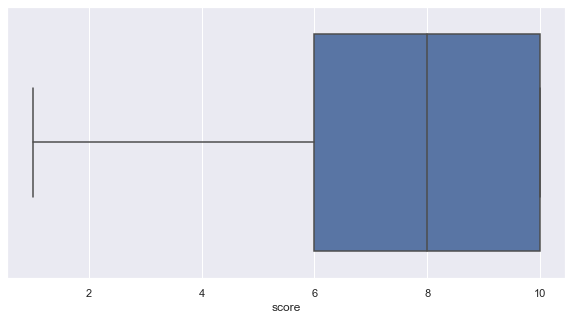

In [75]:
plt.figure(figsize=(10,5))
sns.boxplot(x='score',data=final_df)

No outliers in the rating data found which needs to be imputed for better accuracy.

### Using cross validation techniques to get better results

In [78]:
cross_validate(algoSVD, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    2.8261  2.8146  2.8280  2.8086  2.8205  2.8195  0.0072  
MAE (testset)     2.2159  2.2022  2.2243  2.1985  2.2312  2.2144  0.0125  
Fit time          4.38    4.43    4.43    4.82    11.25   5.86    2.70    
Test time         0.13    0.21    0.13    0.15    0.19    0.16    0.03    


{'test_rmse': array([2.82605017, 2.81455378, 2.82798346, 2.80862077, 2.82051778]),
 'test_mae': array([2.21585554, 2.20222039, 2.22432059, 2.19854864, 2.23115225]),
 'fit_time': (4.3772759437561035,
  4.432104110717773,
  4.432990550994873,
  4.816193580627441,
  11.251021146774292),
 'test_time': (0.13153815269470215,
  0.21164584159851074,
  0.13280153274536133,
  0.14530324935913086,
  0.19048714637756348)}

In [79]:
cross_validate(algo_item, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Evaluating RMSE, MAE of algorithm KNNWithMeans on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    2.9546  3.0439  3.0148  3.0121  3.0077  3.0066  0.0290  
MAE (testset)     2.2900  2.3838  2.3642  2.3589  2.3637  2.3521  0.0322  
Fit time          308.59  292.59  312.64  312.85  313.09  307.95  7.86    
Test time         340.46  358.66  356.77  357.75  35

{'test_rmse': array([2.95460711, 3.04390378, 3.01476555, 3.01206419, 3.00774515]),
 'test_mae': array([2.28997813, 2.3837763 , 2.36420458, 2.35888082, 2.3636693 ]),
 'fit_time': (308.5854604244232,
  292.5852611064911,
  312.64164185523987,
  312.8451135158539,
  313.0920190811157),
 'test_time': (340.4622902870178,
  358.659343957901,
  356.76920890808105,
  357.7473952770233,
  355.29650115966797)}

In [80]:
cross_validate(algo_user, data, measures=['RMSE', 'MAE'], cv=5, verbose=True)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Evaluating RMSE, MAE of algorithm KNNWithMeans on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    2.9951  3.0401  3.0431  3.0816  3.0467  3.0413  0.0276  
MAE (testset)     2.2917  2.3144  2.3181  2.3543  2.3230  2.3203  0.0201  
Fit time          2.78    2.79    2.83    2.74    2.86    2.80    0.04    
Test time         3.97    4.01    3.95    3.96    4.

{'test_rmse': array([2.99508095, 3.04007115, 3.04314493, 3.08161826, 3.04672862]),
 'test_mae': array([2.29168489, 2.3144241 , 2.31812804, 2.35428149, 2.32296609]),
 'fit_time': (2.780561923980713,
  2.7908694744110107,
  2.8277974128723145,
  2.7370903491973877,
  2.8558261394500732),
 'test_time': (3.9677531719207764,
  4.006268501281738,
  3.9544570446014404,
  3.963334321975708,
  4.029083013534546)}

### In what business scenario you should use popularity based Recommendation Systems ?

 - Business scenarios which want to recommend or suggest the most popular or trending products on their platform to each of its users should use Popularity based Recommendation system.
 - Also, this recommendation system analyzes the current trend and is not personalized.
 - Also, as it is does not take personal choices or user characteristics is consideration, businesses which have newly started can use this recommendation system to recommend their trending products to their user base wihtout any user historical data or usage pattern.

   - Examples:-

        - Google News: News filtered by trending and most popular news.
        - YouTube: Trending videos.

### In what business scenario you should use CF based Recommendation Systems ?

 - Business scenarios which want to efficient & smart recommend products to its users based on the user characteristics & personal choices should use CF recommendation systems.
 - This recommendation system works on the similarity between users and their usage patterns by analzying information about users and items.
 - Because of this process, it recommends products to users which they might end up liking or purchasing.

     - Businesses ccan choose the below approaches:
          - <b><u>User based filtering: </u></b> These systems recommend products to a user that similar users have liked. For measuring the similarity between two users we can either use pearson correlation or cosine similarity.
          - <b><u>Item Based Collaborative Filtering: </u></b> Instead of measuring the similarity between users, the item-based CF recommends items based on their similarity with the items that the target user rated.
 
 - Examples:-
     - Online Streaming apps such as Netflix, Hotstar, etc.
     - Online Shopping sites such as Amazon, Flipkart, etc.

### What other possible methods can you think of which can further improve the recommendation for different users ?

 - To further improve the recommendation system's accuracy, we  can propose a method of clustering the products based on their features. Hence, so that inside a cluster, similarity between users does not change significantly. This might help in predicting rating of a user towards a product, then we can only aggregate ratings of users who have high similarity degree with that user inside the cluster to which that product belongs.
 -  Also, we can try to store the product features in a new column and extract the keywords and use the same for recommendations for different users.